In [2]:
#Notebook Link : https://www.kaggle.com/code/gauravduttakiit/generative-adversarial-networks-gans#Deep-Convolutional-GANs

In [3]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

In [4]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 8s 1us/step


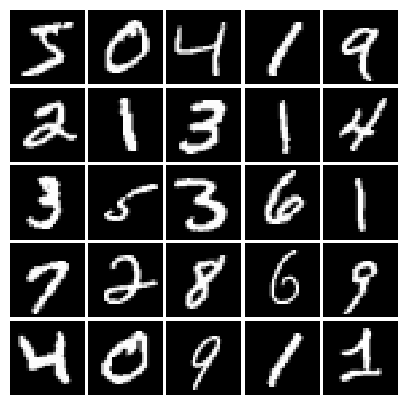

In [5]:
# show a batch
mnist = MNIST(batch_size=25) 
show_images(mnist.X[:25])

In [6]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

In [7]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


In [8]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

In [9]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


In [12]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.InputLayer(input_shape=(784,)),  # Correct shape argument
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
    ])
    return model

In [13]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


C:\Users\HP\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [18]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.InputLayer(input_shape=(noise_dim,)),  # Correct shape argument
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, activation='tanh')
    ])
    return model

In [19]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


In [20]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

In [21]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [22]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 0


In [23]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

In [24]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

Epoch: 0, Iter: 0, D: 1.187, G:0.7581
Instructions for updating:
Use tf.identity with explicit device placement instead.


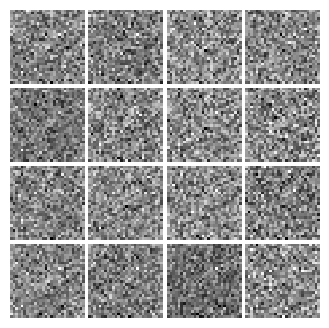

Epoch: 0, Iter: 20, D: 0.5801, G:1.02


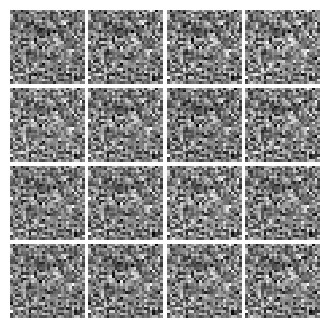

Epoch: 0, Iter: 40, D: 0.4982, G:1.386


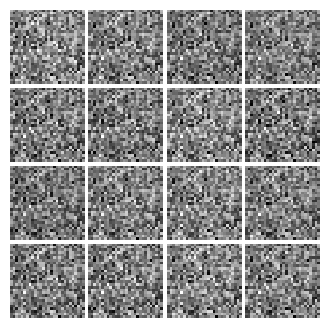

Epoch: 0, Iter: 60, D: 2.024, G:0.5807


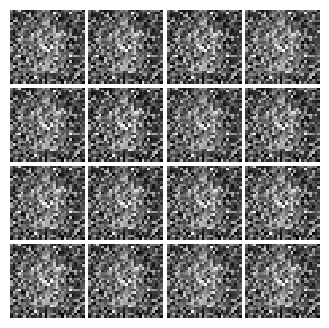

Epoch: 0, Iter: 80, D: 1.383, G:1.207


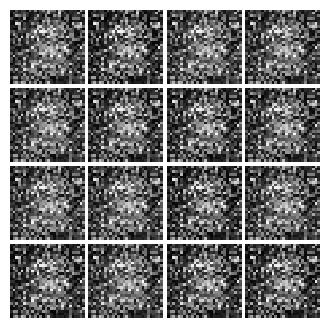

Epoch: 0, Iter: 100, D: 1.265, G:1.439


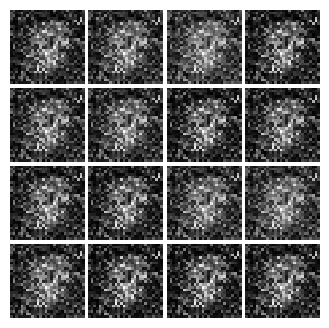

Epoch: 0, Iter: 120, D: 1.58, G:1.089


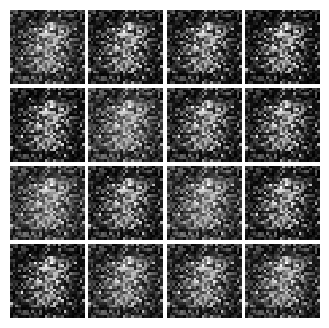

Epoch: 0, Iter: 140, D: 1.129, G:1.158


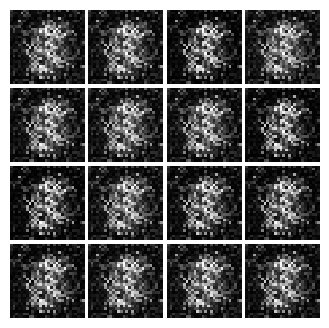

Epoch: 0, Iter: 160, D: 1.437, G:0.6059


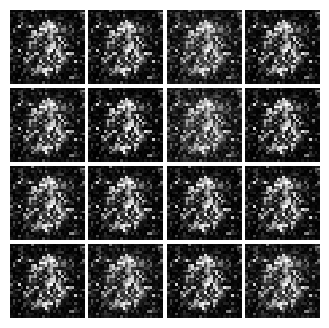

Epoch: 0, Iter: 180, D: 1.255, G:1.939


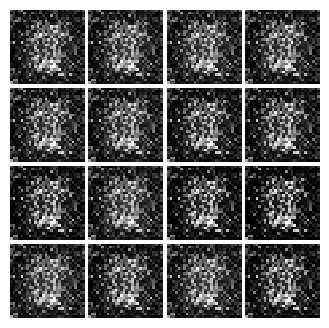

Epoch: 0, Iter: 200, D: 1.143, G:1.454


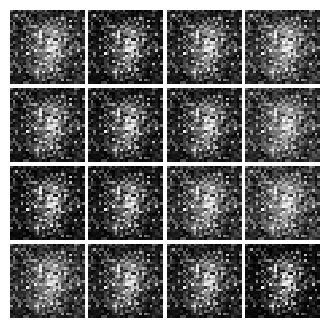

Epoch: 0, Iter: 220, D: 1.946, G:1.249


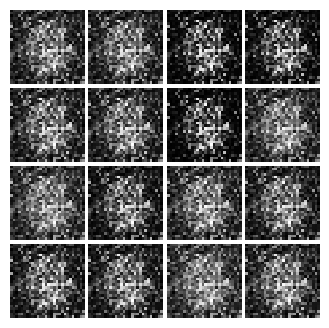

Epoch: 0, Iter: 240, D: 1.304, G:0.8013


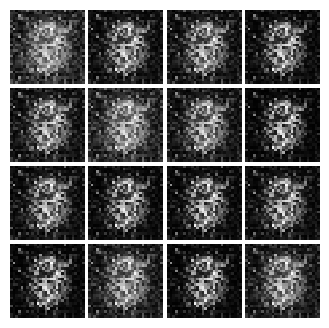

Epoch: 0, Iter: 260, D: 1.045, G:1.311


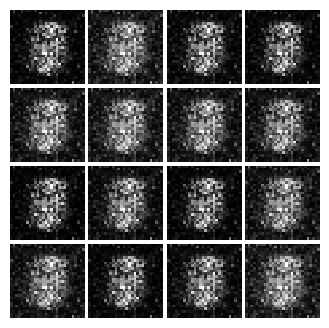

Epoch: 0, Iter: 280, D: 0.7177, G:1.773


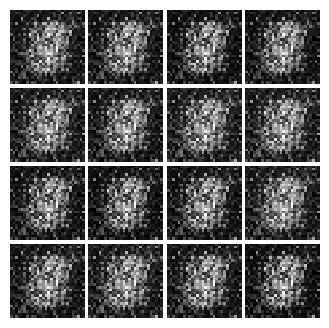

Epoch: 0, Iter: 300, D: 0.7464, G:2.046


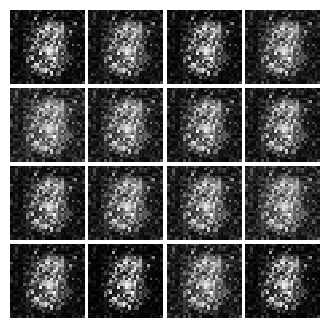

Epoch: 0, Iter: 320, D: 0.7757, G:2.163


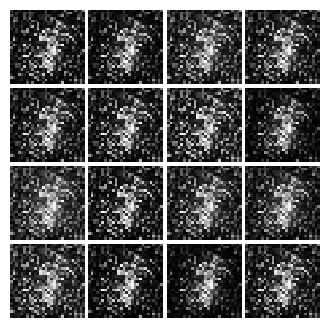

Epoch: 0, Iter: 340, D: 0.9363, G:2.102


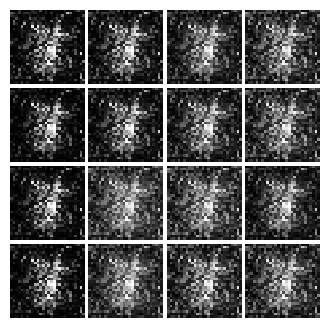

Epoch: 0, Iter: 360, D: 0.8442, G:2.107


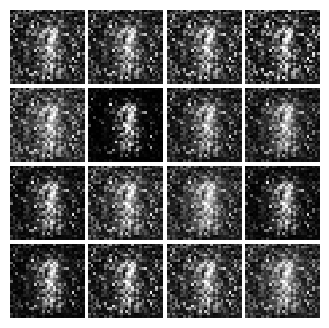

Epoch: 0, Iter: 380, D: 0.8491, G:1.713


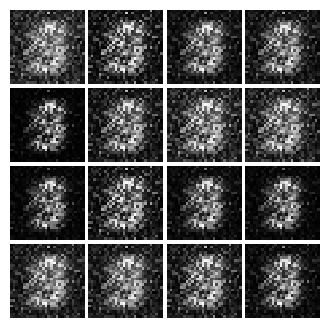

Epoch: 0, Iter: 400, D: 1.47, G:1.428


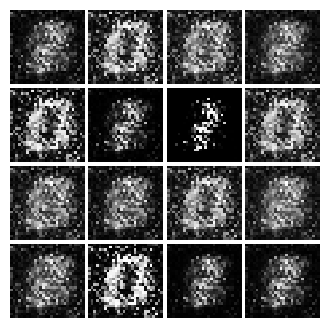

Epoch: 0, Iter: 420, D: 1.517, G:0.553


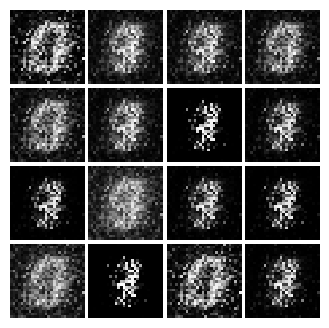

Epoch: 0, Iter: 440, D: 1.219, G:1.773


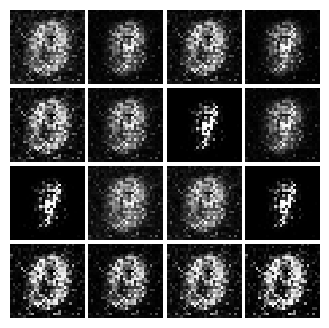

Epoch: 0, Iter: 460, D: 0.9404, G:0.9723


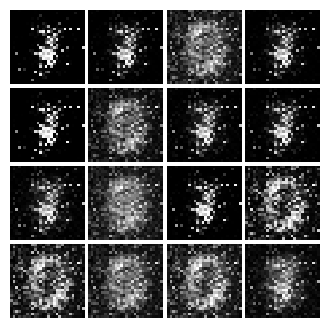

Epoch: 1, Iter: 480, D: 0.9274, G:1.568


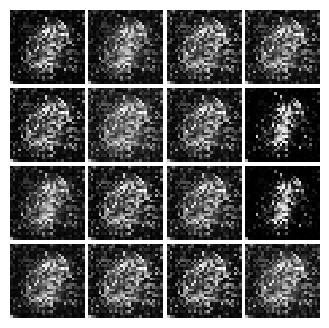

Epoch: 1, Iter: 500, D: 1.379, G:1.431


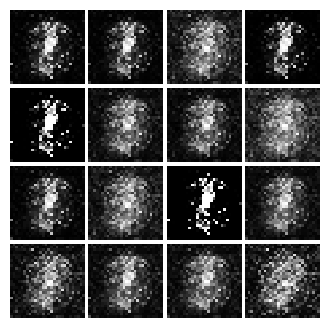

Epoch: 1, Iter: 520, D: 1.18, G:1.545


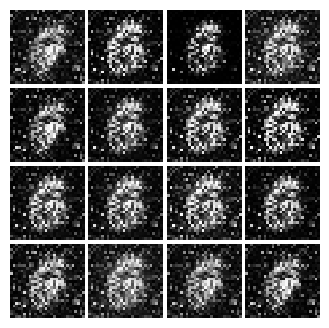

Epoch: 1, Iter: 540, D: 1.198, G:1.535


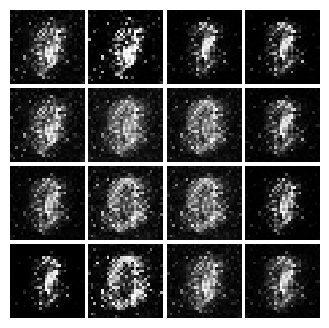

Epoch: 1, Iter: 560, D: 1.426, G:0.6951


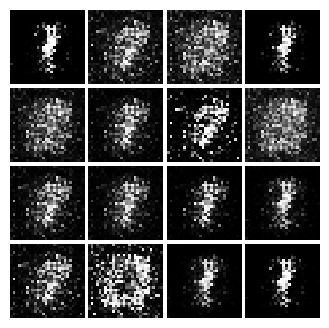

Epoch: 1, Iter: 580, D: 1.322, G:1.118


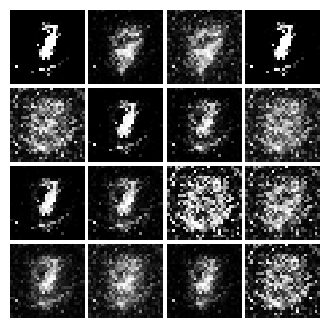

Epoch: 1, Iter: 600, D: 1.044, G:1.874


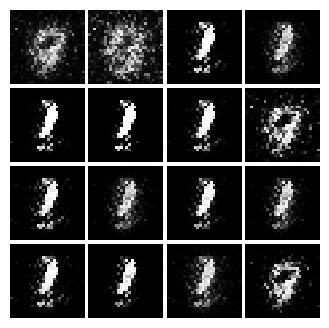

Epoch: 1, Iter: 620, D: 0.908, G:1.34


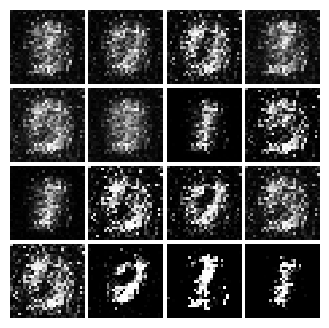

Epoch: 1, Iter: 640, D: 0.8452, G:1.757


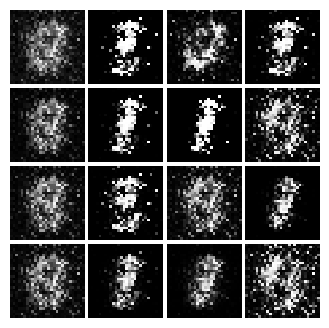

Epoch: 1, Iter: 660, D: 0.9824, G:1.819


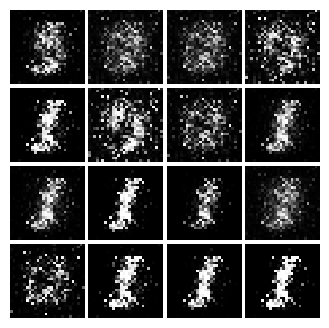

Epoch: 1, Iter: 680, D: 1.383, G:4.202


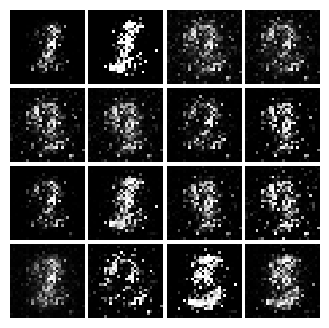

Epoch: 1, Iter: 700, D: 0.9301, G:0.3121


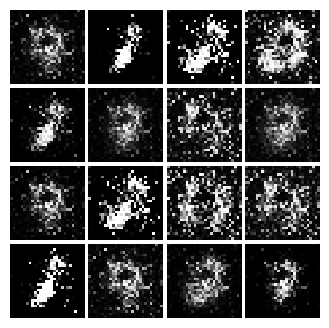

Epoch: 1, Iter: 720, D: 0.9258, G:2.407


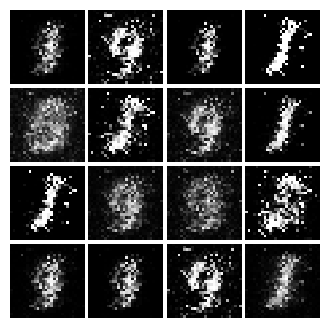

Epoch: 1, Iter: 740, D: 1.224, G:0.7222


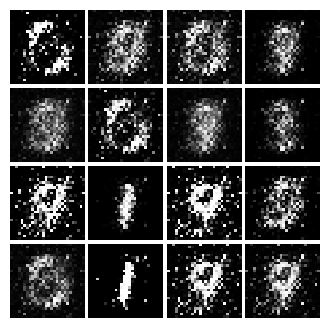

Epoch: 1, Iter: 760, D: 1.095, G:1.42


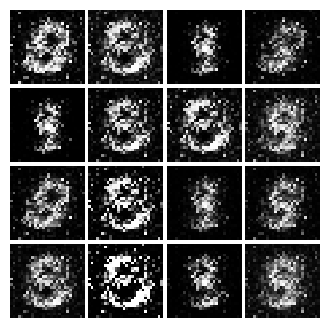

Epoch: 1, Iter: 780, D: 1.392, G:1.677


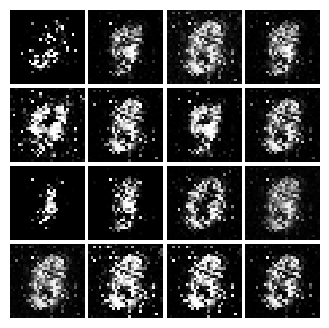

Epoch: 1, Iter: 800, D: 1.001, G:2.879


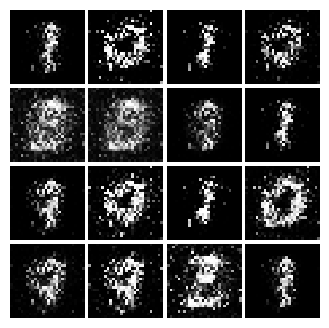

Epoch: 1, Iter: 820, D: 0.9999, G:1.11


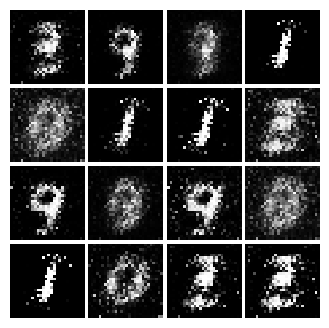

Epoch: 1, Iter: 840, D: 1.07, G:1.079


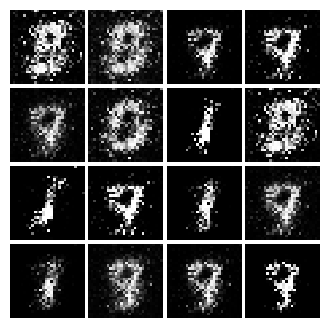

Epoch: 1, Iter: 860, D: 1.34, G:1.889


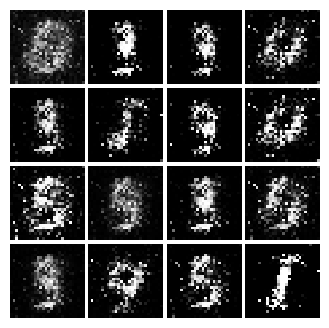

Epoch: 1, Iter: 880, D: 1.092, G:0.9632


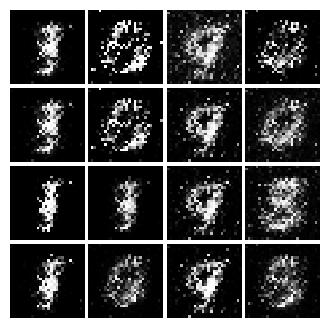

Epoch: 1, Iter: 900, D: 1.299, G:1.145


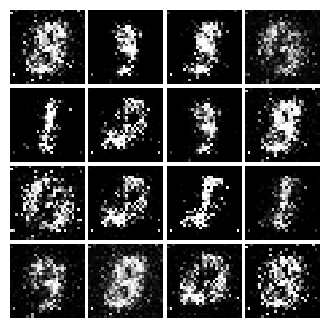

Epoch: 1, Iter: 920, D: 1.104, G:1.102


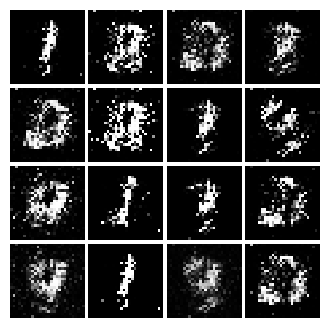

Epoch: 2, Iter: 940, D: 1.331, G:1.353


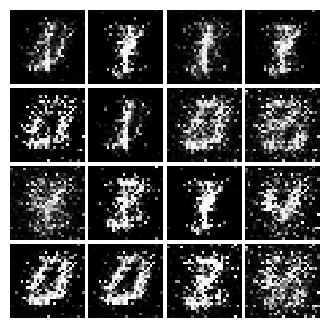

Epoch: 2, Iter: 960, D: 1.244, G:1.131


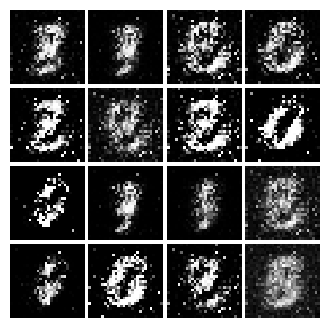

Epoch: 2, Iter: 980, D: 0.8885, G:2.318


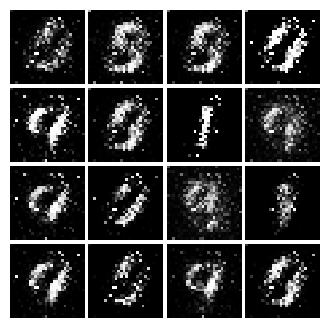

Epoch: 2, Iter: 1000, D: 1.013, G:1.529


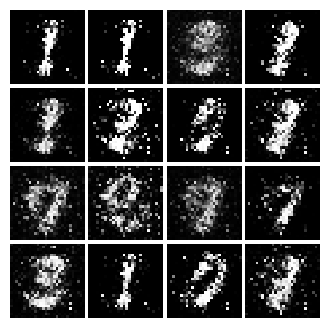

Epoch: 2, Iter: 1020, D: 1.019, G:1.652


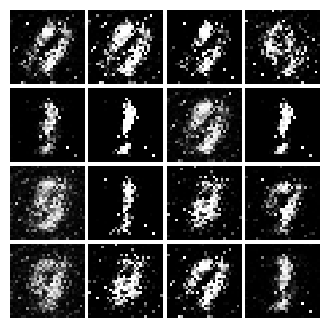

Epoch: 2, Iter: 1040, D: 0.9856, G:1.322


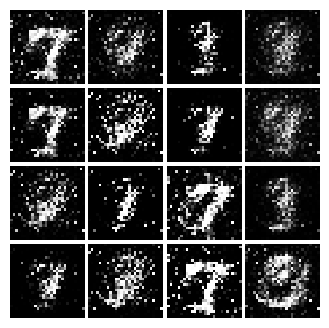

Epoch: 2, Iter: 1060, D: 1.345, G:1.133


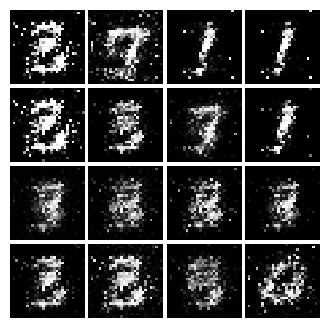

Epoch: 2, Iter: 1080, D: 1.118, G:1.727


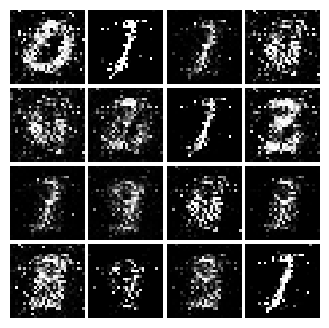

Epoch: 2, Iter: 1100, D: 1.251, G:1.065


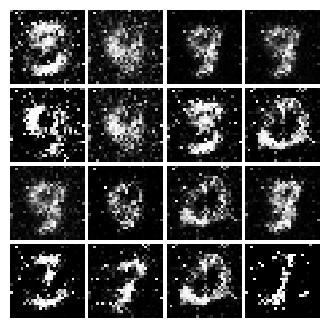

Epoch: 2, Iter: 1120, D: 1.111, G:1.527


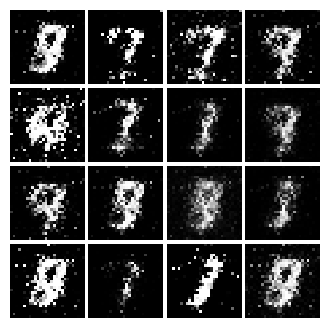

Epoch: 2, Iter: 1140, D: 1.224, G:1.21


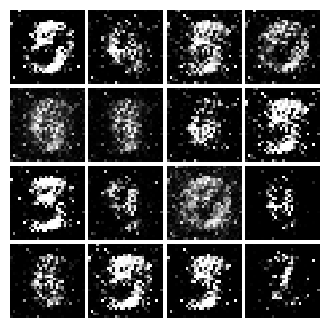

Epoch: 2, Iter: 1160, D: 1.165, G:1.46


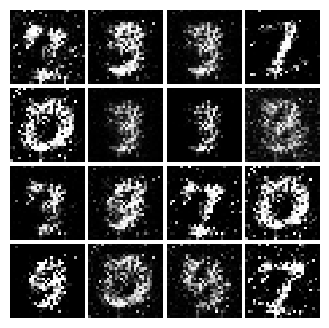

Epoch: 2, Iter: 1180, D: 1.264, G:0.8322


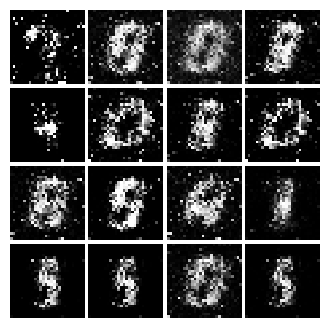

Epoch: 2, Iter: 1200, D: 1.333, G:1.122


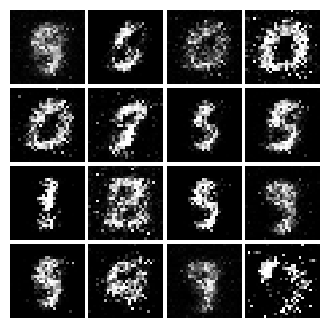

Epoch: 2, Iter: 1220, D: 1.359, G:1.41


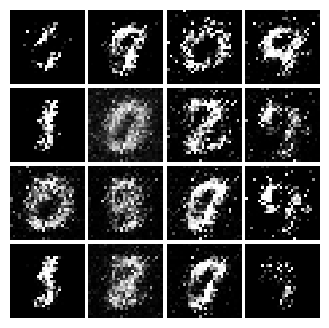

Epoch: 2, Iter: 1240, D: 1.19, G:0.9836


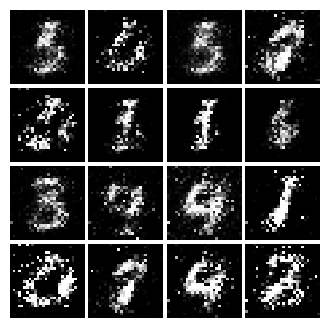

Epoch: 2, Iter: 1260, D: 1.309, G:1.089


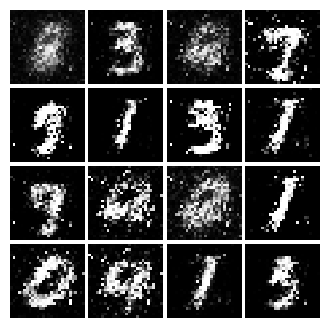

Epoch: 2, Iter: 1280, D: 1.318, G:0.9214


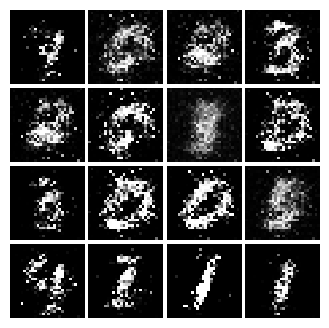

Epoch: 2, Iter: 1300, D: 1.159, G:0.9624


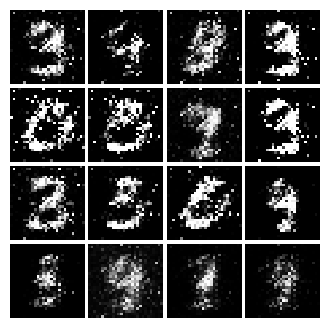

Epoch: 2, Iter: 1320, D: 1.157, G:1.445


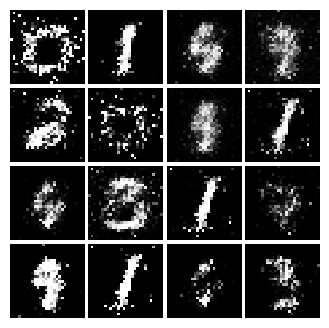

Epoch: 2, Iter: 1340, D: 1.427, G:0.912


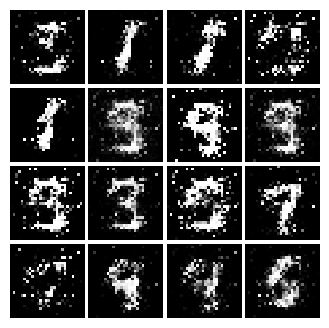

Epoch: 2, Iter: 1360, D: 1.325, G:1.247


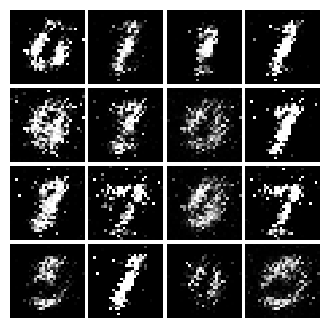

Epoch: 2, Iter: 1380, D: 1.084, G:1.186


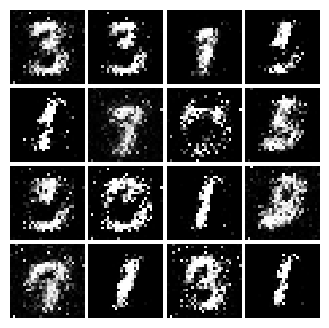

Epoch: 2, Iter: 1400, D: 1.19, G:0.8981


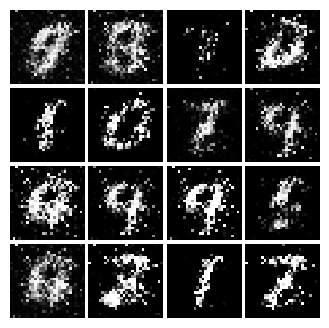

Epoch: 3, Iter: 1420, D: 1.365, G:1.318


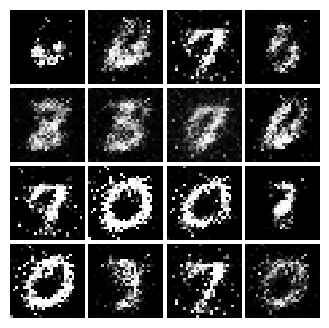

Epoch: 3, Iter: 1440, D: 1.209, G:1.227


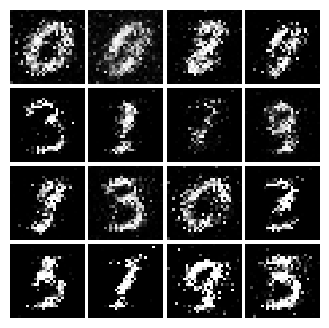

Epoch: 3, Iter: 1460, D: 1.137, G:0.8766


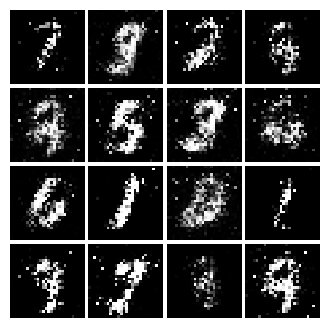

Epoch: 3, Iter: 1480, D: 1.112, G:1.177


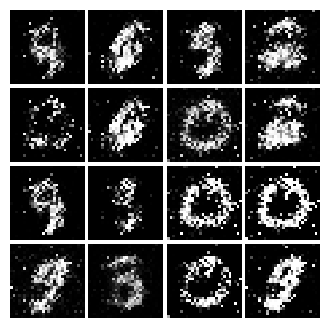

Epoch: 3, Iter: 1500, D: 1.36, G:1.107


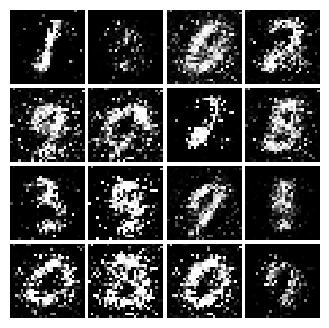

Epoch: 3, Iter: 1520, D: 1.461, G:1.042


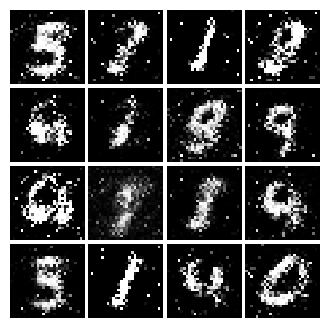

Epoch: 3, Iter: 1540, D: 1.272, G:0.8262


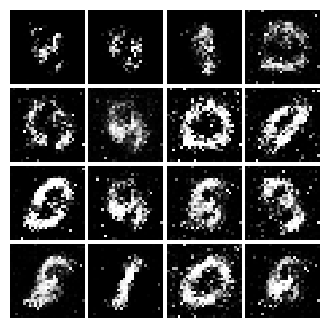

Epoch: 3, Iter: 1560, D: 1.297, G:0.9339


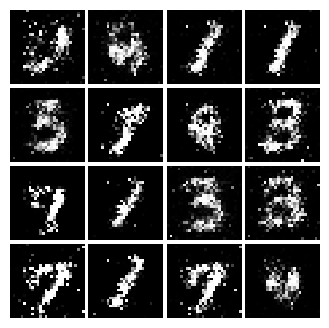

Epoch: 3, Iter: 1580, D: 1.166, G:1.219


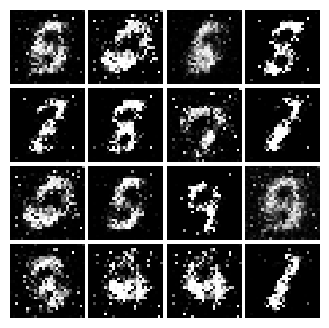

Epoch: 3, Iter: 1600, D: 1.238, G:0.9069


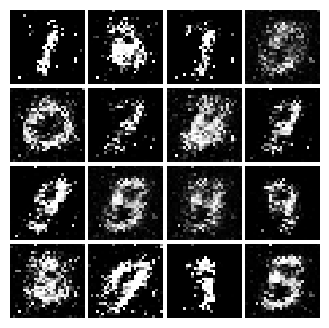

Epoch: 3, Iter: 1620, D: 1.289, G:0.9424


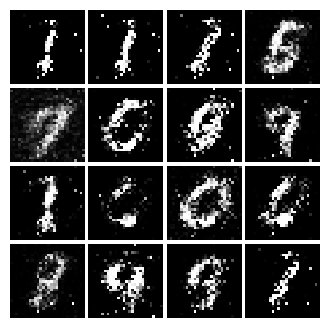

Epoch: 3, Iter: 1640, D: 1.437, G:0.8206


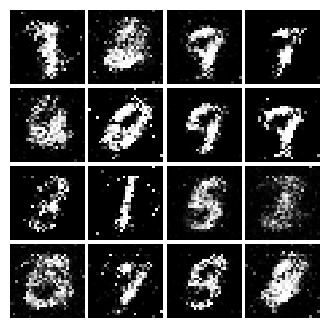

Epoch: 3, Iter: 1660, D: 1.105, G:1.402


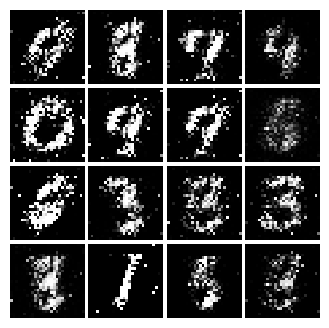

Epoch: 3, Iter: 1680, D: 1.225, G:0.9999


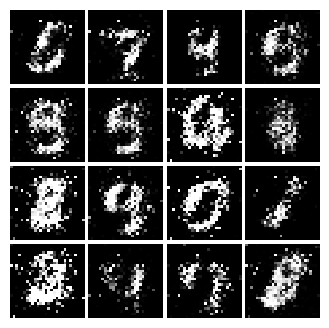

Epoch: 3, Iter: 1700, D: 1.566, G:0.7905


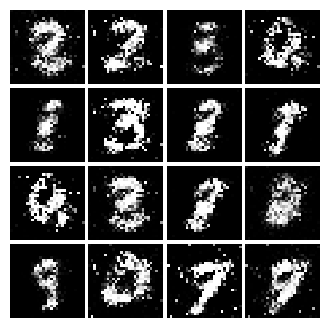

Epoch: 3, Iter: 1720, D: 1.316, G:0.8931


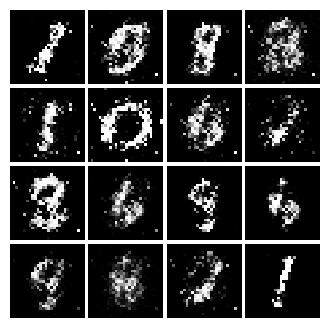

Epoch: 3, Iter: 1740, D: 1.172, G:0.9971


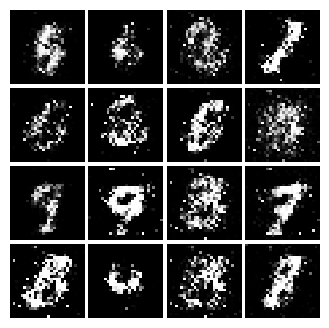

Epoch: 3, Iter: 1760, D: 1.179, G:0.9166


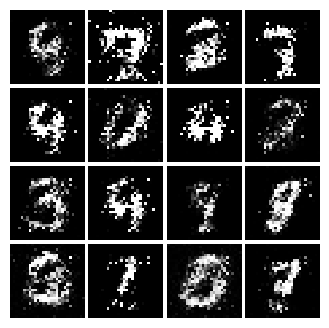

Epoch: 3, Iter: 1780, D: 1.132, G:1.083


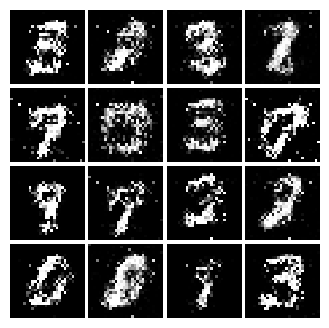

Epoch: 3, Iter: 1800, D: 1.461, G:0.7715


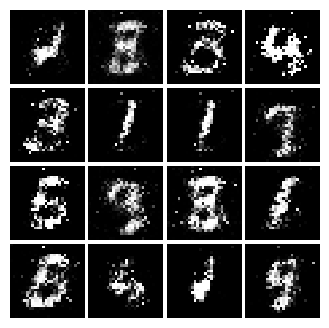

Epoch: 3, Iter: 1820, D: 1.214, G:0.899


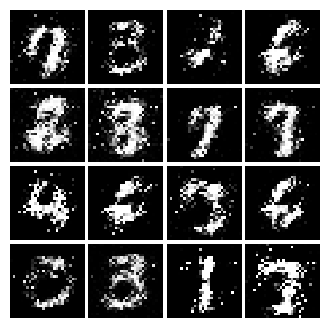

Epoch: 3, Iter: 1840, D: 1.253, G:1.13


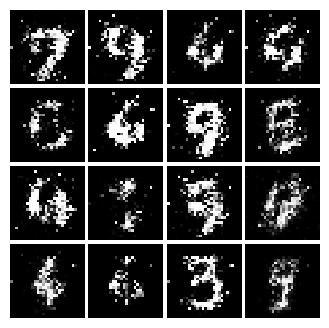

Epoch: 3, Iter: 1860, D: 1.3, G:0.9309


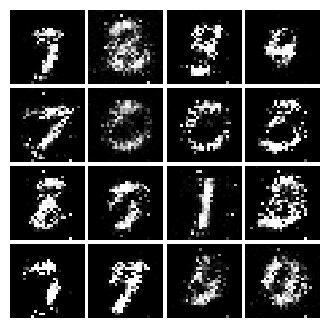

Epoch: 4, Iter: 1880, D: 1.243, G:1.059


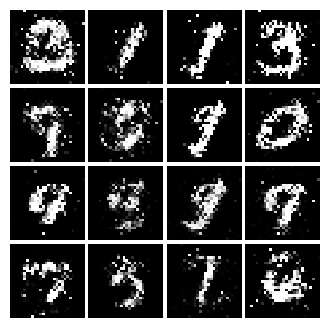

Epoch: 4, Iter: 1900, D: 1.288, G:0.9156


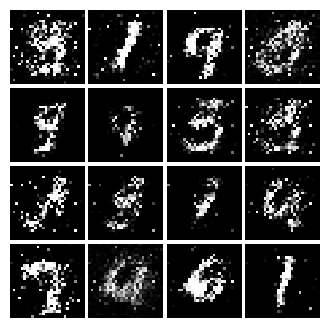

Epoch: 4, Iter: 1920, D: 1.235, G:0.994


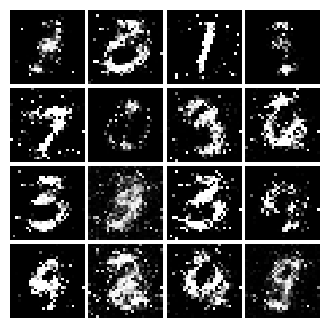

Epoch: 4, Iter: 1940, D: 1.33, G:0.9864


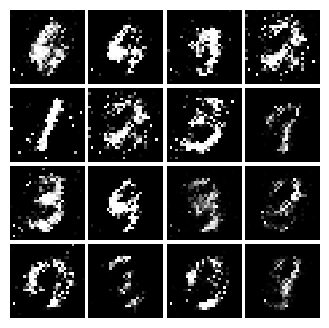

Epoch: 4, Iter: 1960, D: 1.251, G:0.9137


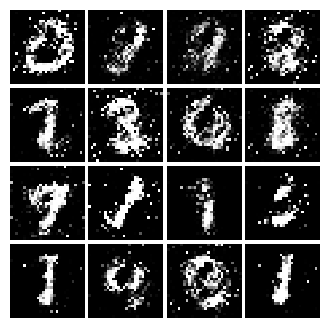

Epoch: 4, Iter: 1980, D: 1.232, G:0.8881


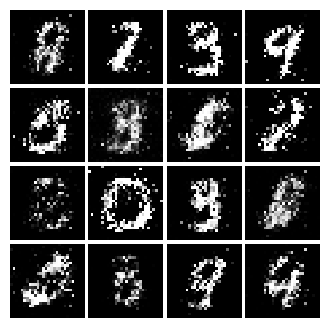

Epoch: 4, Iter: 2000, D: 1.418, G:0.8274


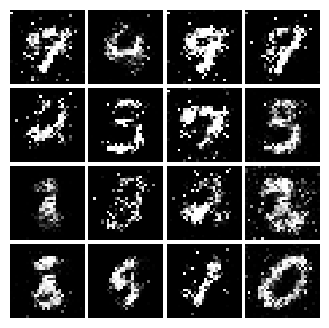

Epoch: 4, Iter: 2020, D: 1.31, G:0.9085


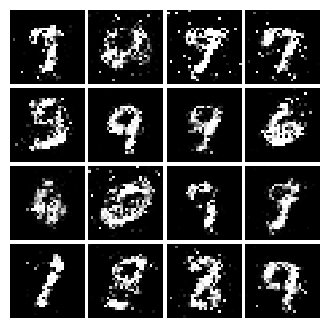

Epoch: 4, Iter: 2040, D: 1.285, G:0.8385


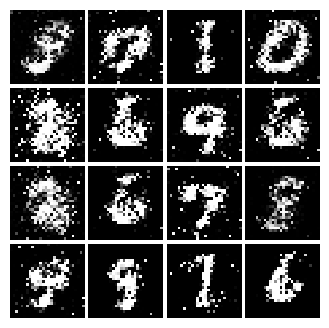

Epoch: 4, Iter: 2060, D: 1.37, G:1.134


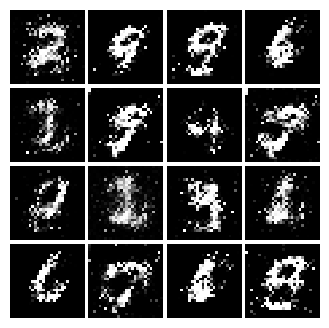

Epoch: 4, Iter: 2080, D: 1.33, G:0.9105


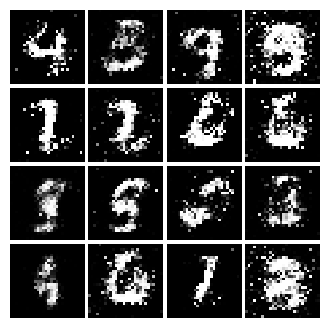

Epoch: 4, Iter: 2100, D: 1.296, G:0.8876


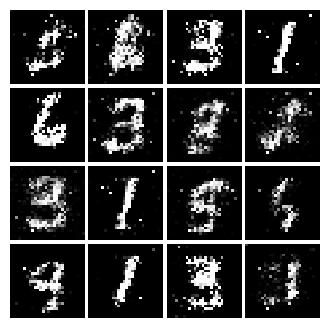

Epoch: 4, Iter: 2120, D: 1.356, G:0.8069


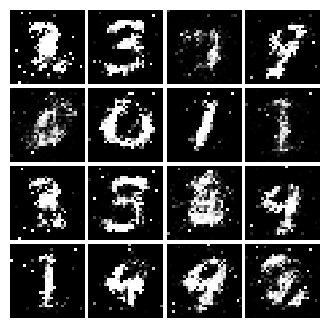

Epoch: 4, Iter: 2140, D: 1.33, G:0.77


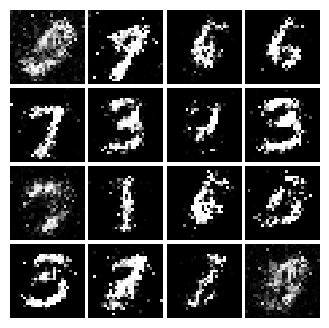

Epoch: 4, Iter: 2160, D: 1.391, G:0.8448


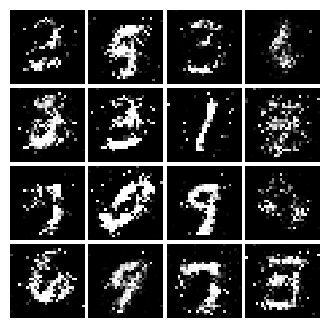

Epoch: 4, Iter: 2180, D: 1.414, G:0.8405


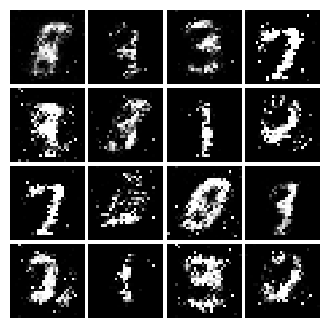

Epoch: 4, Iter: 2200, D: 1.228, G:0.9048


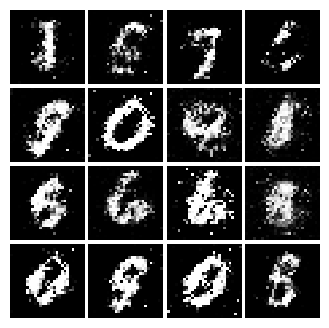

Epoch: 4, Iter: 2220, D: 1.335, G:0.8472


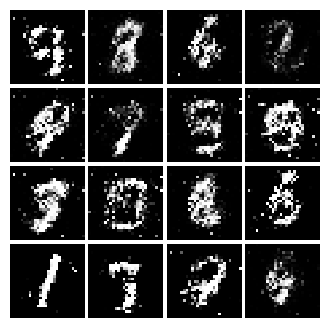

Epoch: 4, Iter: 2240, D: 1.319, G:0.75


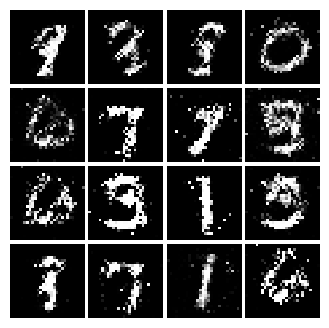

Epoch: 4, Iter: 2260, D: 1.247, G:0.9213


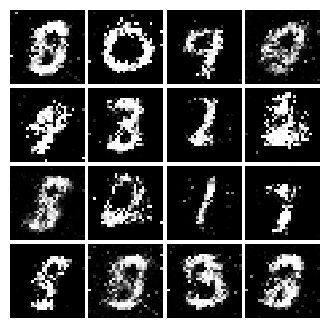

Epoch: 4, Iter: 2280, D: 1.252, G:0.7846


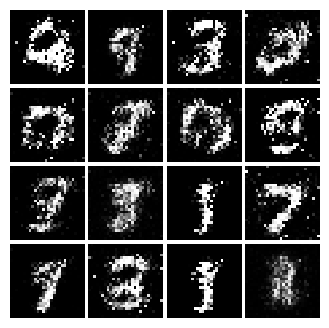

Epoch: 4, Iter: 2300, D: 1.284, G:0.9002


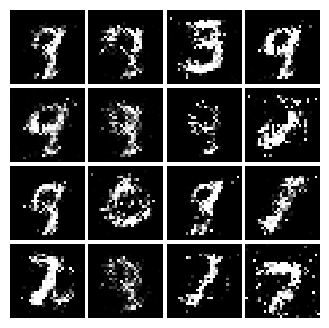

Epoch: 4, Iter: 2320, D: 1.255, G:0.9891


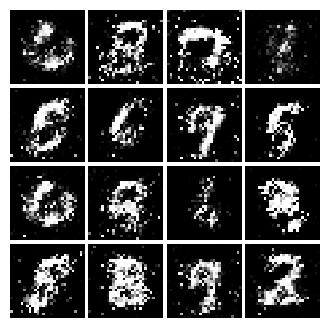

Epoch: 4, Iter: 2340, D: 1.09, G:1.05


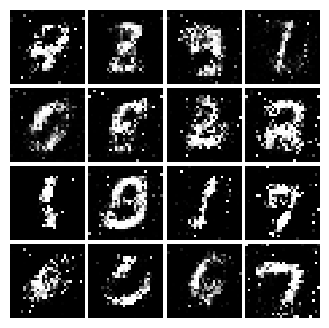

Epoch: 5, Iter: 2360, D: 1.3, G:0.9497


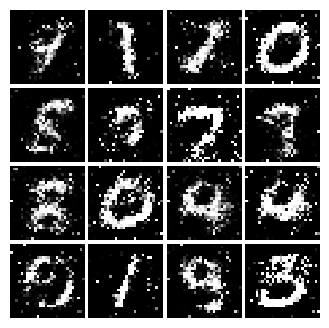

Epoch: 5, Iter: 2380, D: 1.271, G:1.024


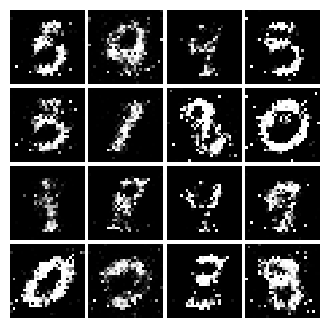

Epoch: 5, Iter: 2400, D: 1.316, G:0.9097


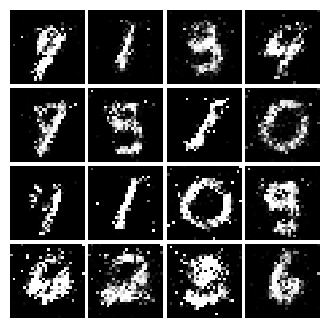

Epoch: 5, Iter: 2420, D: 1.275, G:1.039


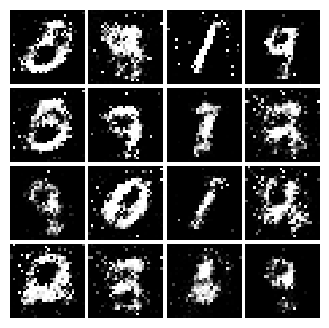

Epoch: 5, Iter: 2440, D: 1.314, G:0.8845


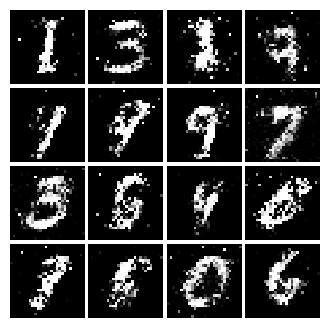

Epoch: 5, Iter: 2460, D: 1.254, G:0.9021


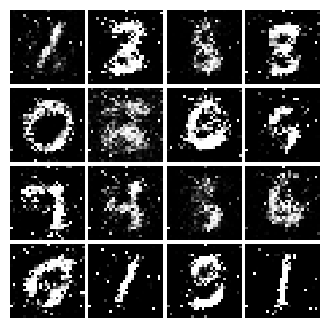

Epoch: 5, Iter: 2480, D: 1.264, G:1.423


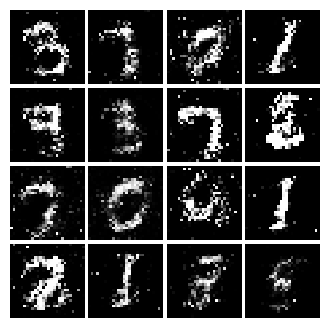

Epoch: 5, Iter: 2500, D: 1.261, G:0.9425


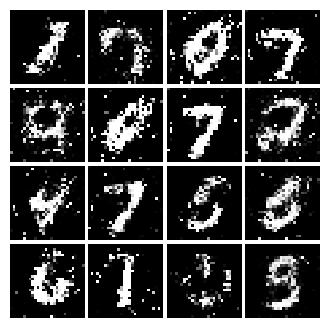

Epoch: 5, Iter: 2520, D: 1.376, G:0.8076


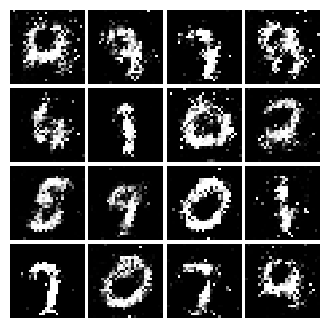

Epoch: 5, Iter: 2540, D: 1.305, G:0.7947


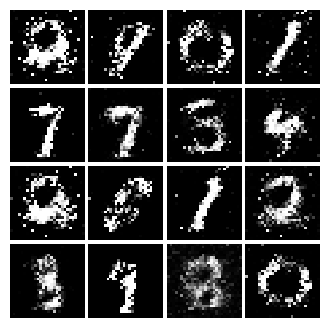

Epoch: 5, Iter: 2560, D: 1.375, G:0.8009


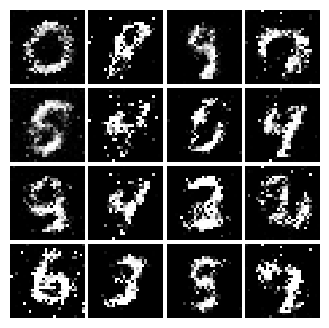

Epoch: 5, Iter: 2580, D: 1.724, G:1.866


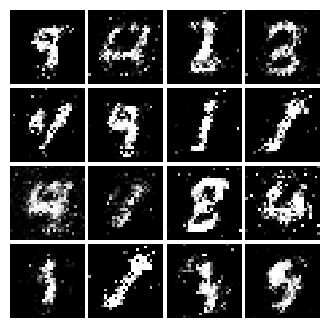

Epoch: 5, Iter: 2600, D: 1.485, G:0.8444


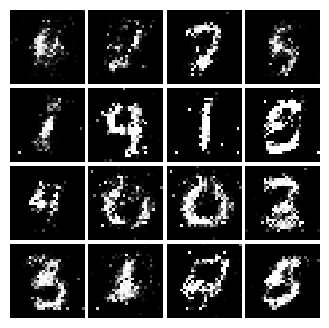

Epoch: 5, Iter: 2620, D: 1.254, G:0.8465


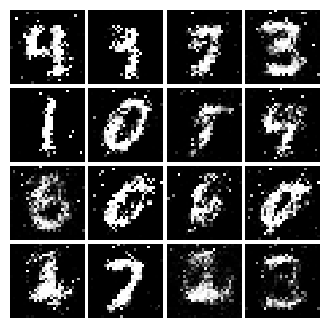

Epoch: 5, Iter: 2640, D: 1.318, G:0.9485


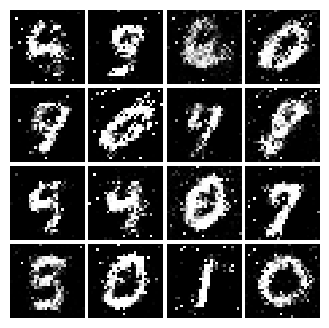

Epoch: 5, Iter: 2660, D: 1.238, G:0.8407


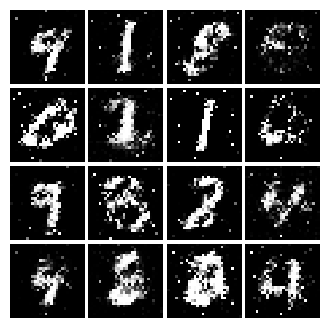

Epoch: 5, Iter: 2680, D: 1.329, G:0.87


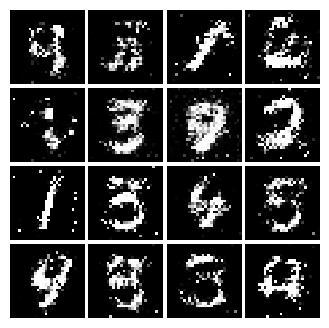

Epoch: 5, Iter: 2700, D: 1.291, G:0.7632


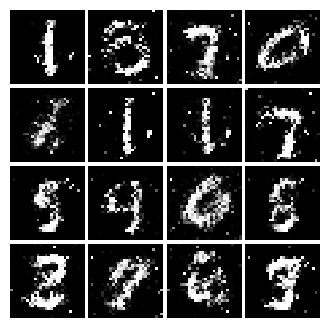

Epoch: 5, Iter: 2720, D: 1.305, G:0.8897


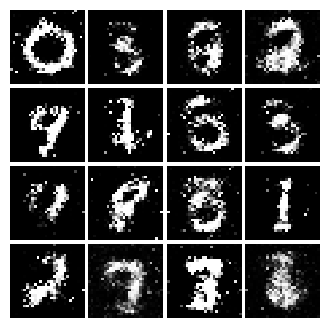

Epoch: 5, Iter: 2740, D: 1.39, G:0.9665


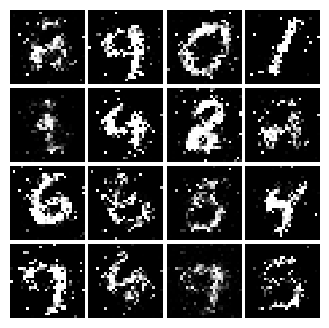

Epoch: 5, Iter: 2760, D: 1.243, G:0.8634


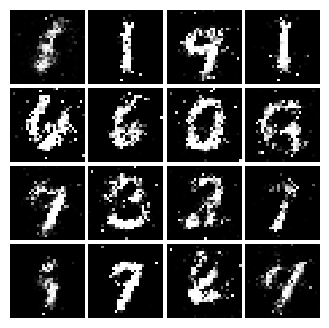

Epoch: 5, Iter: 2780, D: 1.263, G:0.8447


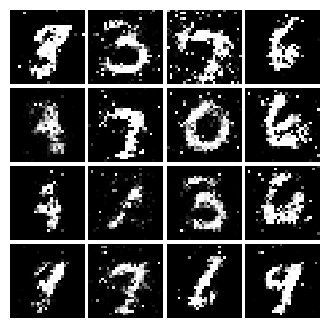

Epoch: 5, Iter: 2800, D: 1.134, G:0.8998


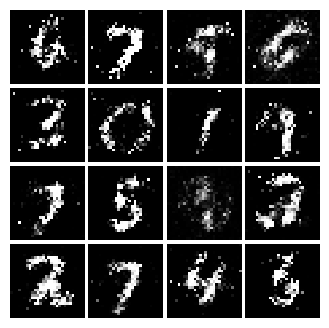

Epoch: 6, Iter: 2820, D: 1.363, G:1.139


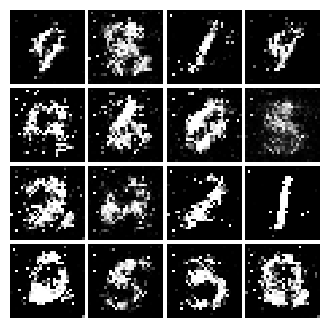

Epoch: 6, Iter: 2840, D: 1.301, G:0.8172


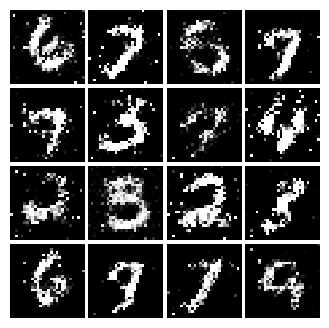

Epoch: 6, Iter: 2860, D: 1.348, G:0.8772


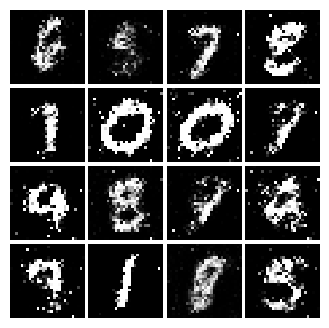

Epoch: 6, Iter: 2880, D: 1.319, G:0.9536


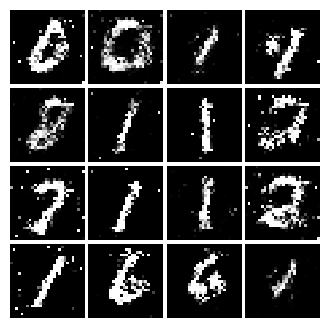

Epoch: 6, Iter: 2900, D: 1.347, G:0.8178


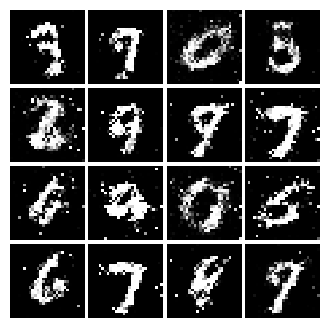

Epoch: 6, Iter: 2920, D: 1.35, G:0.852


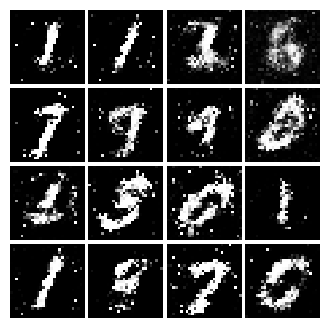

Epoch: 6, Iter: 2940, D: 1.298, G:0.8294


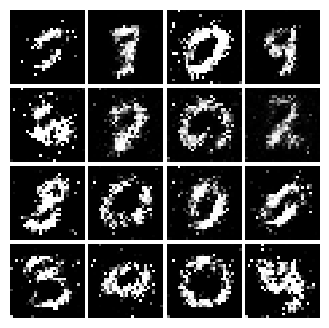

Epoch: 6, Iter: 2960, D: 1.343, G:0.8574


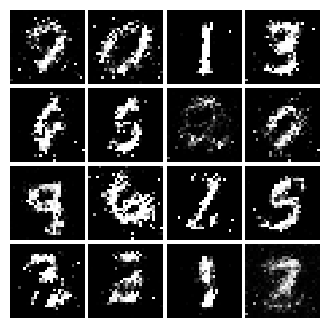

Epoch: 6, Iter: 2980, D: 1.302, G:0.7425


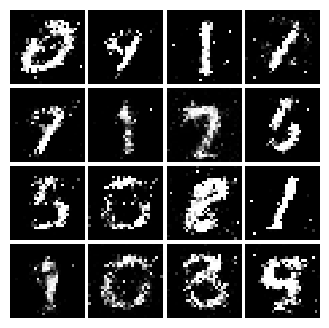

Epoch: 6, Iter: 3000, D: 1.303, G:0.8835


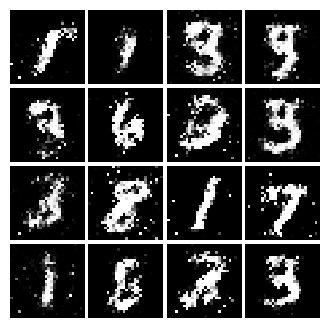

Epoch: 6, Iter: 3020, D: 1.382, G:0.8292


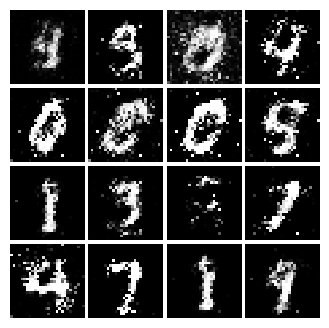

Epoch: 6, Iter: 3040, D: 1.35, G:1.365


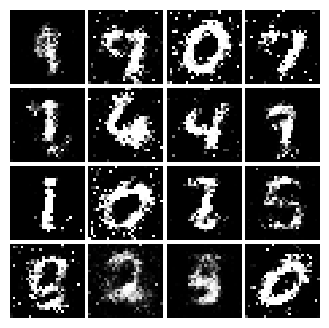

Epoch: 6, Iter: 3060, D: 1.335, G:0.7908


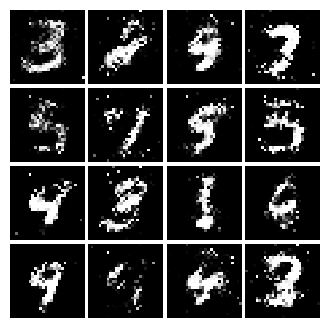

Epoch: 6, Iter: 3080, D: 1.322, G:0.7842


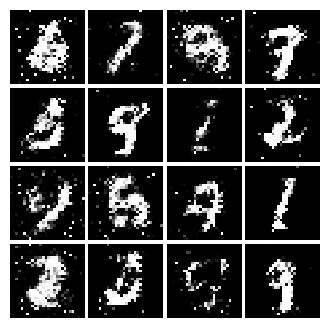

Epoch: 6, Iter: 3100, D: 1.366, G:0.7544


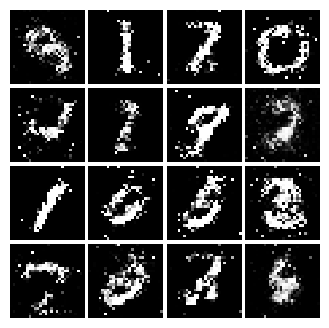

Epoch: 6, Iter: 3120, D: 1.335, G:0.7763


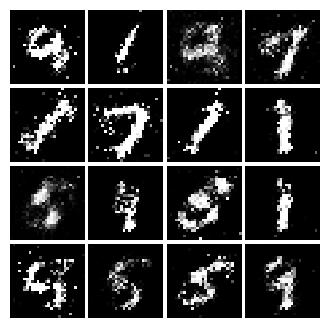

Epoch: 6, Iter: 3140, D: 1.387, G:0.9471


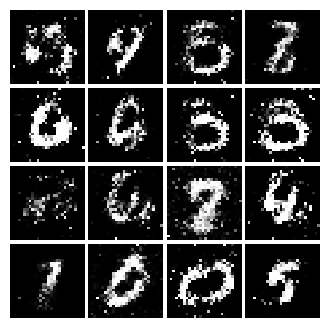

Epoch: 6, Iter: 3160, D: 1.311, G:0.8238


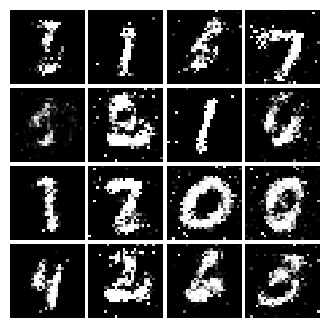

Epoch: 6, Iter: 3180, D: 1.228, G:0.8207


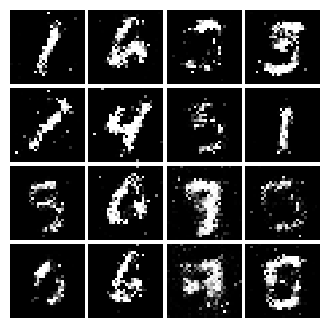

Epoch: 6, Iter: 3200, D: 1.429, G:1.047


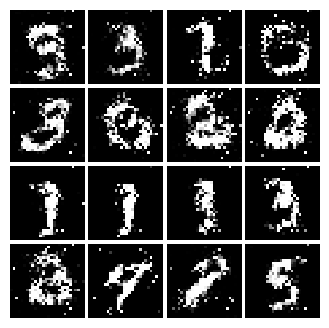

Epoch: 6, Iter: 3220, D: 1.257, G:0.8996


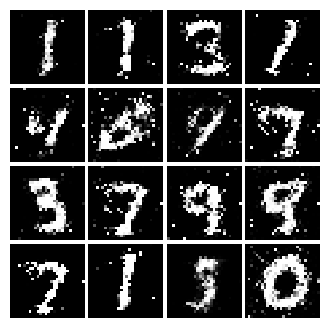

Epoch: 6, Iter: 3240, D: 1.294, G:0.9313


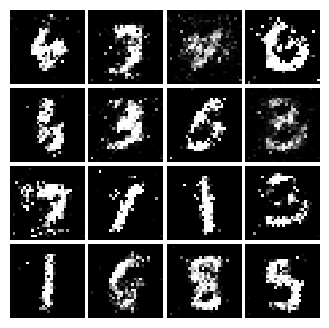

Epoch: 6, Iter: 3260, D: 1.364, G:0.8824


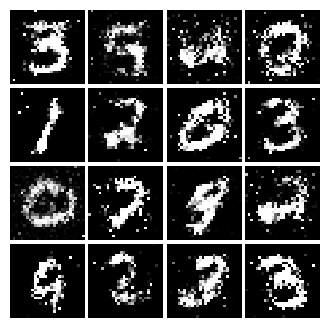

Epoch: 6, Iter: 3280, D: 1.253, G:0.7433


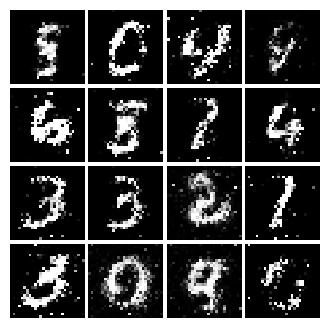

Epoch: 7, Iter: 3300, D: 1.208, G:0.8592


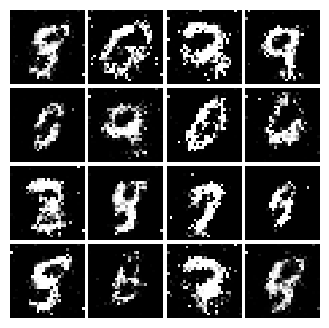

Epoch: 7, Iter: 3320, D: 1.267, G:0.8354


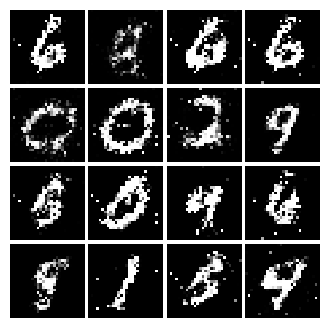

Epoch: 7, Iter: 3340, D: 1.325, G:0.8793


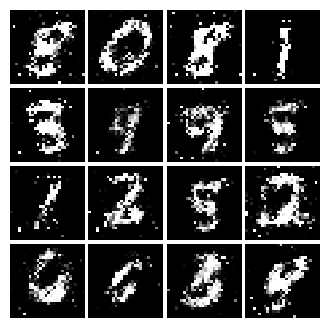

Epoch: 7, Iter: 3360, D: 1.291, G:0.8888


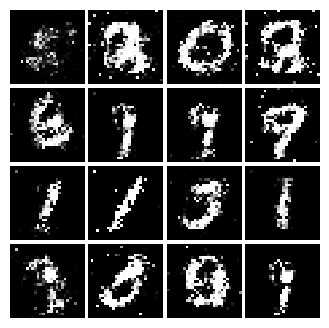

Epoch: 7, Iter: 3380, D: 1.364, G:0.8145


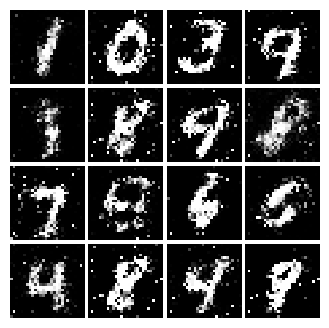

Epoch: 7, Iter: 3400, D: 1.49, G:0.756


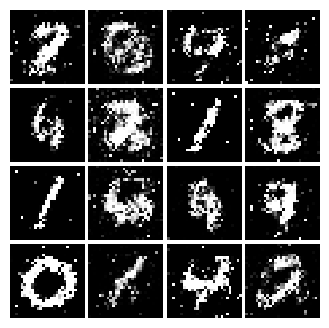

Epoch: 7, Iter: 3420, D: 1.245, G:0.9801


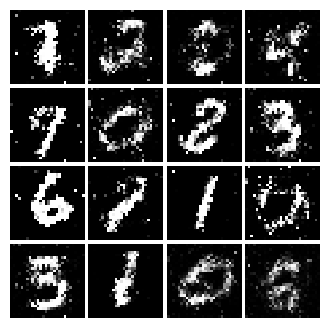

Epoch: 7, Iter: 3440, D: 1.282, G:0.8998


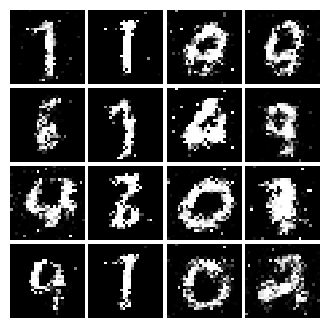

Epoch: 7, Iter: 3460, D: 1.142, G:0.9596


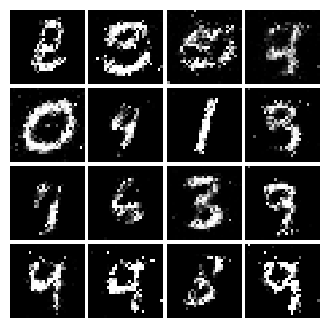

Epoch: 7, Iter: 3480, D: 1.35, G:0.7262


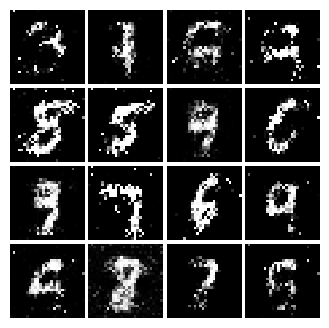

Epoch: 7, Iter: 3500, D: 1.336, G:0.8367


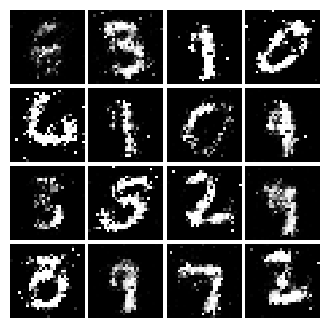

Epoch: 7, Iter: 3520, D: 1.364, G:0.8517


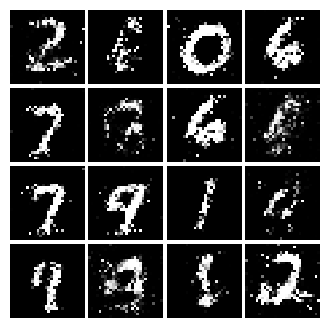

Epoch: 7, Iter: 3540, D: 1.313, G:0.9624


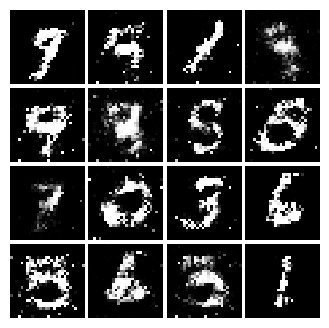

Epoch: 7, Iter: 3560, D: 1.325, G:0.8342


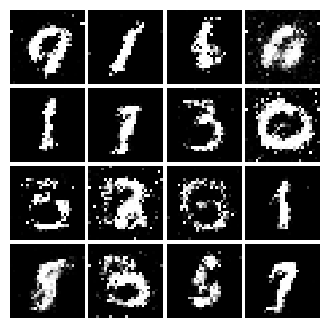

Epoch: 7, Iter: 3580, D: 1.315, G:0.8052


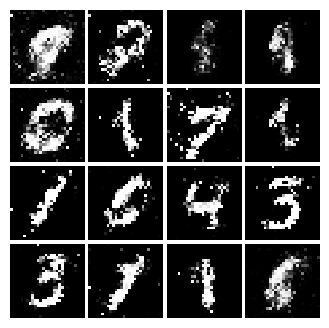

Epoch: 7, Iter: 3600, D: 1.324, G:0.7659


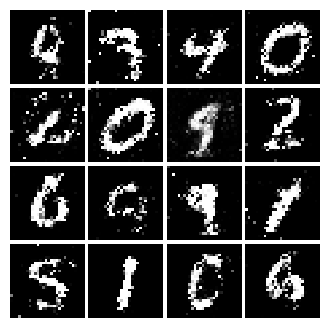

Epoch: 7, Iter: 3620, D: 1.338, G:0.8092


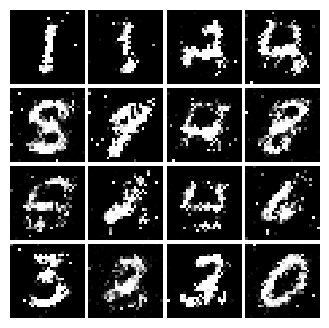

Epoch: 7, Iter: 3640, D: 1.374, G:0.8701


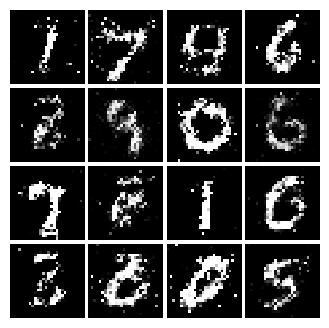

Epoch: 7, Iter: 3660, D: 1.248, G:0.8265


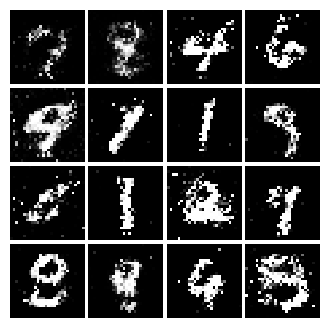

Epoch: 7, Iter: 3680, D: 1.207, G:0.9765


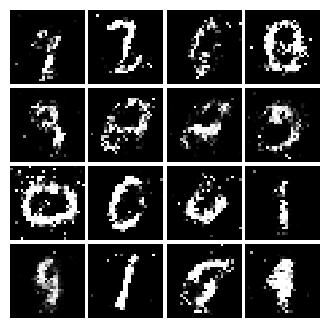

Epoch: 7, Iter: 3700, D: 1.295, G:0.8103


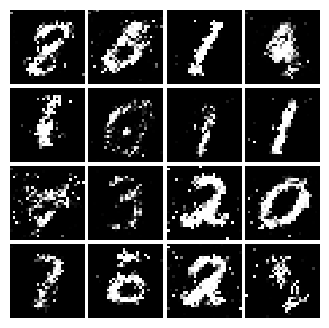

Epoch: 7, Iter: 3720, D: 1.285, G:0.8798


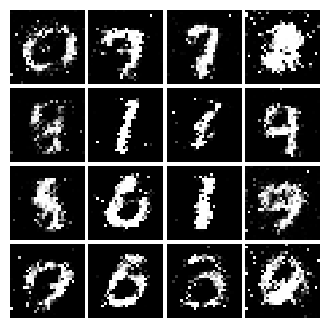

Epoch: 7, Iter: 3740, D: 1.341, G:0.7754


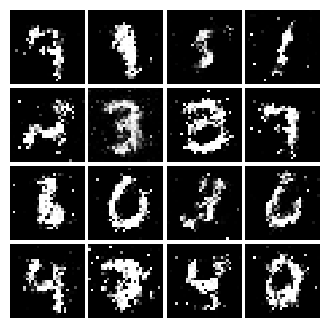

Epoch: 8, Iter: 3760, D: 1.354, G:0.8488


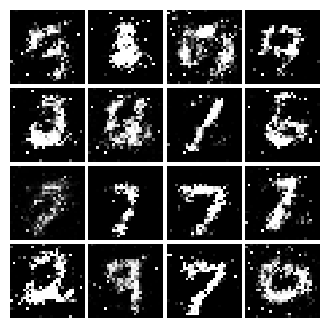

Epoch: 8, Iter: 3780, D: 1.34, G:0.7717


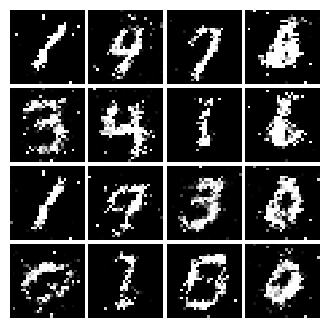

Epoch: 8, Iter: 3800, D: 1.336, G:0.7264


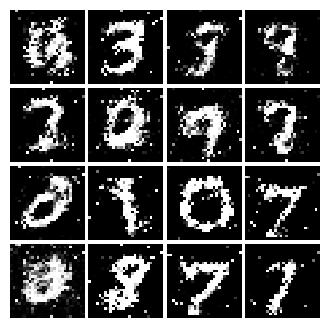

Epoch: 8, Iter: 3820, D: 1.338, G:0.7992


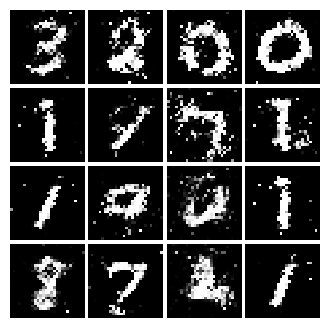

Epoch: 8, Iter: 3840, D: 1.345, G:0.8027


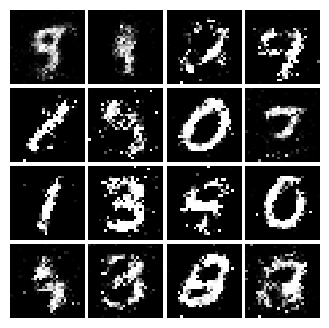

Epoch: 8, Iter: 3860, D: 1.271, G:0.7785


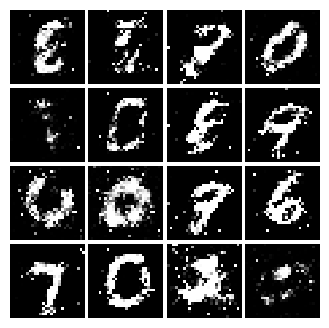

Epoch: 8, Iter: 3880, D: 1.27, G:0.7775


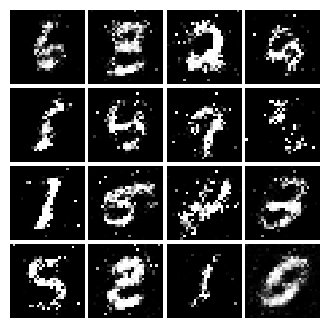

Epoch: 8, Iter: 3900, D: 1.385, G:0.8118


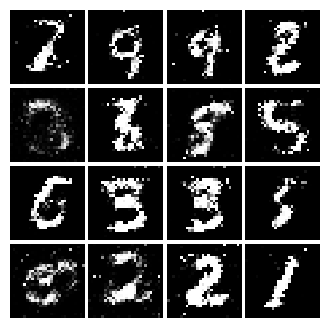

Epoch: 8, Iter: 3920, D: 1.298, G:0.9954


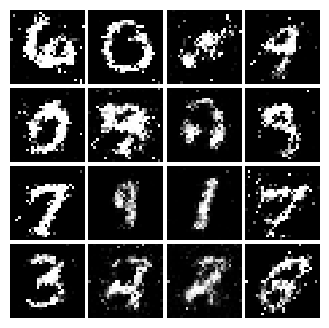

Epoch: 8, Iter: 3940, D: 1.325, G:0.817


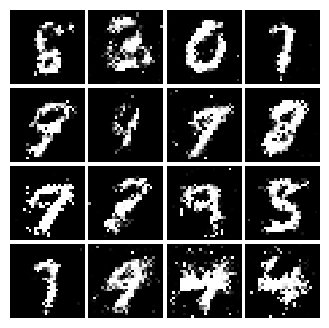

Epoch: 8, Iter: 3960, D: 1.283, G:0.7676


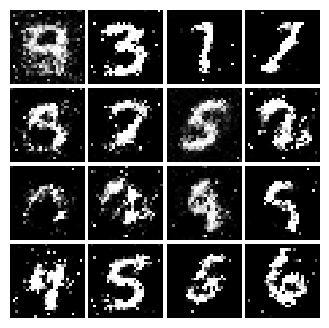

Epoch: 8, Iter: 3980, D: 1.334, G:0.8151


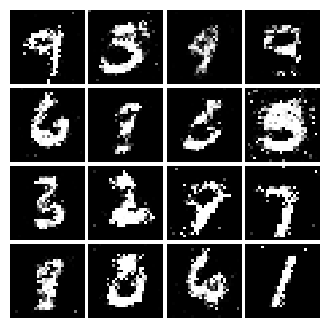

Epoch: 8, Iter: 4000, D: 1.284, G:0.9262


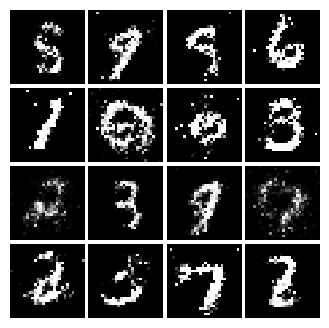

Epoch: 8, Iter: 4020, D: 1.343, G:0.7509


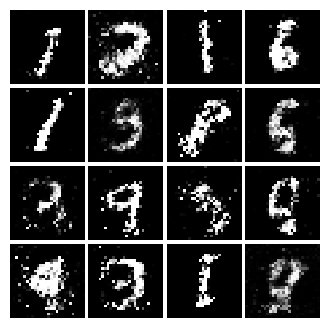

Epoch: 8, Iter: 4040, D: 1.352, G:0.8417


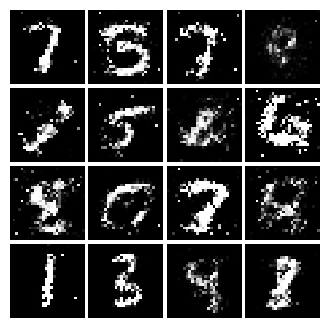

Epoch: 8, Iter: 4060, D: 1.363, G:0.7203


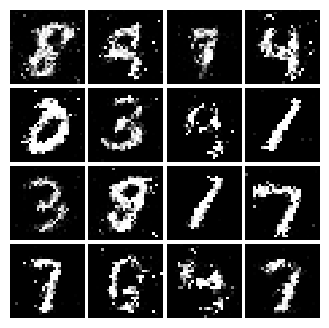

Epoch: 8, Iter: 4080, D: 1.381, G:0.757


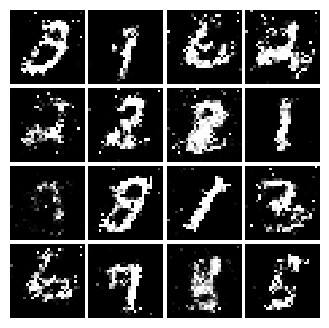

Epoch: 8, Iter: 4100, D: 1.412, G:0.775


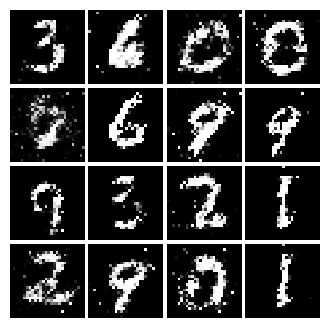

Epoch: 8, Iter: 4120, D: 1.272, G:0.9045


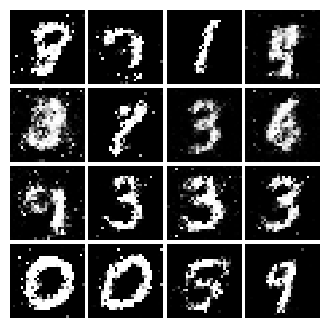

Epoch: 8, Iter: 4140, D: 1.369, G:0.9192


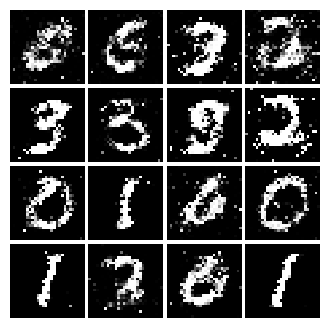

Epoch: 8, Iter: 4160, D: 1.345, G:0.8061


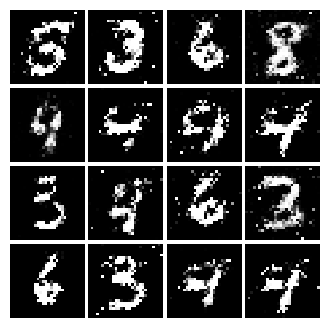

Epoch: 8, Iter: 4180, D: 1.349, G:0.7812


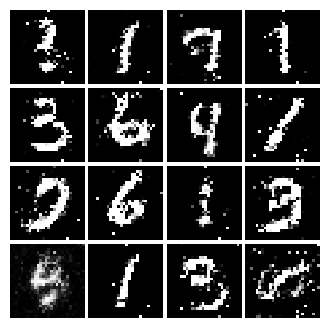

Epoch: 8, Iter: 4200, D: 1.344, G:0.834


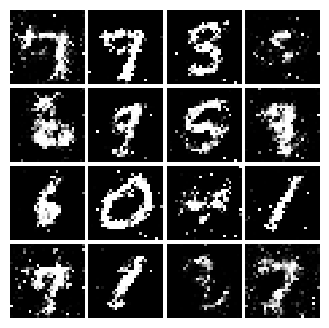

Epoch: 8, Iter: 4220, D: 1.328, G:0.8146


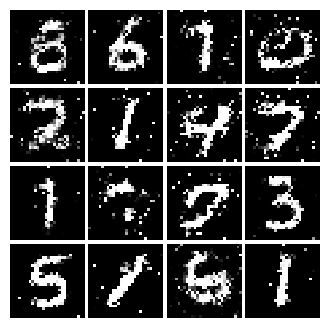

Epoch: 9, Iter: 4240, D: 1.405, G:0.7655


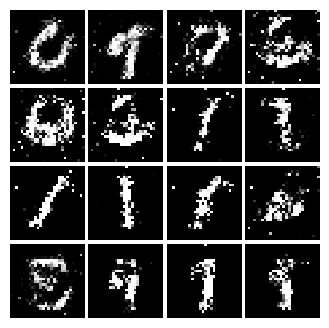

Epoch: 9, Iter: 4260, D: 1.348, G:0.8651


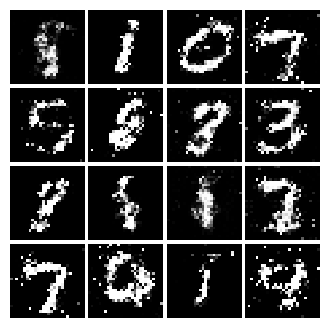

Epoch: 9, Iter: 4280, D: 1.354, G:0.8377


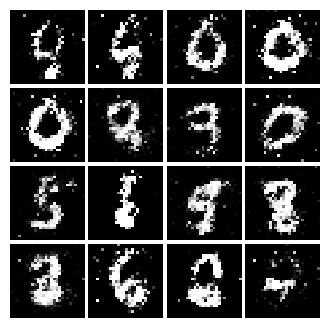

Epoch: 9, Iter: 4300, D: 1.353, G:0.9251


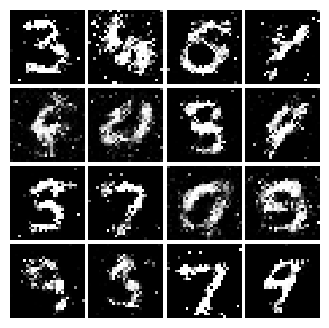

Epoch: 9, Iter: 4320, D: 1.403, G:0.8189


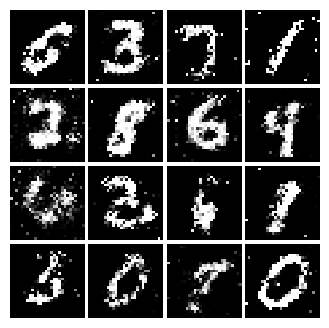

Epoch: 9, Iter: 4340, D: 1.378, G:0.7896


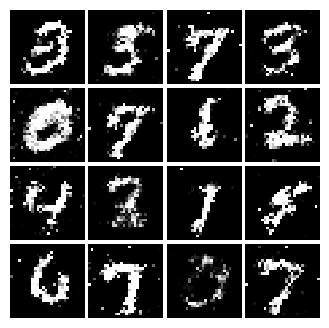

Epoch: 9, Iter: 4360, D: 1.368, G:0.8069


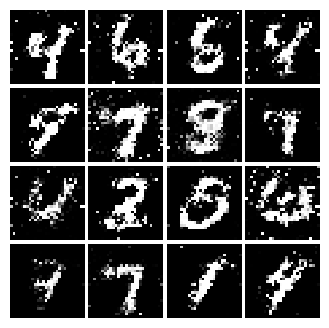

Epoch: 9, Iter: 4380, D: 1.406, G:0.8132


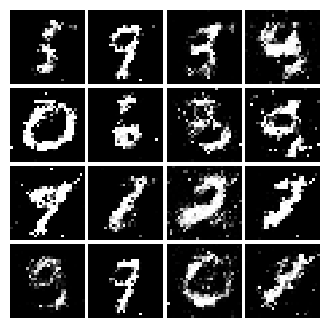

Epoch: 9, Iter: 4400, D: 1.266, G:0.8259


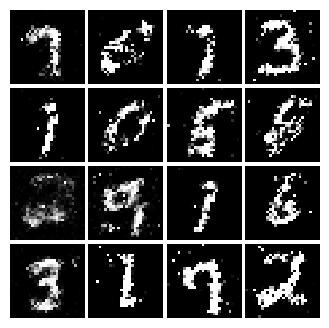

Epoch: 9, Iter: 4420, D: 1.322, G:0.7791


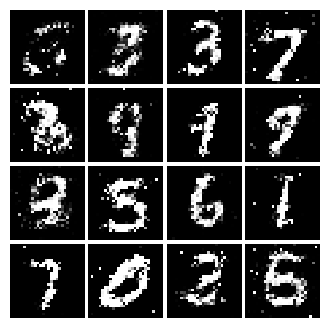

Epoch: 9, Iter: 4440, D: 1.371, G:0.8548


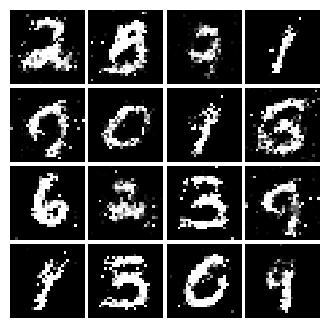

Epoch: 9, Iter: 4460, D: 1.333, G:0.7875


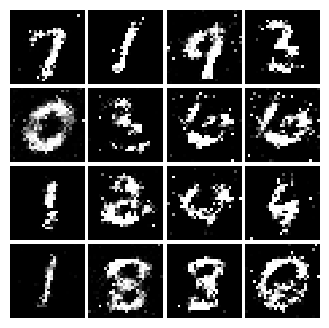

Epoch: 9, Iter: 4480, D: 1.333, G:0.791


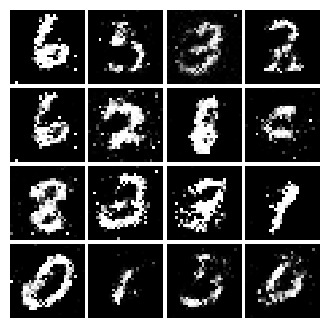

Epoch: 9, Iter: 4500, D: 1.514, G:0.7575


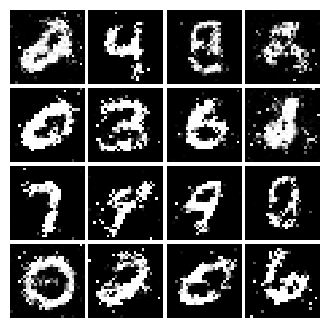

Epoch: 9, Iter: 4520, D: 1.412, G:0.7275


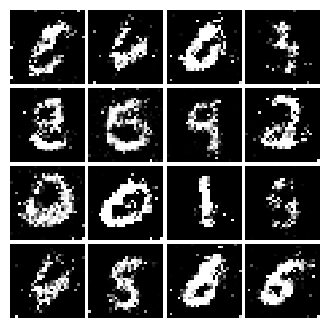

Epoch: 9, Iter: 4540, D: 1.38, G:0.7983


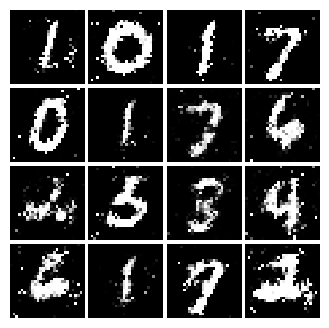

Epoch: 9, Iter: 4560, D: 1.322, G:0.8875


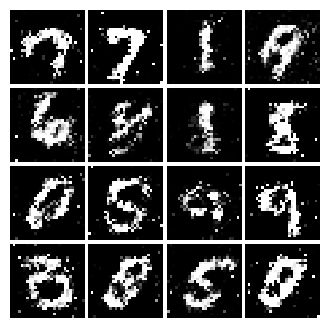

Epoch: 9, Iter: 4580, D: 1.324, G:0.8083


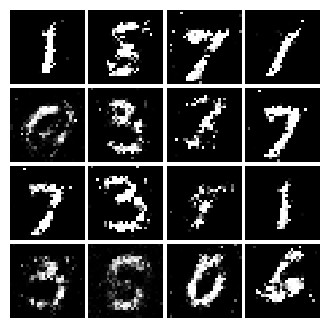

Epoch: 9, Iter: 4600, D: 1.302, G:0.8037


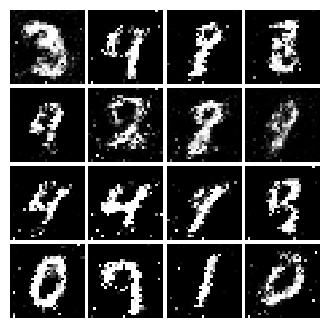

Epoch: 9, Iter: 4620, D: 1.379, G:0.7752


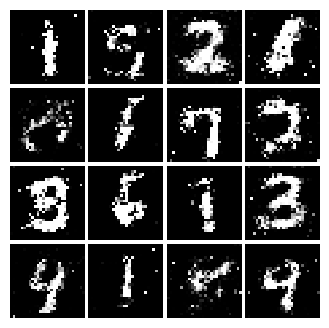

Epoch: 9, Iter: 4640, D: 1.395, G:0.7582


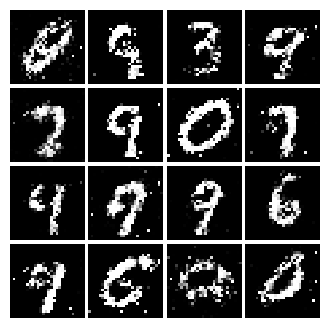

Epoch: 9, Iter: 4660, D: 1.335, G:0.7709


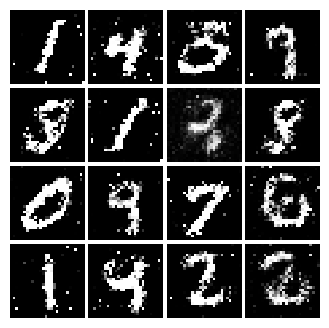

Epoch: 9, Iter: 4680, D: 1.3, G:0.7998


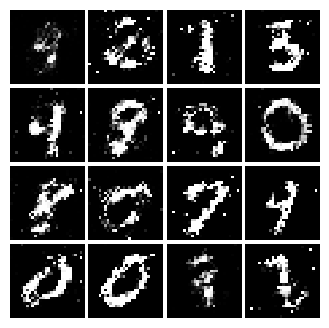

Final images


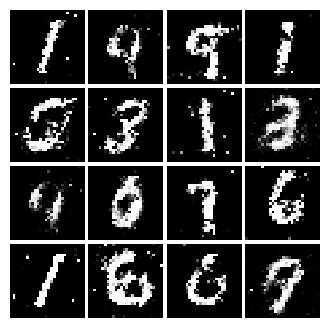

In [25]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

In [26]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

In [27]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Epoch: 0, Iter: 0, D: 0.1997, G:0.3767


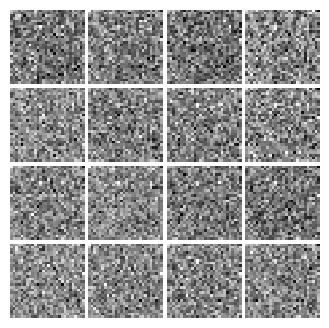

Epoch: 0, Iter: 20, D: 0.07005, G:1.12


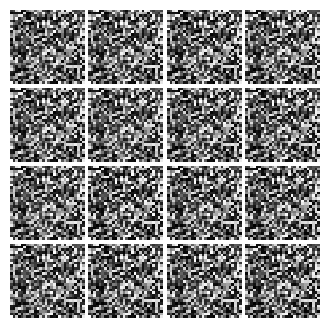

Epoch: 0, Iter: 40, D: 0.08182, G:1.023


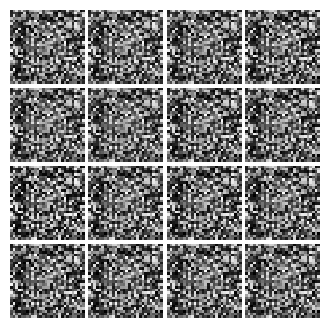

Epoch: 0, Iter: 60, D: 0.107, G:0.6386


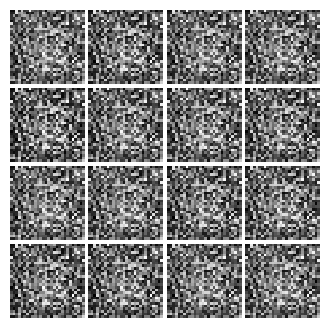

Epoch: 0, Iter: 80, D: 0.006338, G:0.6014


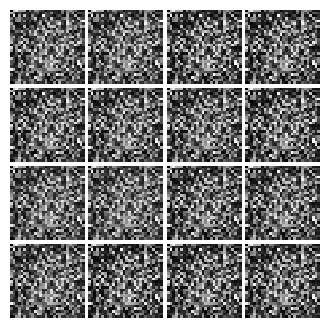

Epoch: 0, Iter: 100, D: 0.005042, G:0.6392


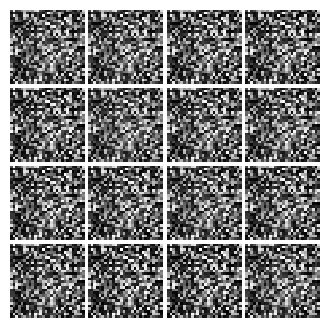

Epoch: 0, Iter: 120, D: 0.01987, G:0.378


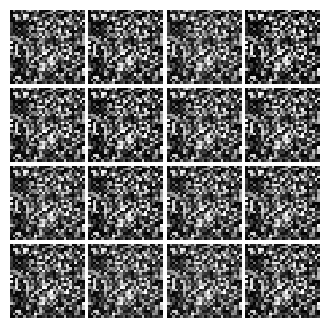

Epoch: 0, Iter: 140, D: 0.007798, G:0.3925


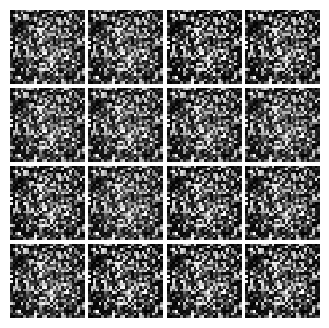

Epoch: 0, Iter: 160, D: 0.06267, G:0.38


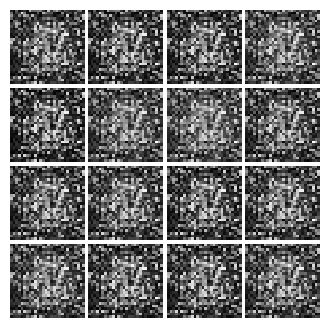

Epoch: 0, Iter: 180, D: 0.0945, G:0.6132


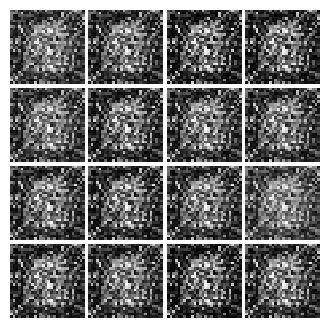

Epoch: 0, Iter: 200, D: 0.1553, G:0.7914


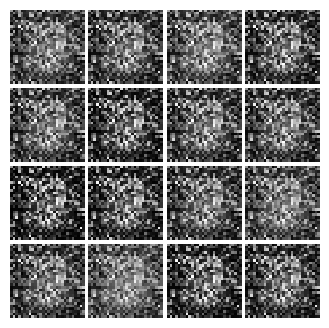

Epoch: 0, Iter: 220, D: 0.1386, G:0.5142


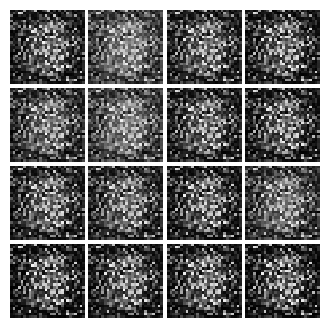

Epoch: 0, Iter: 240, D: 0.1165, G:0.574


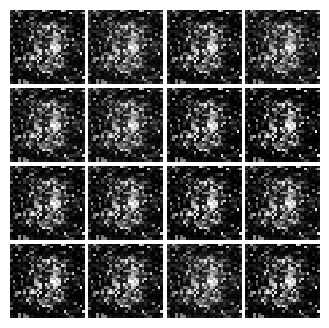

Epoch: 0, Iter: 260, D: 0.1228, G:0.474


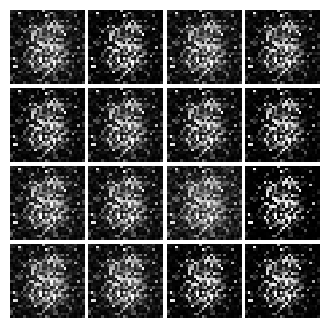

Epoch: 0, Iter: 280, D: 0.1692, G:0.2952


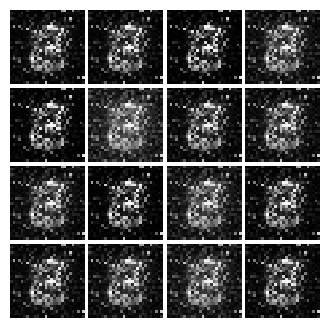

Epoch: 0, Iter: 300, D: 0.1577, G:0.5618


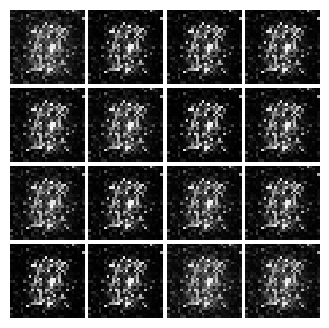

Epoch: 0, Iter: 320, D: 0.1896, G:0.3644


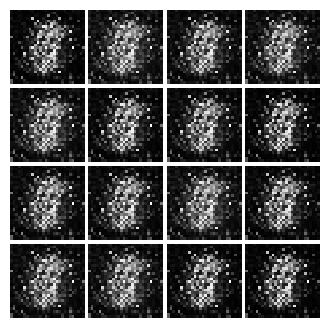

Epoch: 0, Iter: 340, D: 0.1337, G:0.2858


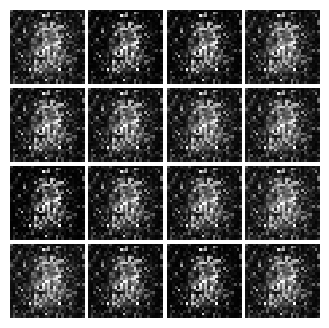

Epoch: 0, Iter: 360, D: 0.3864, G:0.07102


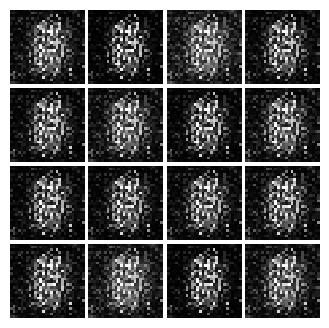

Epoch: 0, Iter: 380, D: 0.09638, G:0.5067


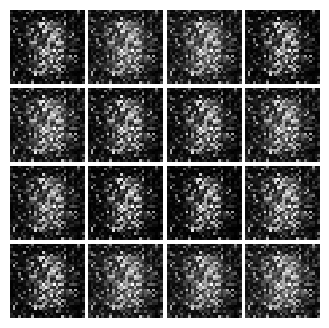

Epoch: 0, Iter: 400, D: 0.1825, G:0.5615


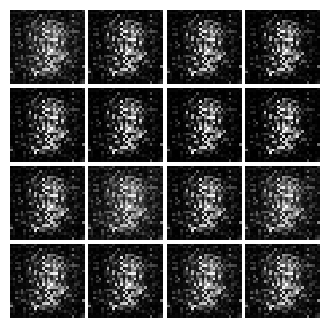

Epoch: 0, Iter: 420, D: 0.2189, G:0.2263


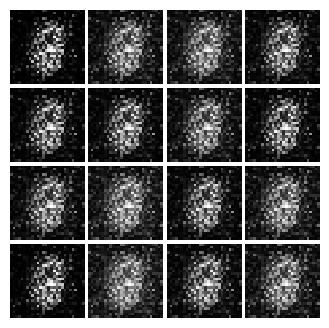

Epoch: 0, Iter: 440, D: 0.1488, G:0.2786


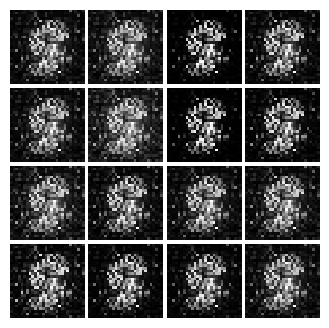

Epoch: 0, Iter: 460, D: 0.4911, G:1.206


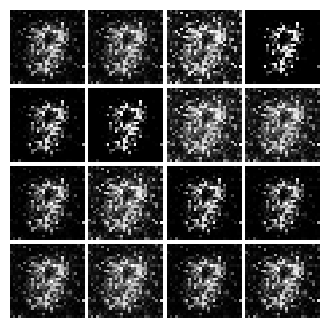

Epoch: 1, Iter: 480, D: 0.2222, G:0.1818


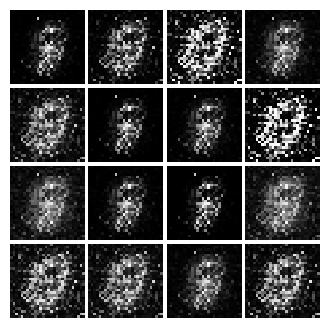

Epoch: 1, Iter: 500, D: 0.1522, G:0.5583


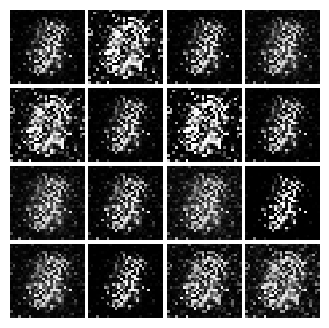

Epoch: 1, Iter: 520, D: 0.1469, G:0.3914


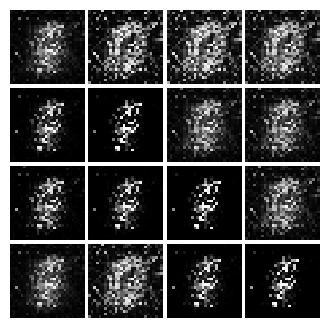

Epoch: 1, Iter: 540, D: 0.1695, G:0.2356


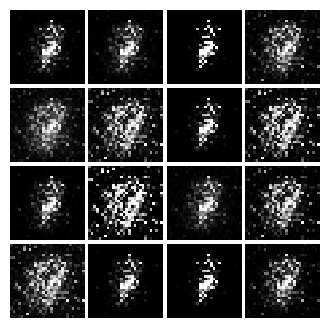

Epoch: 1, Iter: 560, D: 0.155, G:0.2581


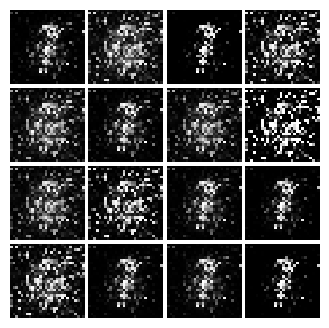

Epoch: 1, Iter: 580, D: 0.08196, G:0.371


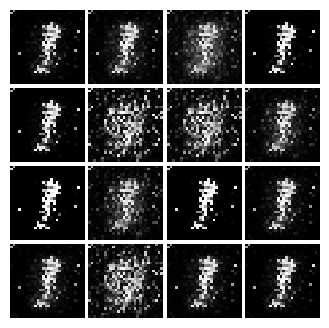

Epoch: 1, Iter: 600, D: 0.1019, G:0.503


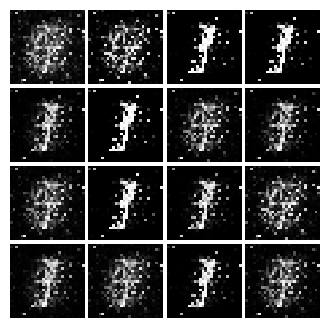

Epoch: 1, Iter: 620, D: 0.1406, G:0.2478


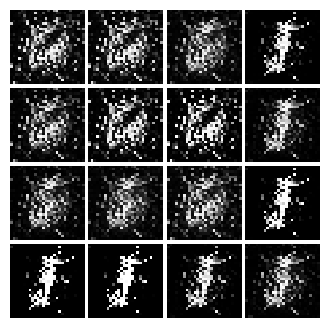

Epoch: 1, Iter: 640, D: 0.09334, G:0.5002


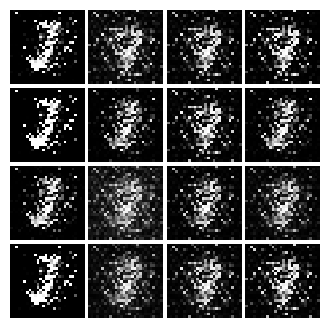

Epoch: 1, Iter: 660, D: 0.08297, G:0.4329


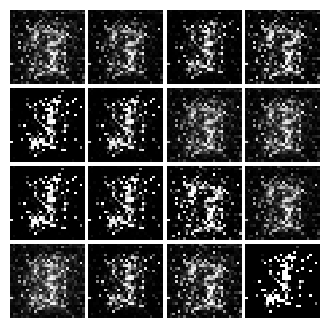

Epoch: 1, Iter: 680, D: 0.08491, G:0.4686


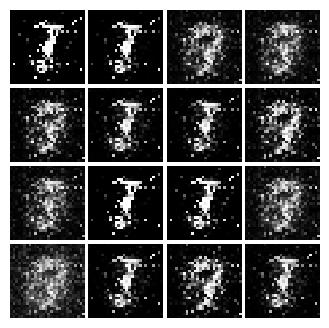

Epoch: 1, Iter: 700, D: 0.1208, G:0.3665


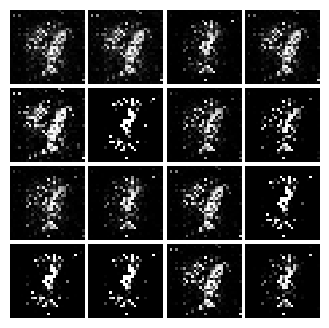

Epoch: 1, Iter: 720, D: 0.1129, G:0.4591


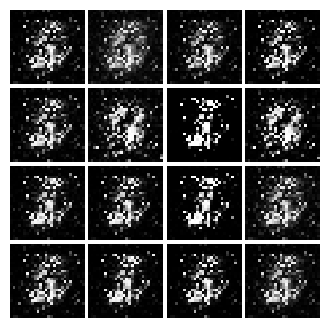

Epoch: 1, Iter: 740, D: 0.07555, G:0.5943


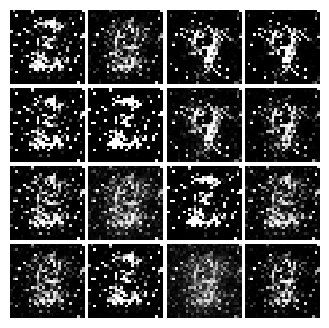

Epoch: 1, Iter: 760, D: 0.08531, G:0.4339


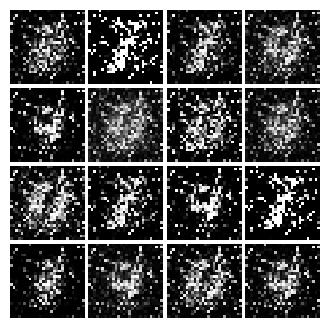

Epoch: 1, Iter: 780, D: 0.1614, G:0.3828


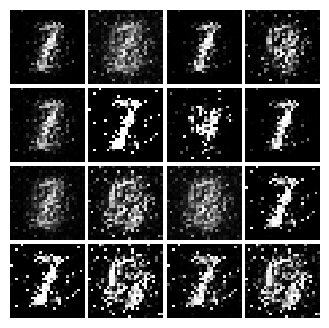

Epoch: 1, Iter: 800, D: 0.1007, G:0.3835


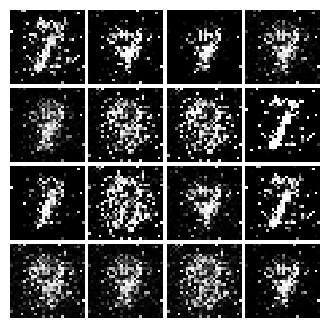

Epoch: 1, Iter: 820, D: 0.168, G:0.3786


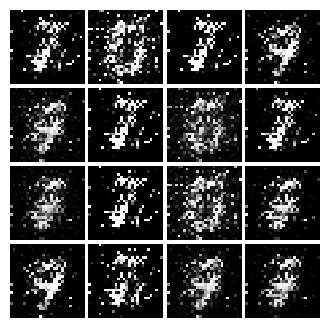

Epoch: 1, Iter: 840, D: 0.1936, G:0.6434


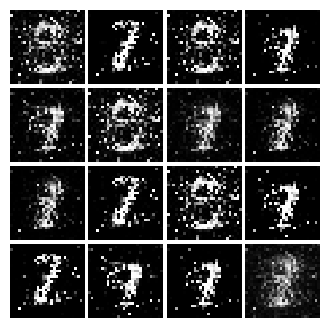

Epoch: 1, Iter: 860, D: 0.1019, G:0.3387


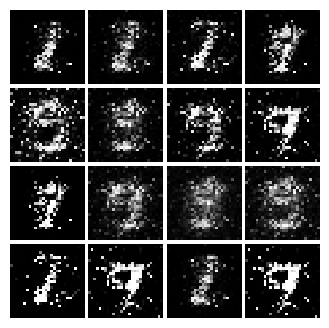

Epoch: 1, Iter: 880, D: 0.1282, G:0.3187


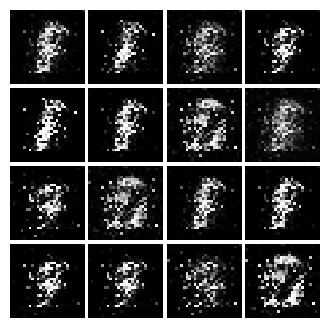

Epoch: 1, Iter: 900, D: 0.1512, G:0.2837


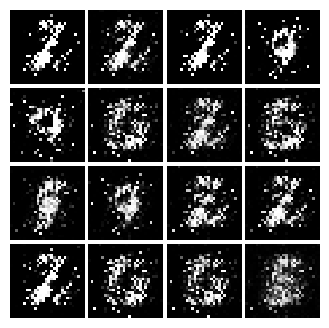

Epoch: 1, Iter: 920, D: 0.1505, G:0.389


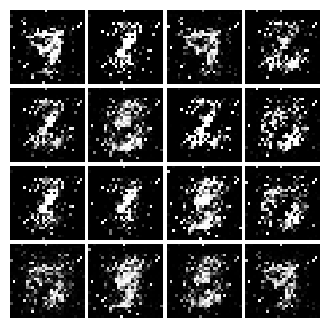

Epoch: 2, Iter: 940, D: 0.146, G:0.3162


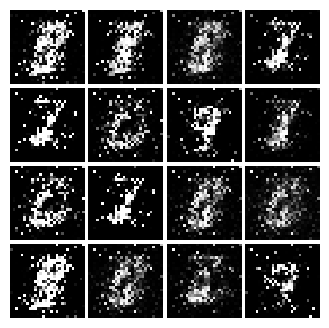

Epoch: 2, Iter: 960, D: 0.1407, G:0.3361


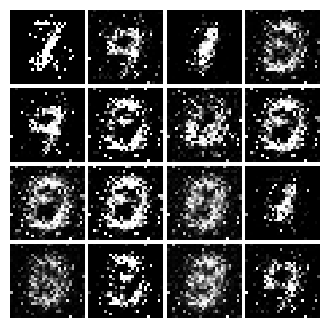

Epoch: 2, Iter: 980, D: 0.1117, G:0.3415


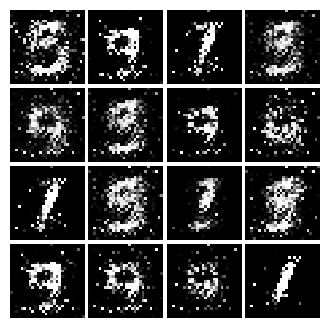

Epoch: 2, Iter: 1000, D: 0.1742, G:0.4242


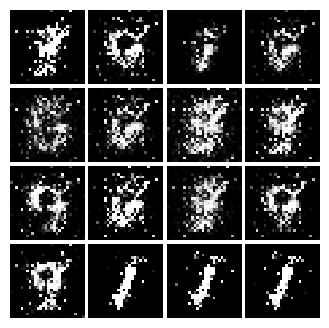

Epoch: 2, Iter: 1020, D: 0.171, G:0.3299


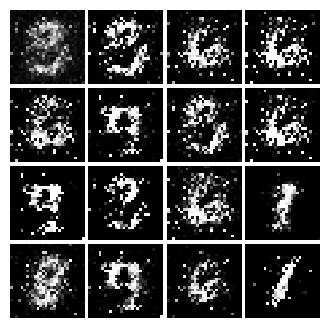

Epoch: 2, Iter: 1040, D: 0.1466, G:0.2573


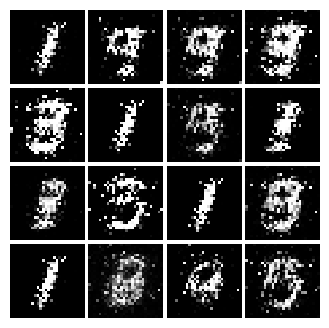

Epoch: 2, Iter: 1060, D: 0.1267, G:0.283


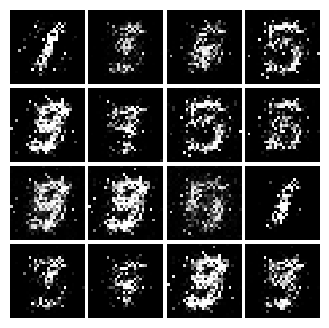

Epoch: 2, Iter: 1080, D: 0.1466, G:0.3256


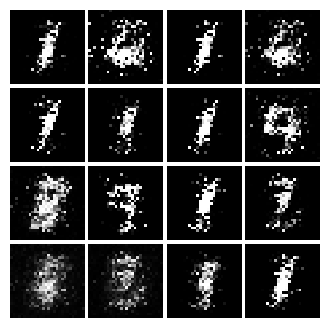

Epoch: 2, Iter: 1100, D: 0.1829, G:0.3829


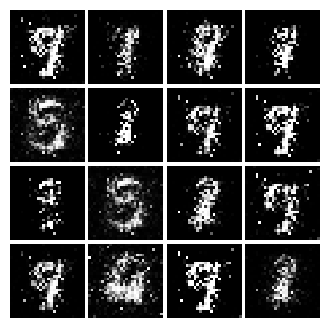

Epoch: 2, Iter: 1120, D: 0.1862, G:0.247


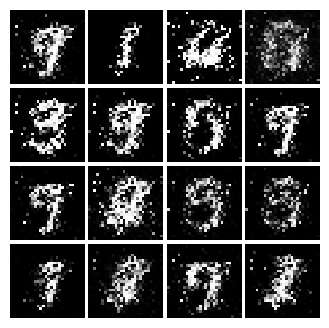

Epoch: 2, Iter: 1140, D: 0.1496, G:0.3222


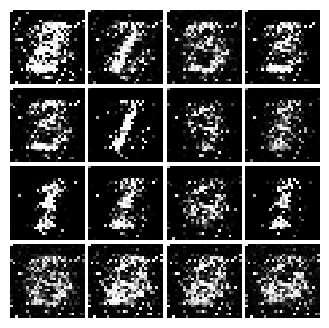

Epoch: 2, Iter: 1160, D: 0.1612, G:0.2478


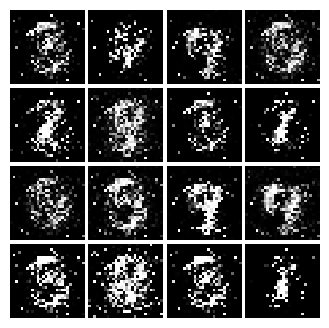

Epoch: 2, Iter: 1180, D: 0.1668, G:0.2675


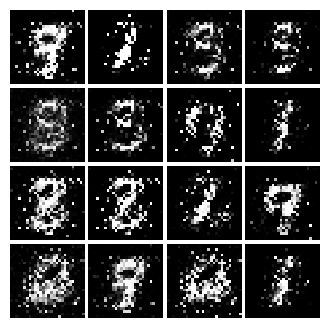

Epoch: 2, Iter: 1200, D: 0.1576, G:0.7391


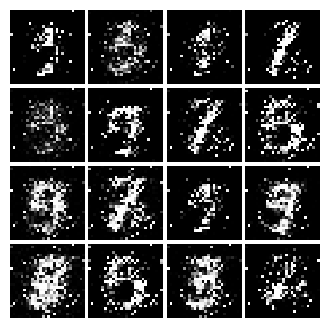

Epoch: 2, Iter: 1220, D: 0.1418, G:0.3477


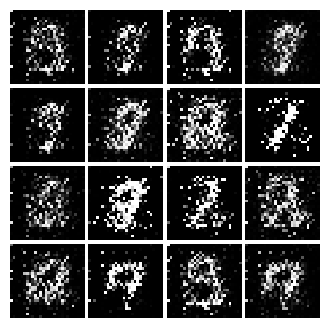

Epoch: 2, Iter: 1240, D: 0.1468, G:0.3774


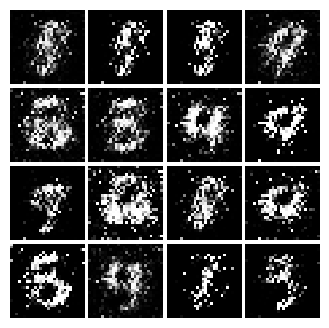

Epoch: 2, Iter: 1260, D: 0.1867, G:0.1826


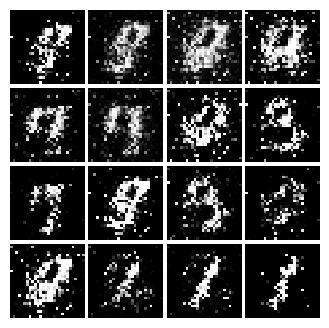

Epoch: 2, Iter: 1280, D: 0.1835, G:0.1883


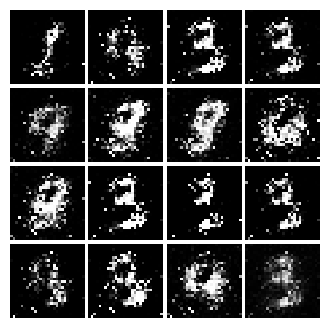

Epoch: 2, Iter: 1300, D: 0.1725, G:0.2338


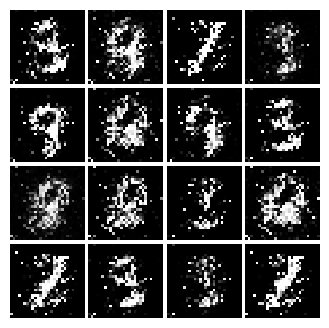

Epoch: 2, Iter: 1320, D: 0.1618, G:0.2298


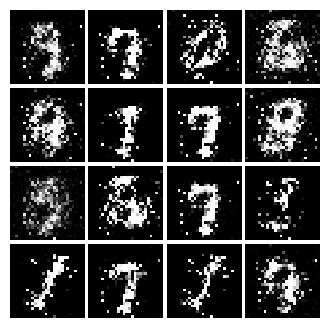

Epoch: 2, Iter: 1340, D: 0.1795, G:0.2434


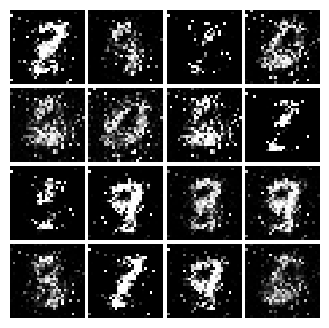

Epoch: 2, Iter: 1360, D: 0.1687, G:0.2217


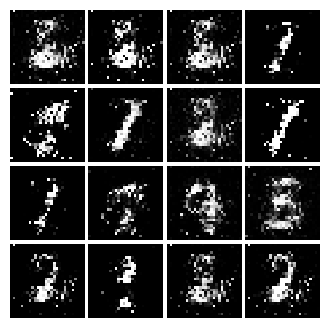

Epoch: 2, Iter: 1380, D: 0.1206, G:0.3025


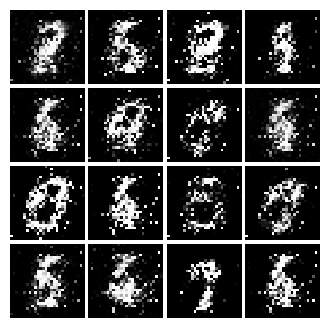

Epoch: 2, Iter: 1400, D: 0.1947, G:0.3025


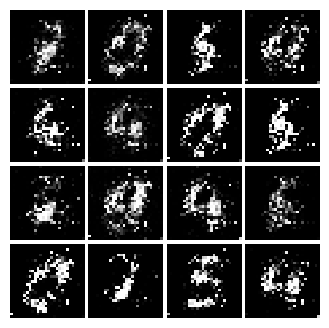

Epoch: 3, Iter: 1420, D: 0.2022, G:0.2008


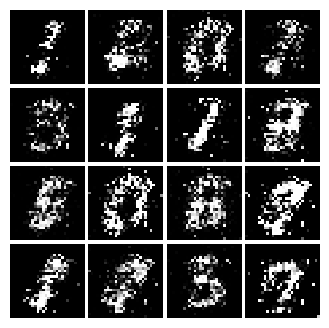

Epoch: 3, Iter: 1440, D: 0.1898, G:0.2528


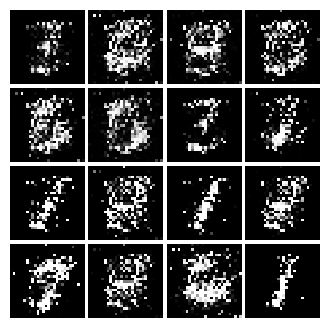

Epoch: 3, Iter: 1460, D: 0.1942, G:0.2522


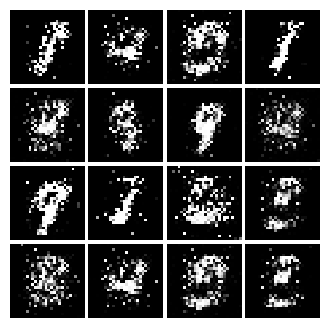

Epoch: 3, Iter: 1480, D: 0.195, G:0.2794


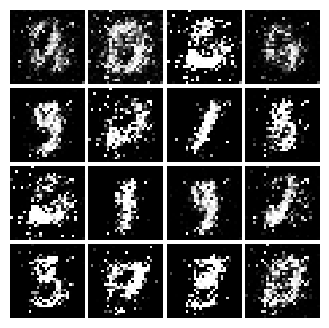

Epoch: 3, Iter: 1500, D: 0.4053, G:0.3411


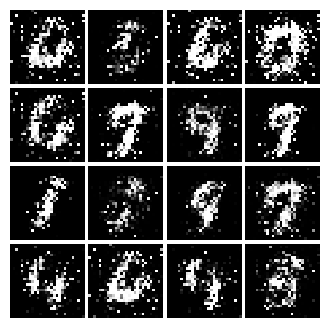

Epoch: 3, Iter: 1520, D: 0.1888, G:0.2015


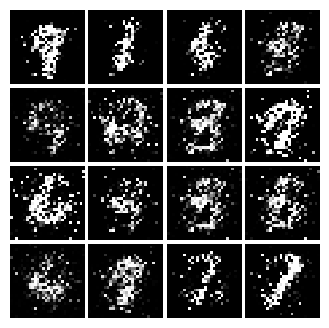

Epoch: 3, Iter: 1540, D: 0.2874, G:0.2412


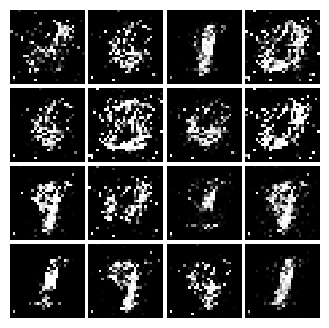

Epoch: 3, Iter: 1560, D: 0.1709, G:0.2315


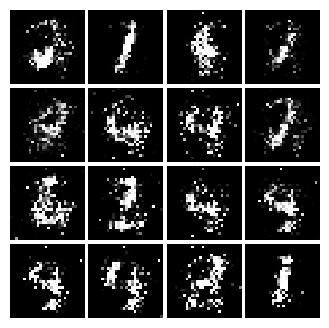

Epoch: 3, Iter: 1580, D: 0.1832, G:0.4272


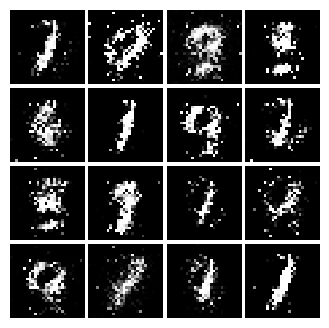

Epoch: 3, Iter: 1600, D: 0.2146, G:0.1606


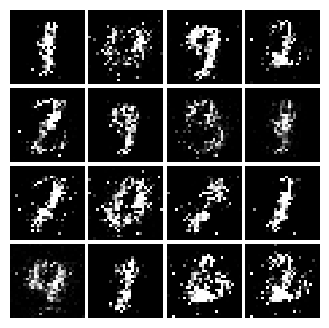

Epoch: 3, Iter: 1620, D: 0.1747, G:0.2466


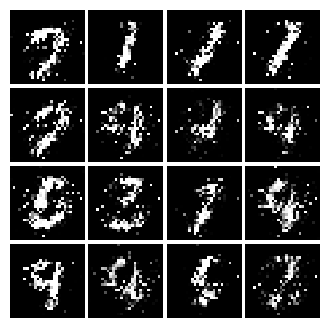

Epoch: 3, Iter: 1640, D: 0.191, G:0.2487


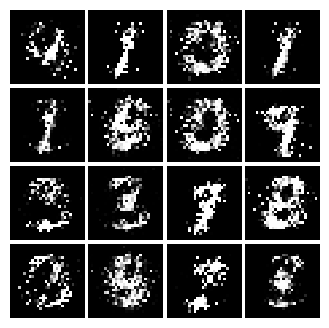

Epoch: 3, Iter: 1660, D: 0.1513, G:0.3133


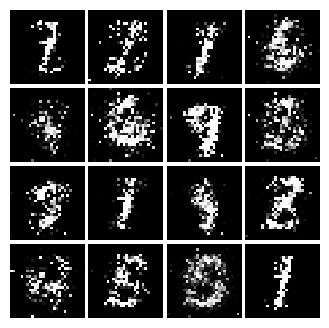

Epoch: 3, Iter: 1680, D: 0.1727, G:0.211


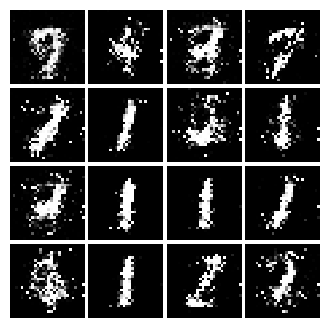

Epoch: 3, Iter: 1700, D: 0.215, G:0.1972


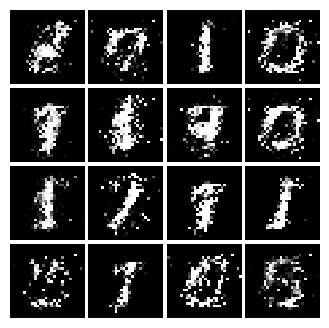

Epoch: 3, Iter: 1720, D: 0.1813, G:0.2496


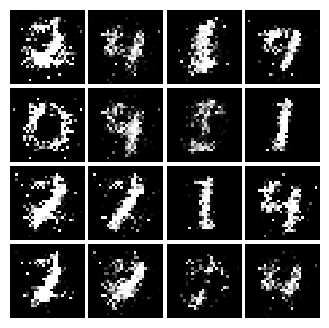

Epoch: 3, Iter: 1740, D: 0.1774, G:0.2468


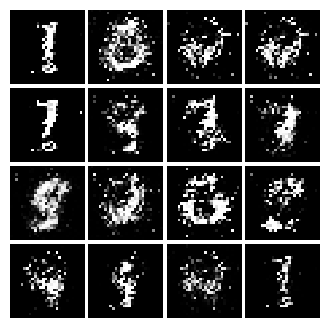

Epoch: 3, Iter: 1760, D: 0.1675, G:0.241


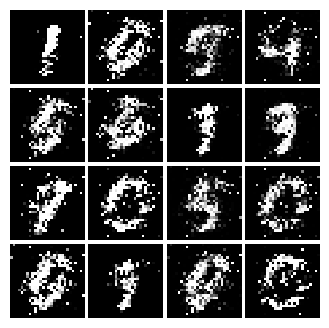

Epoch: 3, Iter: 1780, D: 0.1672, G:0.2101


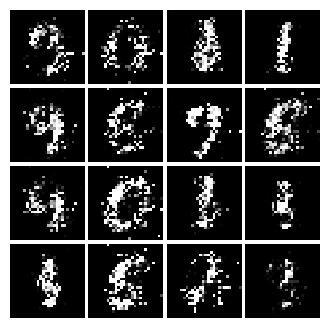

Epoch: 3, Iter: 1800, D: 0.2175, G:0.2722


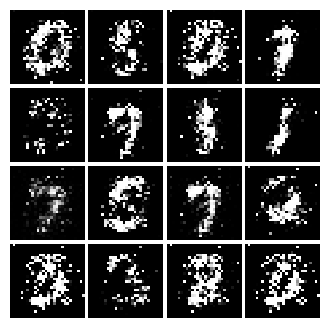

Epoch: 3, Iter: 1820, D: 0.2079, G:0.2235


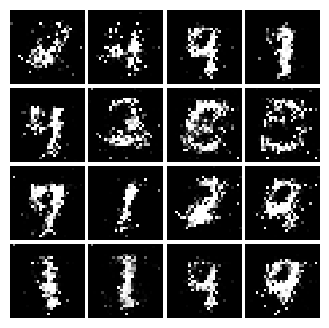

Epoch: 3, Iter: 1840, D: 0.1984, G:0.2355


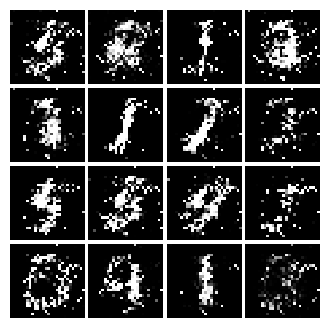

Epoch: 3, Iter: 1860, D: 0.1916, G:0.2192


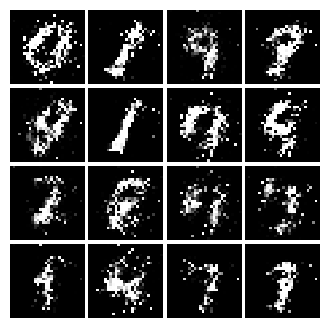

Epoch: 4, Iter: 1880, D: 0.1838, G:0.229


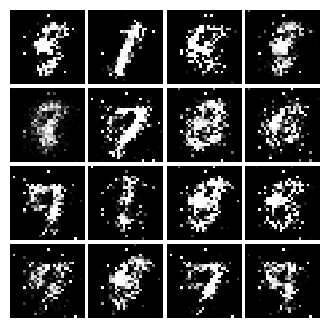

Epoch: 4, Iter: 1900, D: 0.1527, G:0.2586


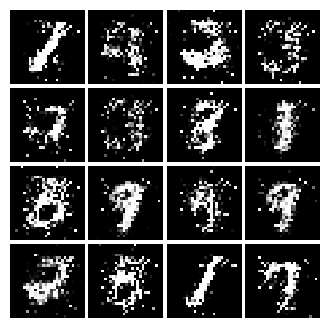

Epoch: 4, Iter: 1920, D: 0.1921, G:0.2666


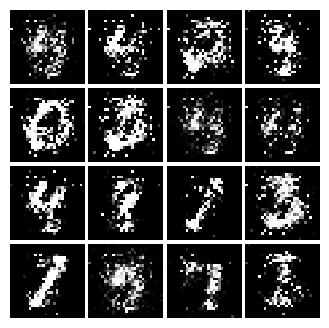

Epoch: 4, Iter: 1940, D: 0.1729, G:0.2484


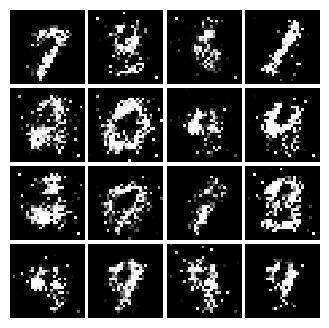

Epoch: 4, Iter: 1960, D: 0.1772, G:0.2128


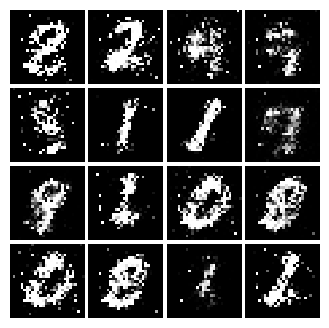

Epoch: 4, Iter: 1980, D: 0.1817, G:0.2537


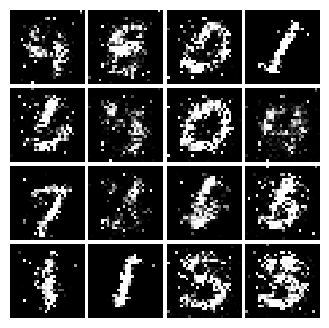

Epoch: 4, Iter: 2000, D: 0.2009, G:0.1599


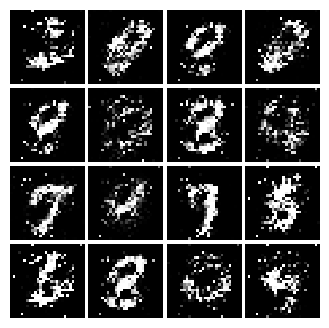

Epoch: 4, Iter: 2020, D: 0.1763, G:0.2531


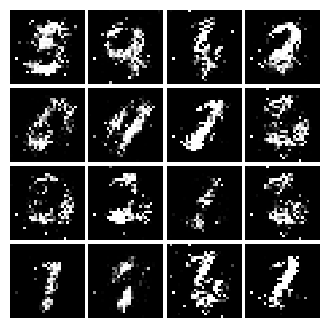

Epoch: 4, Iter: 2040, D: 0.1883, G:0.209


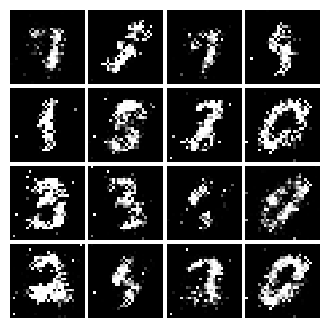

Epoch: 4, Iter: 2060, D: 0.226, G:0.2438


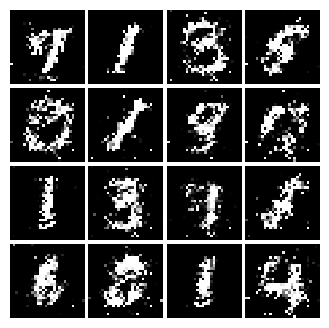

Epoch: 4, Iter: 2080, D: 0.207, G:0.2194


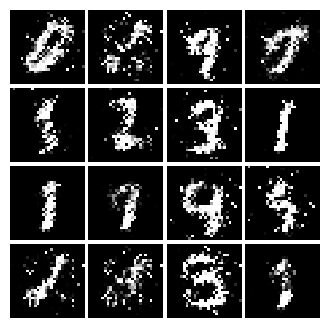

Epoch: 4, Iter: 2100, D: 0.2104, G:0.2145


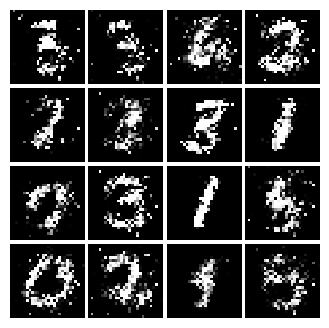

Epoch: 4, Iter: 2120, D: 0.2259, G:0.162


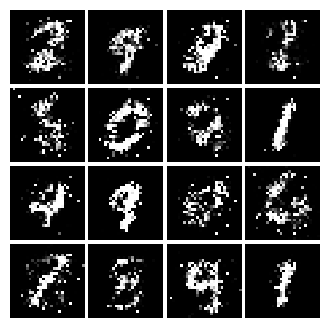

Epoch: 4, Iter: 2140, D: 0.1947, G:0.2101


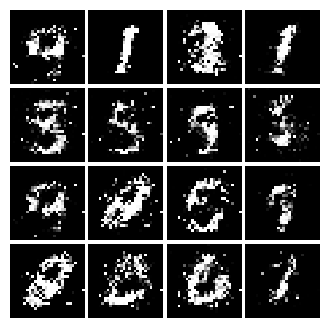

Epoch: 4, Iter: 2160, D: 0.2049, G:0.1698


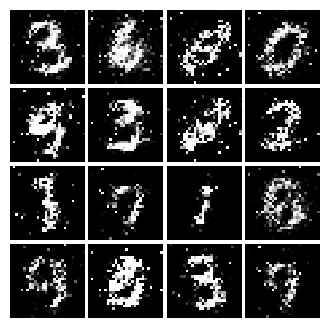

Epoch: 4, Iter: 2180, D: 0.219, G:0.2309


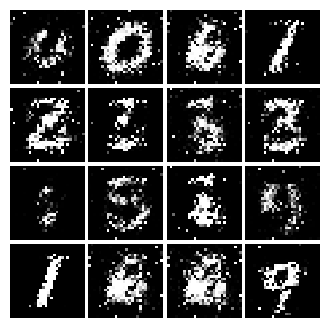

Epoch: 4, Iter: 2200, D: 0.2044, G:0.1734


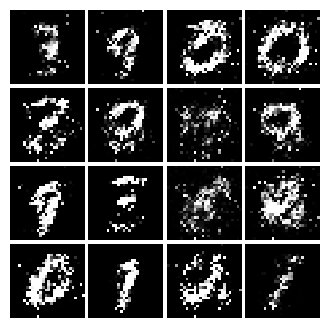

Epoch: 4, Iter: 2220, D: 0.1944, G:0.2176


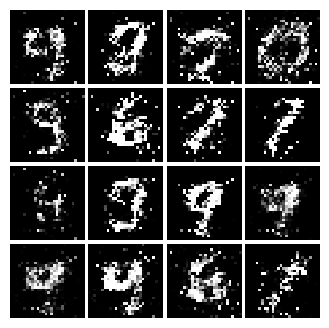

Epoch: 4, Iter: 2240, D: 0.2061, G:0.215


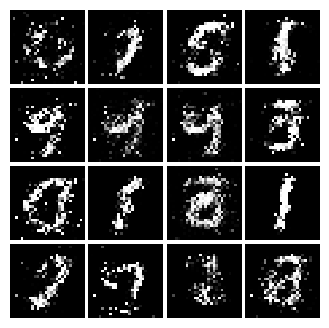

Epoch: 4, Iter: 2260, D: 0.2321, G:0.2102


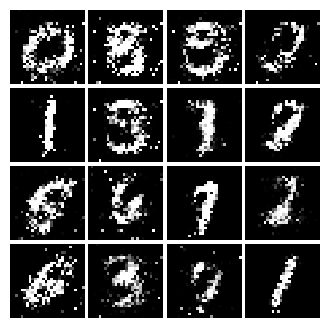

Epoch: 4, Iter: 2280, D: 0.2046, G:0.1817


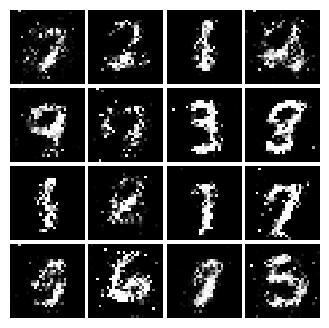

Epoch: 4, Iter: 2300, D: 0.1959, G:0.194


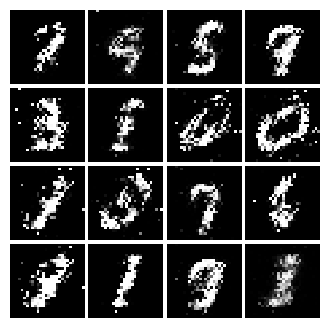

Epoch: 4, Iter: 2320, D: 0.202, G:0.2015


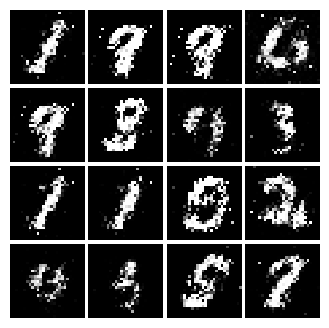

Epoch: 4, Iter: 2340, D: 0.2221, G:0.2387


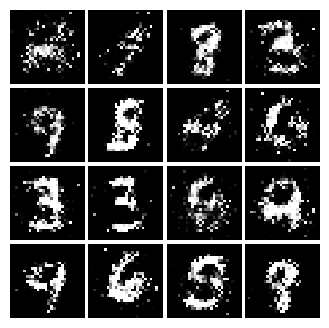

Epoch: 5, Iter: 2360, D: 0.1916, G:0.1775


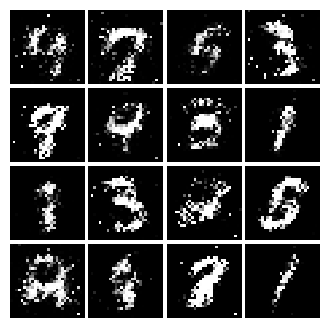

Epoch: 5, Iter: 2380, D: 0.2118, G:0.201


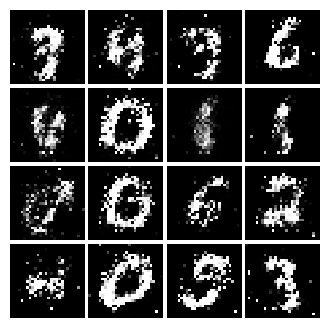

Epoch: 5, Iter: 2400, D: 0.1931, G:0.2034


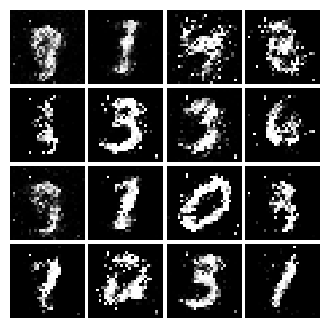

Epoch: 5, Iter: 2420, D: 0.2177, G:0.1971


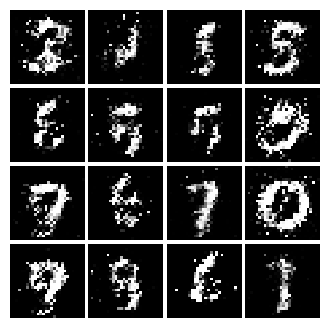

Epoch: 5, Iter: 2440, D: 0.2261, G:0.2479


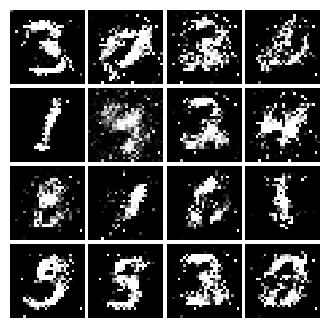

Epoch: 5, Iter: 2460, D: 0.2134, G:0.232


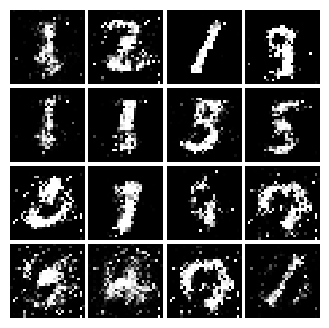

Epoch: 5, Iter: 2480, D: 0.1943, G:0.219


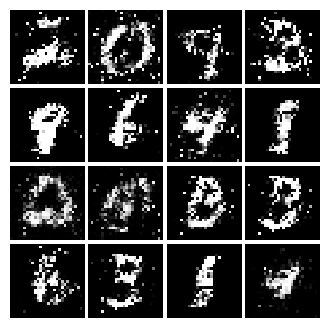

Epoch: 5, Iter: 2500, D: 0.1929, G:0.2135


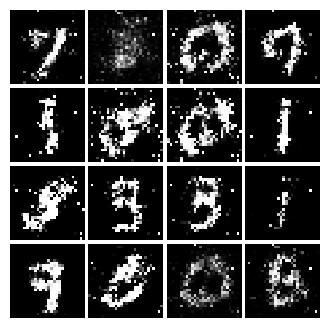

Epoch: 5, Iter: 2520, D: 0.2384, G:0.1637


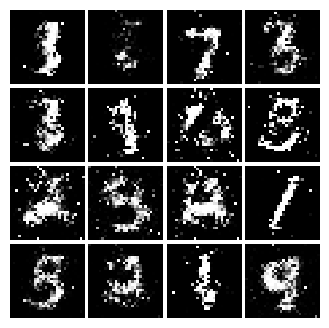

Epoch: 5, Iter: 2540, D: 0.2124, G:0.1828


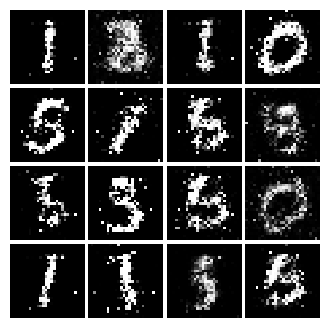

Epoch: 5, Iter: 2560, D: 0.2572, G:0.1562


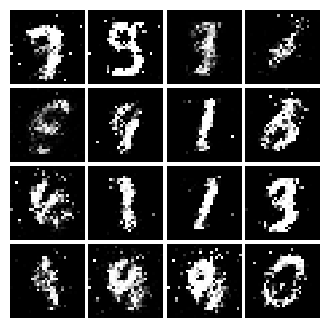

Epoch: 5, Iter: 2580, D: 0.2025, G:0.1978


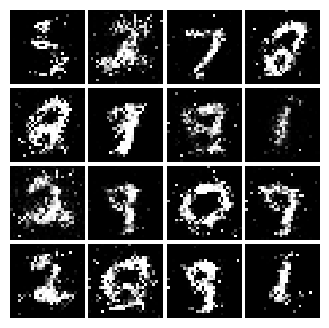

Epoch: 5, Iter: 2600, D: 0.2564, G:0.1964


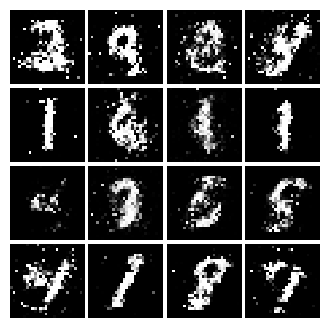

Epoch: 5, Iter: 2620, D: 0.2197, G:0.1641


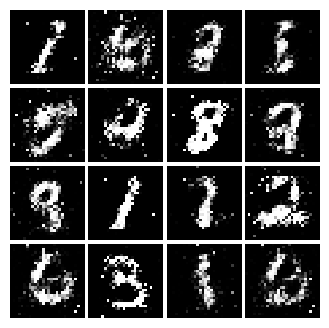

Epoch: 5, Iter: 2640, D: 0.186, G:0.2032


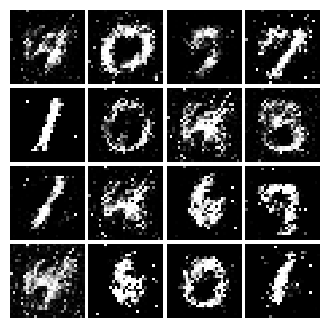

Epoch: 5, Iter: 2660, D: 0.2238, G:0.1812


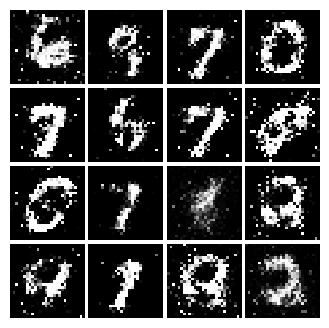

Epoch: 5, Iter: 2680, D: 0.2362, G:0.1557


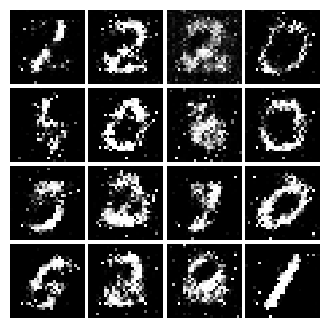

Epoch: 5, Iter: 2700, D: 0.2382, G:0.1462


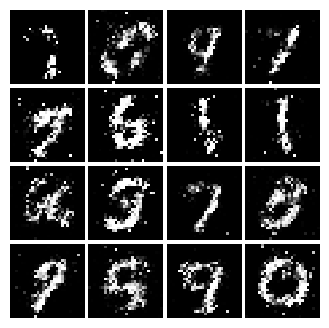

Epoch: 5, Iter: 2720, D: 0.2165, G:0.1592


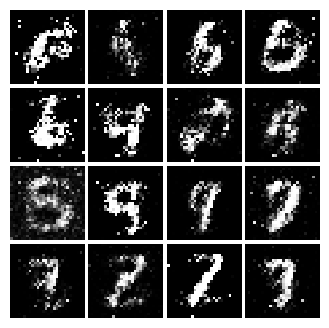

Epoch: 5, Iter: 2740, D: 0.224, G:0.1729


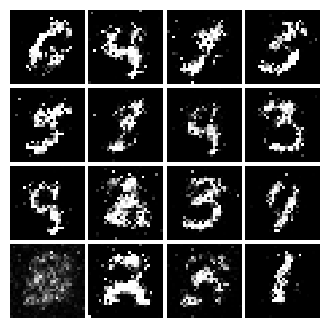

Epoch: 5, Iter: 2760, D: 0.2375, G:0.1641


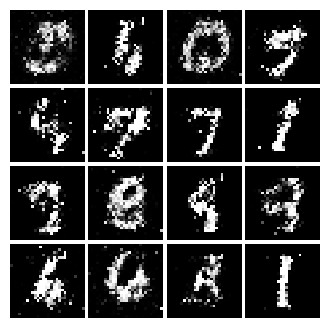

Epoch: 5, Iter: 2780, D: 0.216, G:0.1807


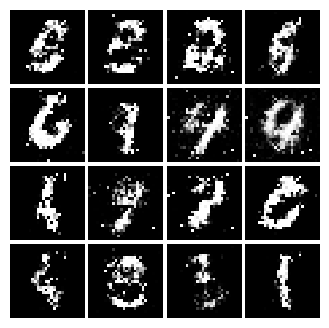

Epoch: 5, Iter: 2800, D: 0.2467, G:0.169


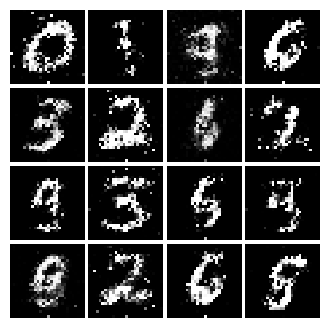

Epoch: 6, Iter: 2820, D: 0.2425, G:0.128


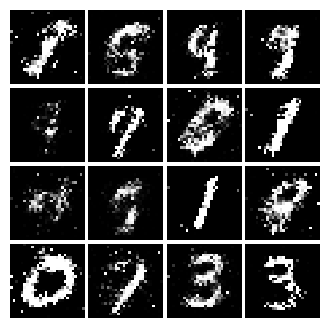

Epoch: 6, Iter: 2840, D: 0.2308, G:0.1673


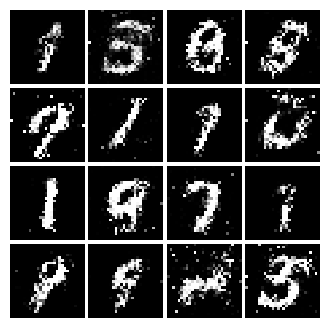

Epoch: 6, Iter: 2860, D: 0.2084, G:0.1779


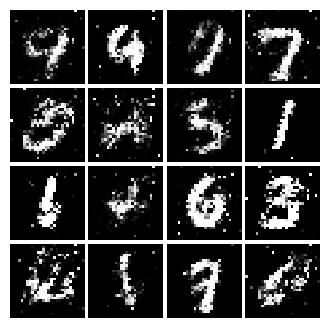

Epoch: 6, Iter: 2880, D: 0.2063, G:0.1925


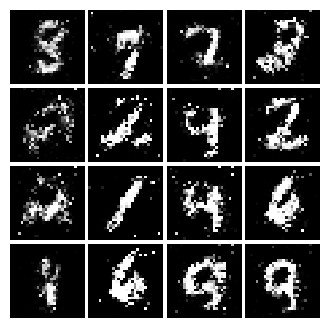

Epoch: 6, Iter: 2900, D: 0.2365, G:0.1657


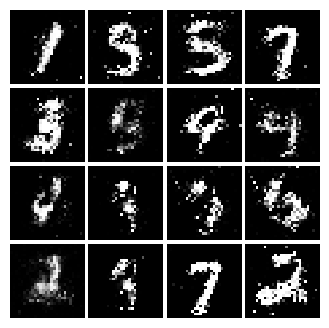

Epoch: 6, Iter: 2920, D: 0.2489, G:0.1897


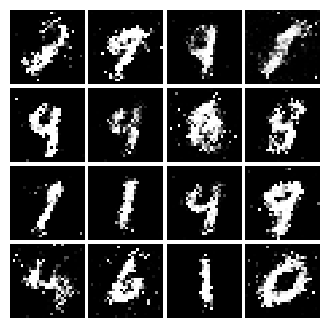

Epoch: 6, Iter: 2940, D: 0.2188, G:0.1726


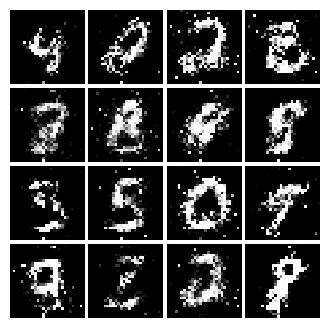

Epoch: 6, Iter: 2960, D: 0.2232, G:0.1571


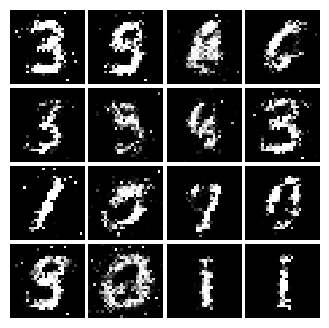

Epoch: 6, Iter: 2980, D: 0.2616, G:0.1439


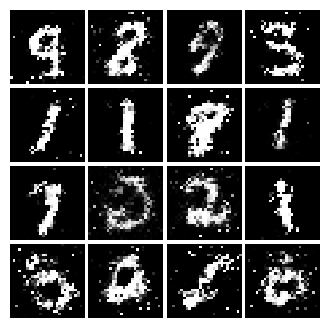

Epoch: 6, Iter: 3000, D: 0.2458, G:0.1816


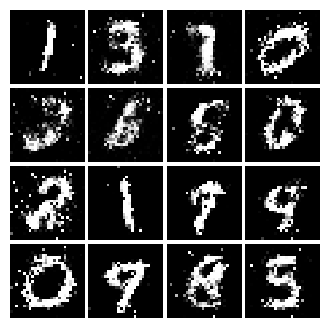

Epoch: 6, Iter: 3020, D: 0.2322, G:0.1578


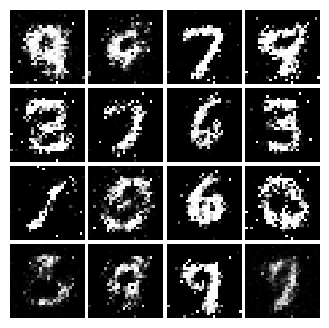

Epoch: 6, Iter: 3040, D: 0.221, G:0.1945


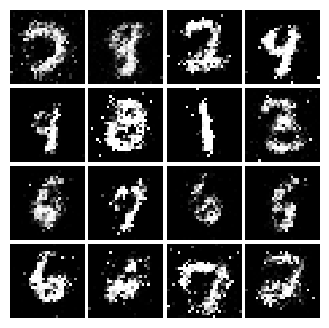

Epoch: 6, Iter: 3060, D: 0.2452, G:0.1684


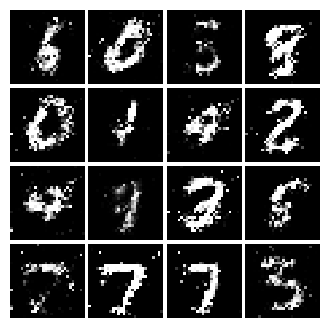

Epoch: 6, Iter: 3080, D: 0.2433, G:0.163


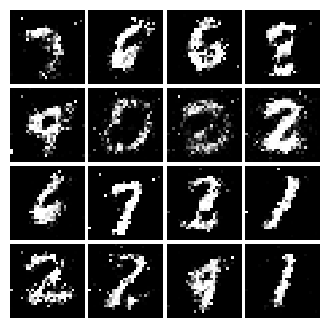

Epoch: 6, Iter: 3100, D: 0.2205, G:0.1635


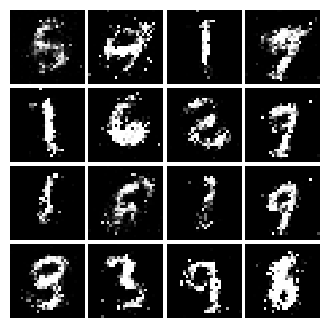

Epoch: 6, Iter: 3120, D: 0.2393, G:0.1601


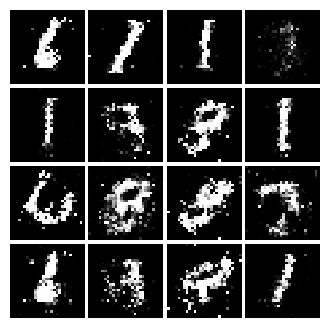

Epoch: 6, Iter: 3140, D: 0.2421, G:0.1815


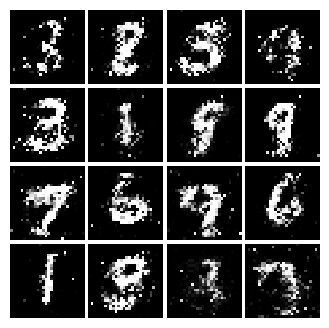

Epoch: 6, Iter: 3160, D: 0.2151, G:0.1704


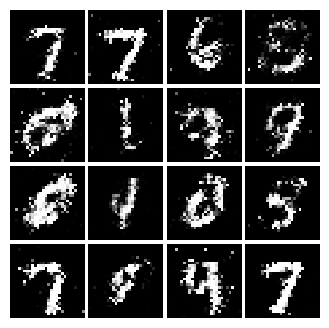

Epoch: 6, Iter: 3180, D: 0.2266, G:0.1552


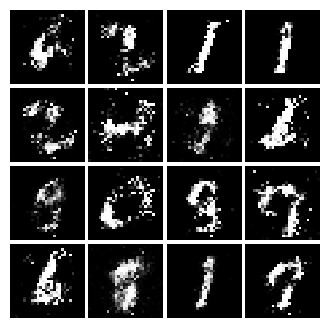

Epoch: 6, Iter: 3200, D: 0.2245, G:0.1602


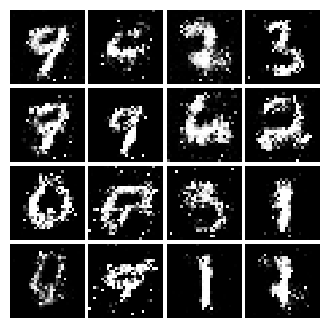

Epoch: 6, Iter: 3220, D: 0.2479, G:0.1722


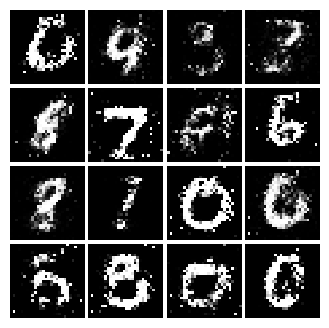

Epoch: 6, Iter: 3240, D: 0.2259, G:0.1374


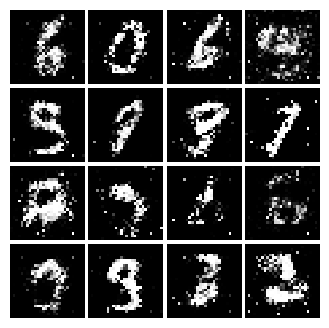

Epoch: 6, Iter: 3260, D: 0.244, G:0.1423


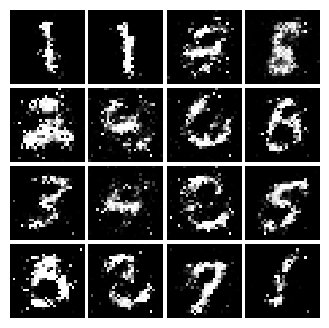

Epoch: 6, Iter: 3280, D: 0.2178, G:0.1877


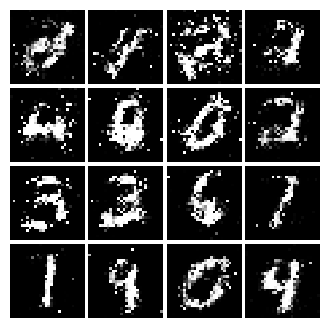

Epoch: 7, Iter: 3300, D: 0.2023, G:0.1969


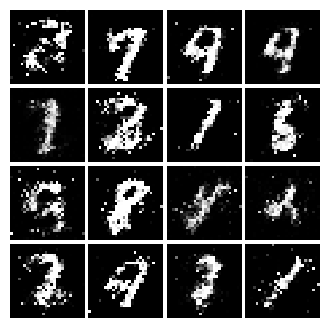

Epoch: 7, Iter: 3320, D: 0.2184, G:0.1571


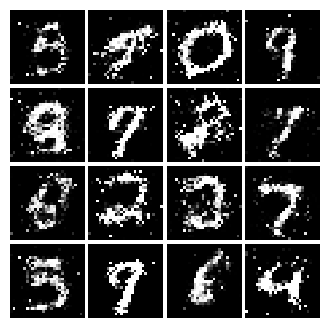

Epoch: 7, Iter: 3340, D: 0.2109, G:0.1958


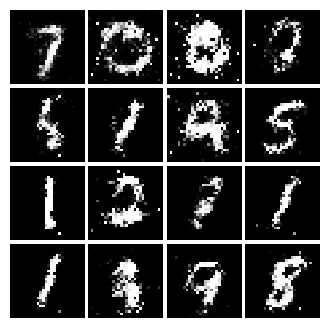

Epoch: 7, Iter: 3360, D: 0.2565, G:0.1972


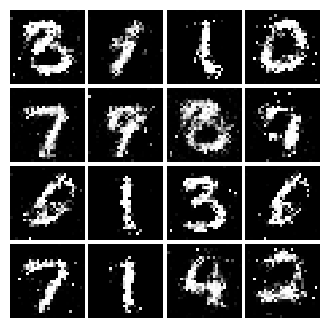

Epoch: 7, Iter: 3380, D: 0.2418, G:0.1634


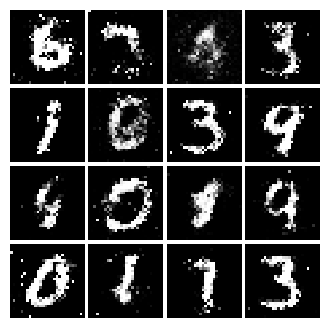

Epoch: 7, Iter: 3400, D: 0.2567, G:0.1539


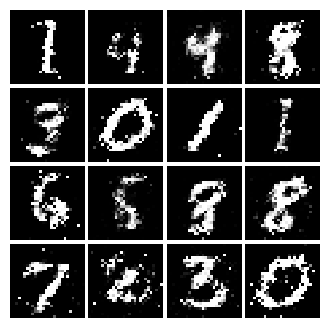

Epoch: 7, Iter: 3420, D: 0.2262, G:0.1663


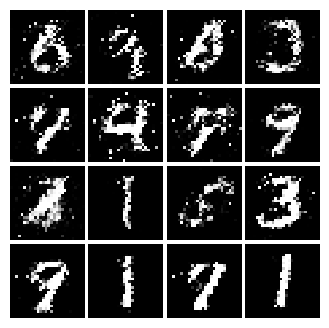

Epoch: 7, Iter: 3440, D: 0.2326, G:0.1976


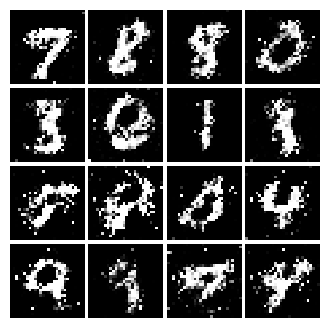

Epoch: 7, Iter: 3460, D: 0.202, G:0.1762


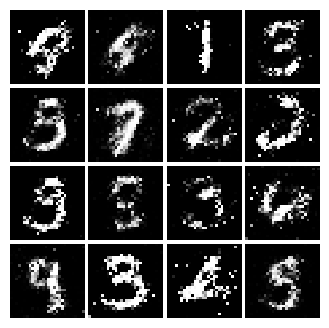

Epoch: 7, Iter: 3480, D: 0.2221, G:0.1369


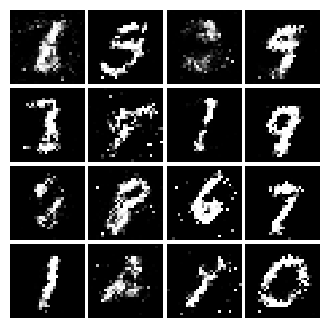

Epoch: 7, Iter: 3500, D: 0.2389, G:0.1694


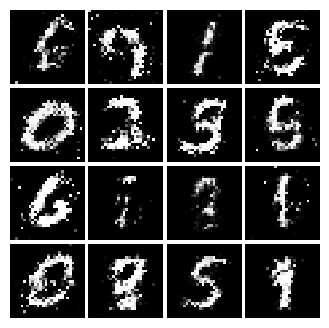

Epoch: 7, Iter: 3520, D: 0.2223, G:0.1852


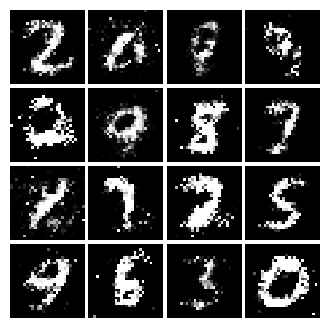

Epoch: 7, Iter: 3540, D: 0.2129, G:0.1699


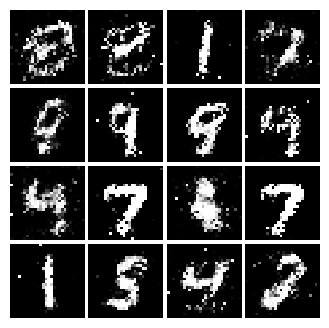

Epoch: 7, Iter: 3560, D: 0.2396, G:0.183


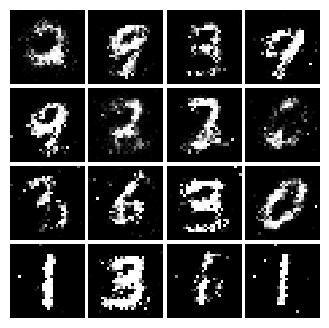

Epoch: 7, Iter: 3580, D: 0.2435, G:0.1725


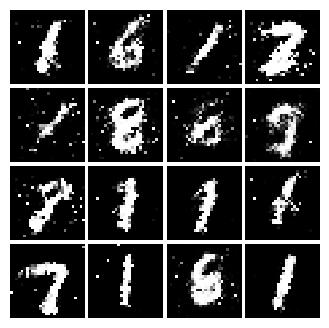

Epoch: 7, Iter: 3600, D: 0.2212, G:0.1613


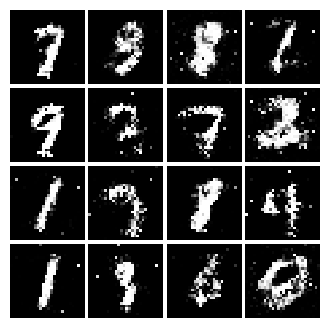

Epoch: 7, Iter: 3620, D: 0.2318, G:0.1957


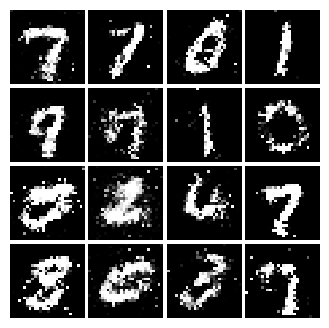

Epoch: 7, Iter: 3640, D: 0.2262, G:0.173


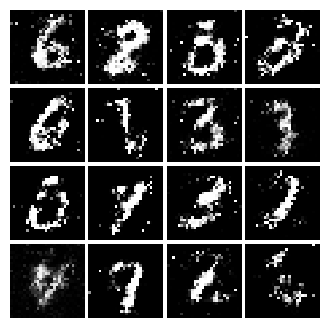

Epoch: 7, Iter: 3660, D: 0.2444, G:0.1616


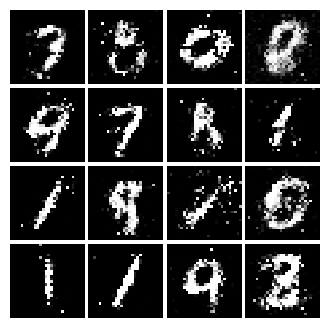

Epoch: 7, Iter: 3680, D: 0.2248, G:0.1723


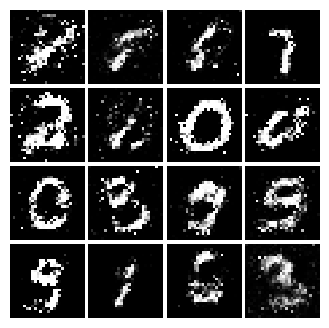

Epoch: 7, Iter: 3700, D: 0.2152, G:0.1678


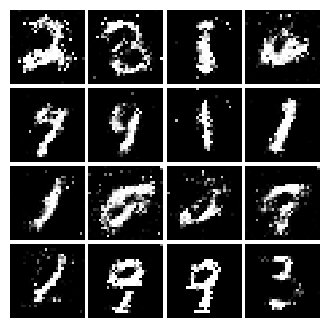

Epoch: 7, Iter: 3720, D: 0.2346, G:0.1621


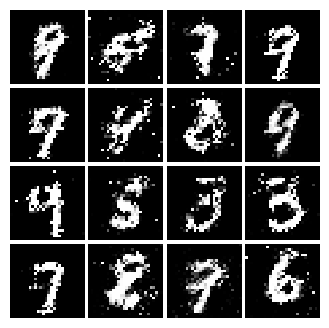

Epoch: 7, Iter: 3740, D: 0.2443, G:0.1692


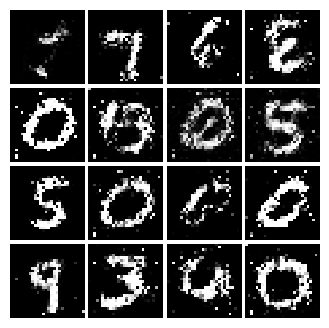

Epoch: 8, Iter: 3760, D: 0.2192, G:0.1951


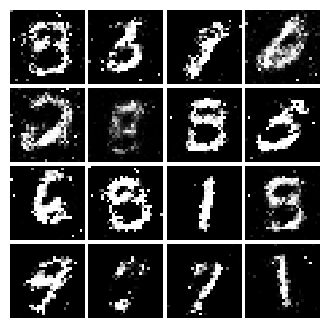

Epoch: 8, Iter: 3780, D: 0.255, G:0.1455


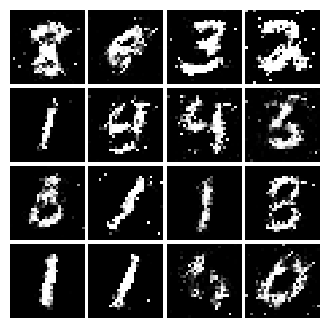

Epoch: 8, Iter: 3800, D: 0.2195, G:0.1518


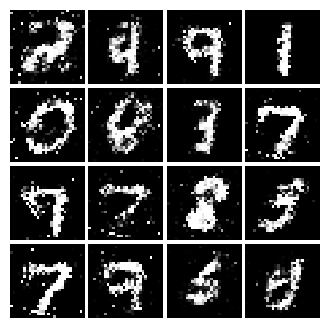

Epoch: 8, Iter: 3820, D: 0.2497, G:0.1795


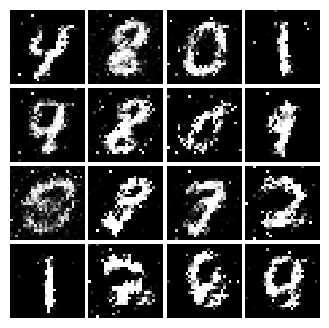

Epoch: 8, Iter: 3840, D: 0.2306, G:0.17


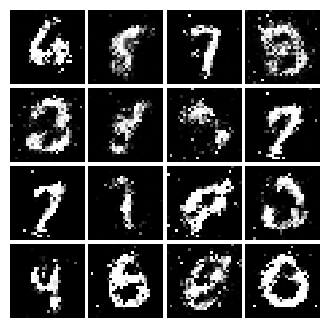

Epoch: 8, Iter: 3860, D: 0.2803, G:0.1656


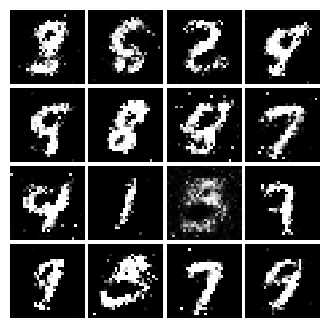

Epoch: 8, Iter: 3880, D: 0.2242, G:0.1583


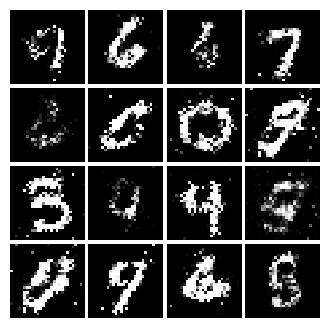

Epoch: 8, Iter: 3900, D: 0.2496, G:0.1797


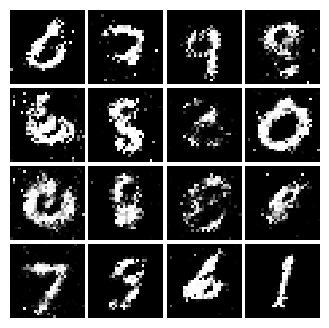

Epoch: 8, Iter: 3920, D: 0.2323, G:0.181


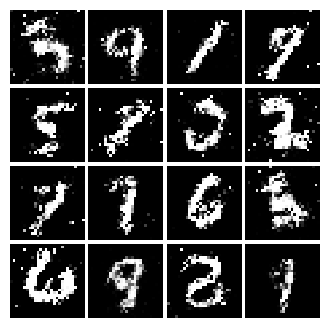

Epoch: 8, Iter: 3940, D: 0.2406, G:0.1571


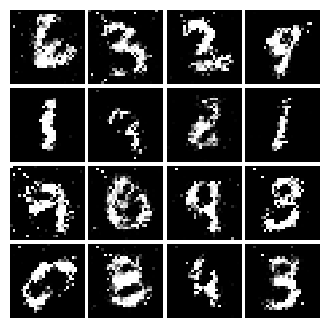

Epoch: 8, Iter: 3960, D: 0.2471, G:0.1459


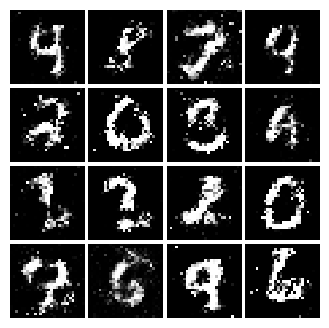

Epoch: 8, Iter: 3980, D: 0.2236, G:0.1489


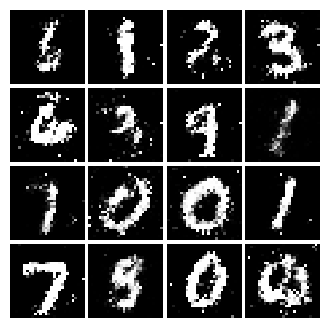

Epoch: 8, Iter: 4000, D: 0.2193, G:0.183


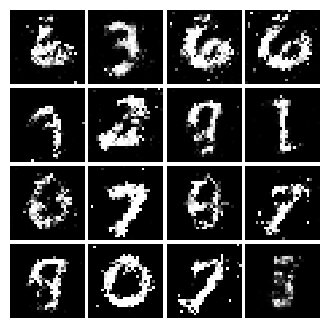

Epoch: 8, Iter: 4020, D: 0.234, G:0.1159


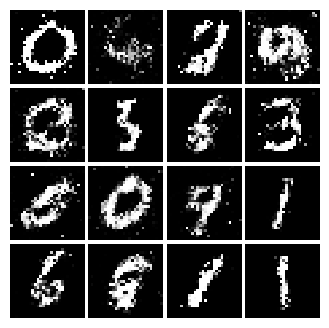

Epoch: 8, Iter: 4040, D: 0.2124, G:0.1723


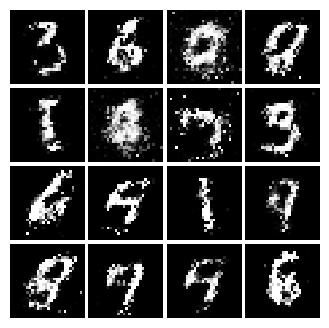

Epoch: 8, Iter: 4060, D: 0.2309, G:0.1612


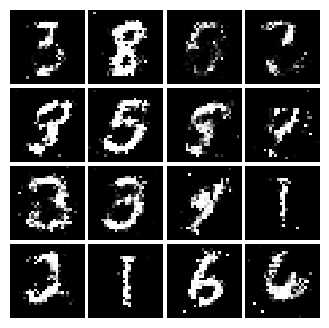

Epoch: 8, Iter: 4080, D: 0.2484, G:0.1558


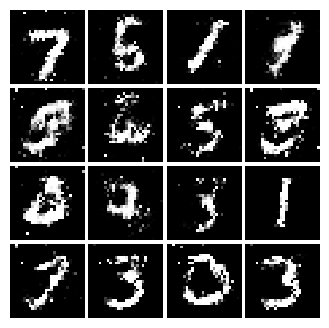

Epoch: 8, Iter: 4100, D: 0.2281, G:0.1666


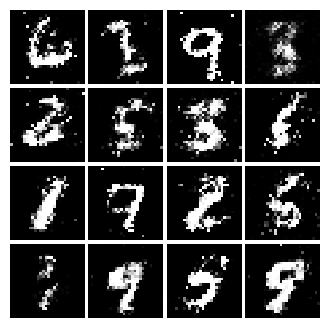

Epoch: 8, Iter: 4120, D: 0.2471, G:0.1597


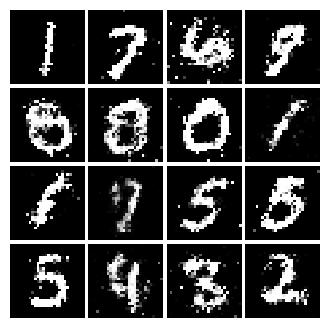

Epoch: 8, Iter: 4140, D: 0.2237, G:0.1684


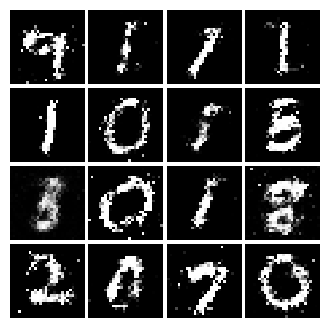

Epoch: 8, Iter: 4160, D: 0.243, G:0.1501


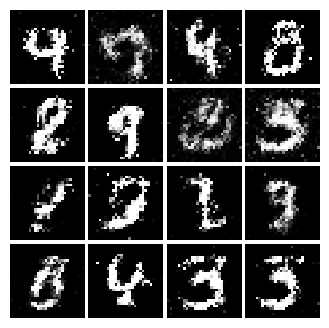

Epoch: 8, Iter: 4180, D: 0.243, G:0.1439


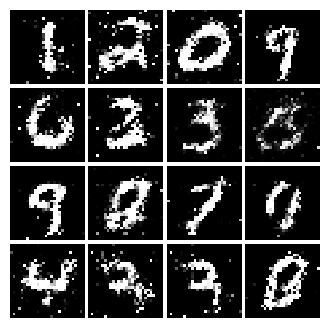

Epoch: 8, Iter: 4200, D: 0.2233, G:0.1928


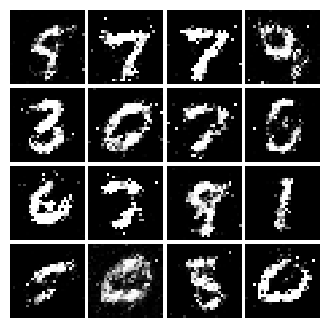

Epoch: 8, Iter: 4220, D: 0.2562, G:0.1879


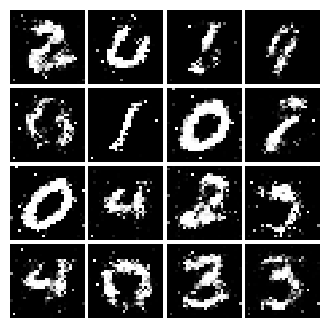

Epoch: 9, Iter: 4240, D: 0.2394, G:0.1515


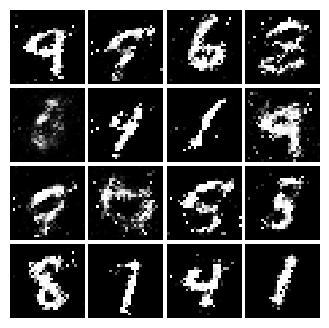

Epoch: 9, Iter: 4260, D: 0.2395, G:0.1417


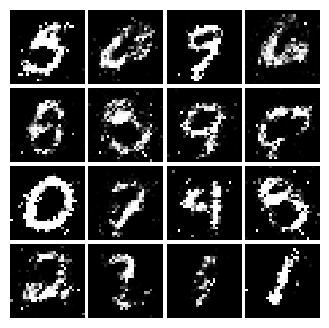

Epoch: 9, Iter: 4280, D: 0.2655, G:0.1528


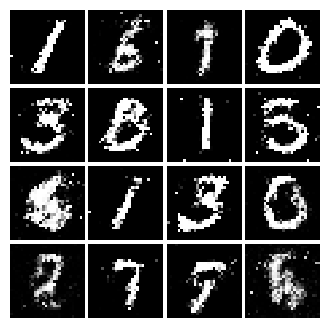

Epoch: 9, Iter: 4300, D: 0.2402, G:0.1564


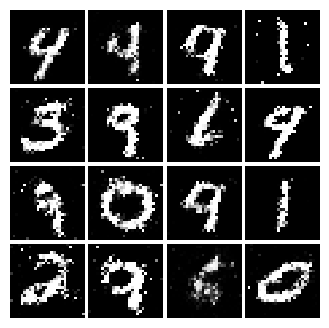

Epoch: 9, Iter: 4320, D: 0.2351, G:0.1718


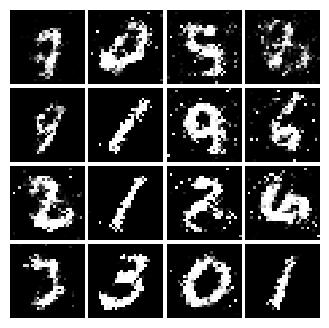

Epoch: 9, Iter: 4340, D: 0.2376, G:0.1584


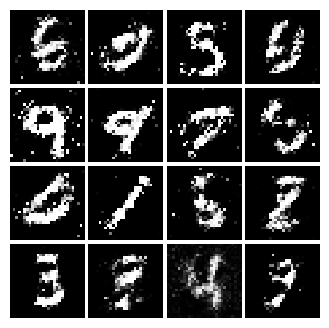

Epoch: 9, Iter: 4360, D: 0.2229, G:0.1878


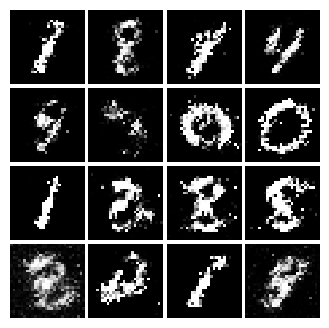

Epoch: 9, Iter: 4380, D: 0.2645, G:0.1558


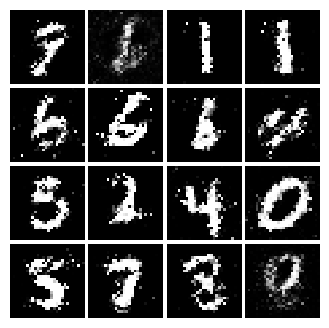

Epoch: 9, Iter: 4400, D: 0.209, G:0.18


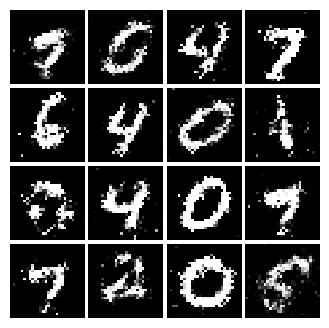

Epoch: 9, Iter: 4420, D: 0.2298, G:0.1441


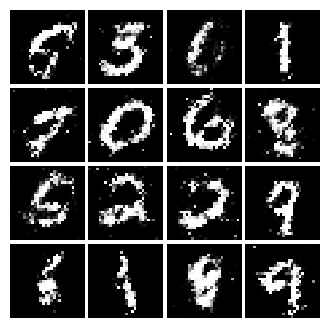

Epoch: 9, Iter: 4440, D: 0.2369, G:0.1511


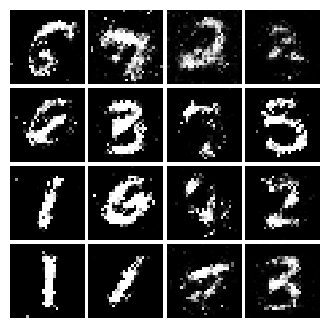

Epoch: 9, Iter: 4460, D: 0.233, G:0.1444


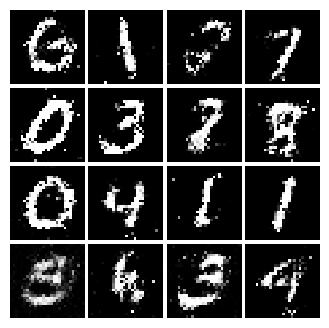

Epoch: 9, Iter: 4480, D: 0.2206, G:0.1745


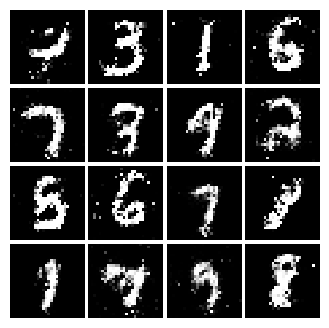

Epoch: 9, Iter: 4500, D: 0.2885, G:0.1437


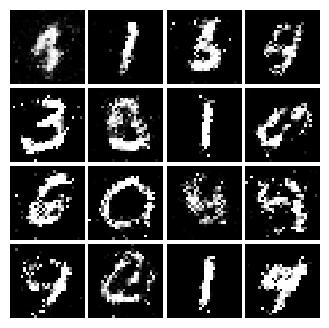

Epoch: 9, Iter: 4520, D: 0.2353, G:0.1685


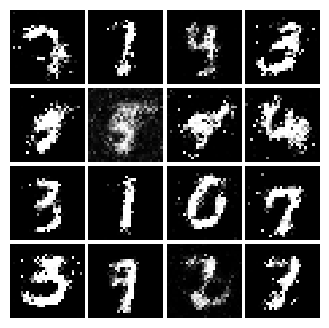

Epoch: 9, Iter: 4540, D: 0.2345, G:0.1508


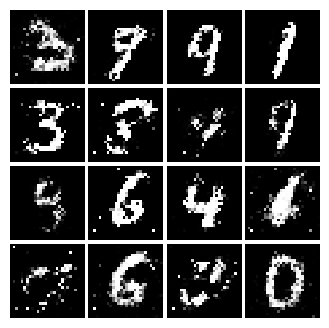

Epoch: 9, Iter: 4560, D: 0.2226, G:0.1697


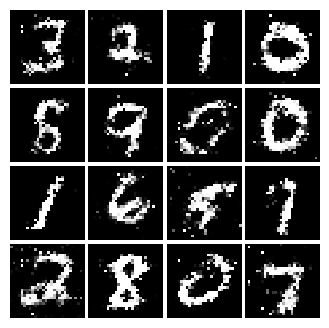

Epoch: 9, Iter: 4580, D: 0.2373, G:0.1661


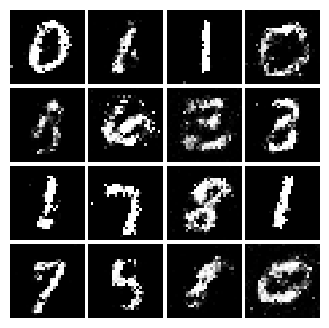

Epoch: 9, Iter: 4600, D: 0.2631, G:0.1652


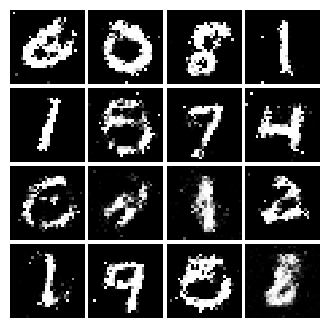

Epoch: 9, Iter: 4620, D: 0.2486, G:0.1475


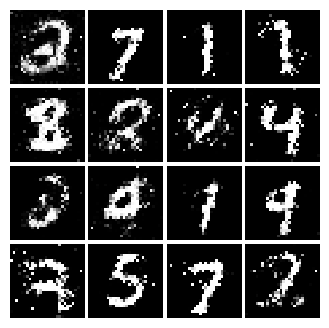

Epoch: 9, Iter: 4640, D: 0.238, G:0.164


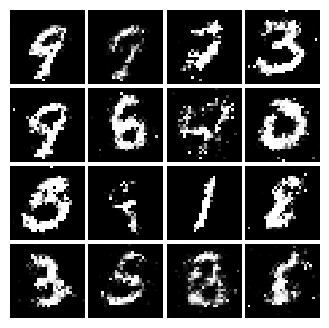

Epoch: 9, Iter: 4660, D: 0.2312, G:0.1566


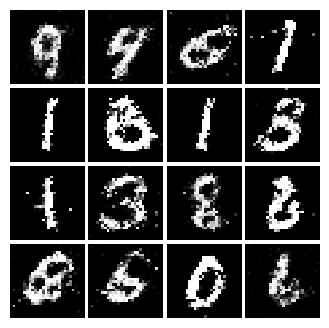

Epoch: 9, Iter: 4680, D: 0.2257, G:0.1707


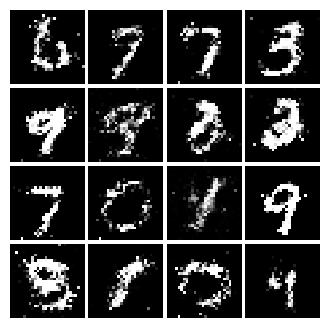

Final images


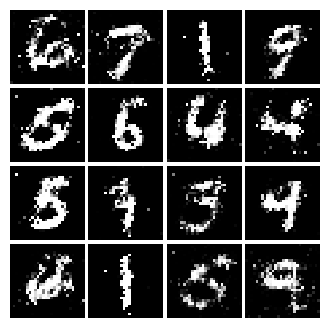

In [28]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

In [29]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.InputLayer(input_shape=(784,)),
        tf.keras.layers.Reshape((28, 28, 1)),
        tf.keras.layers.Conv2D(32, (5, 5), strides=1, padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2, 2), strides=2),
        tf.keras.layers.Conv2D(64, (5, 5), strides=1, padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2, 2), strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
    ])
    return model

# Create the model
model = discriminator()

# Test the model
batch_size = 32
dummy_input = np.random.rand(batch_size, 784).astype(np.float32)  # Batch of random input images
dummy_output = model(dummy_input)

print(dummy_output)


tf.Tensor(
[[-0.28454608]
 [-0.28560317]
 [-0.29209238]
 [-0.29109752]
 [-0.2966789 ]
 [-0.30915302]
 [-0.31095463]
 [-0.30217308]
 [-0.34463197]
 [-0.3287496 ]
 [-0.28332227]
 [-0.3225364 ]
 [-0.27810508]
 [-0.28289205]
 [-0.3370024 ]
 [-0.3077074 ]
 [-0.28118148]
 [-0.27667427]
 [-0.31521365]
 [-0.27133736]
 [-0.3049547 ]
 [-0.30536324]
 [-0.29827115]
 [-0.2999397 ]
 [-0.2970559 ]
 [-0.30718255]
 [-0.32126784]
 [-0.31656092]
 [-0.33490524]
 [-0.3046888 ]
 [-0.28299522]
 [-0.28814048]], shape=(32, 1), dtype=float32)


Epoch: 0, Iter: 0, D: 1.421, G:0.5102


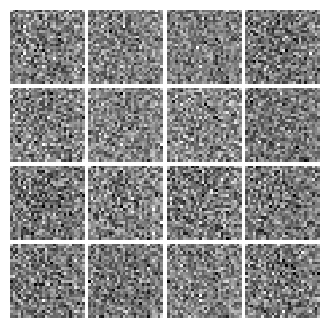

Epoch: 0, Iter: 20, D: 1.913, G:2.357


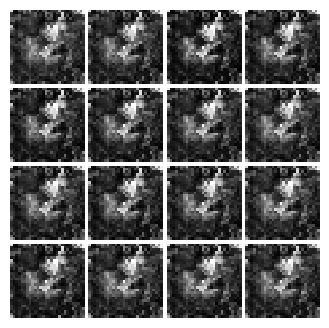

Epoch: 0, Iter: 40, D: 1.142, G:1.08


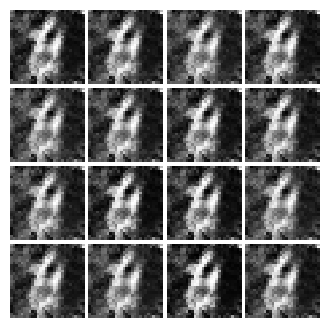

Epoch: 0, Iter: 60, D: 0.801, G:3.84


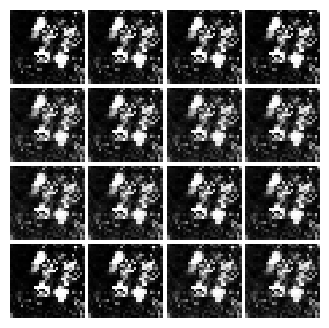

Epoch: 0, Iter: 80, D: 0.6481, G:2.21


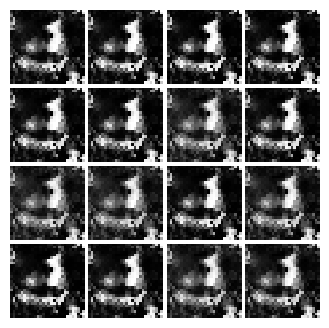

Epoch: 0, Iter: 100, D: 0.559, G:1.342


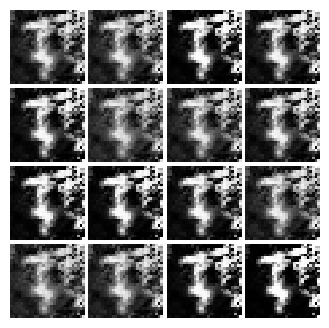

Epoch: 0, Iter: 120, D: 0.7984, G:2.135


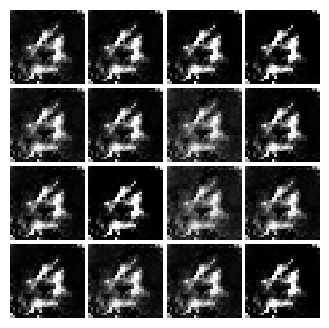

Epoch: 0, Iter: 140, D: 0.3544, G:2.545


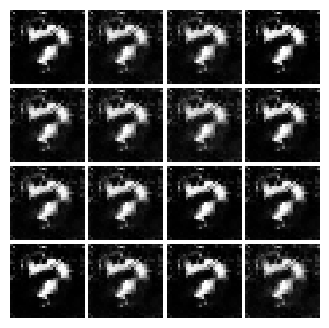

Epoch: 0, Iter: 160, D: 0.1914, G:3.608


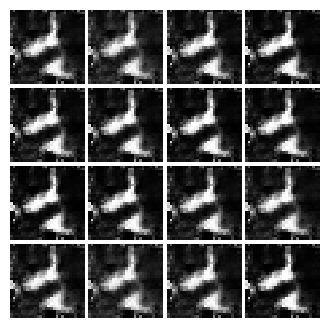

Epoch: 0, Iter: 180, D: 0.4775, G:2.676


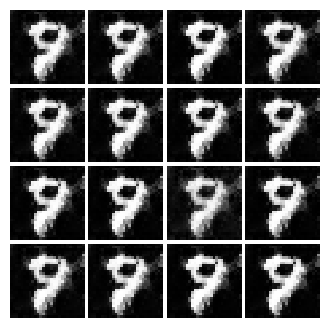

Epoch: 0, Iter: 200, D: 0.4219, G:2.737


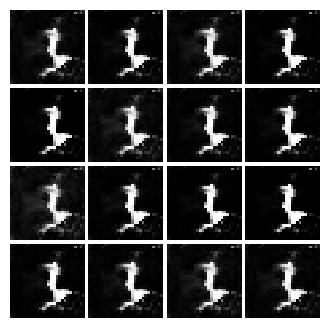

Epoch: 0, Iter: 220, D: 0.3123, G:2.8


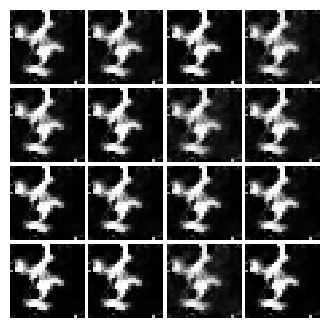

Epoch: 0, Iter: 240, D: 0.1118, G:2.49


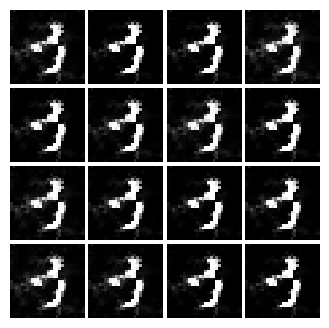

Epoch: 0, Iter: 260, D: 0.748, G:4.262


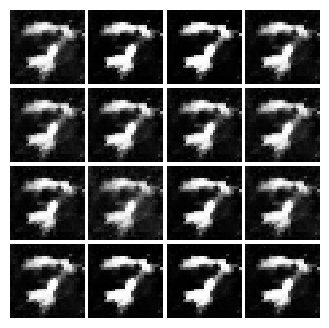

Epoch: 0, Iter: 280, D: 0.2796, G:2.809


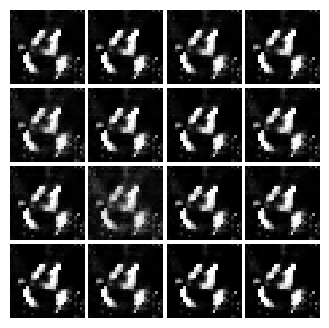

Epoch: 0, Iter: 300, D: 0.173, G:2.209


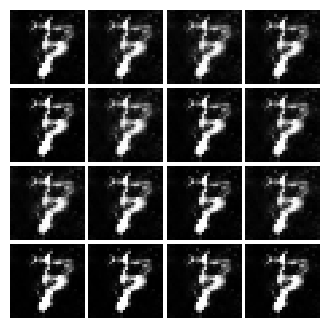

Epoch: 0, Iter: 320, D: 0.2301, G:3.115


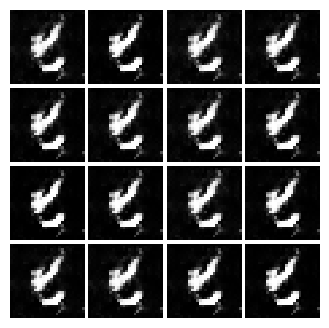

Epoch: 0, Iter: 340, D: 0.0828, G:4.258


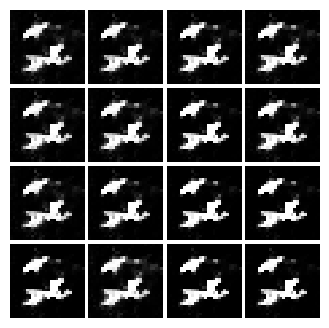

Epoch: 0, Iter: 360, D: 0.3563, G:3.237


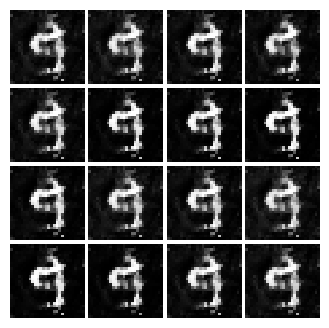

Epoch: 0, Iter: 380, D: 0.4267, G:2.646


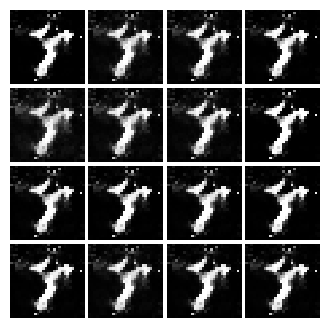

Epoch: 0, Iter: 400, D: 0.4519, G:2.317


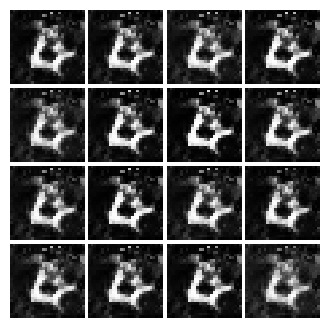

Epoch: 0, Iter: 420, D: 0.3595, G:3.106


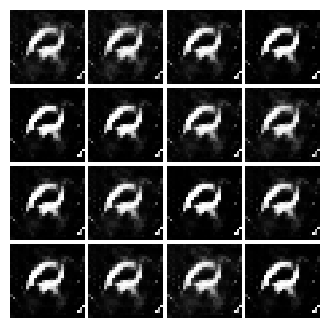

Epoch: 0, Iter: 440, D: 0.2264, G:4.488


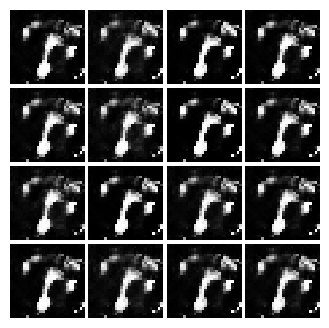

Epoch: 0, Iter: 460, D: 0.4223, G:2.912


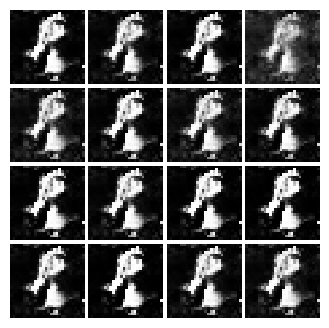

Epoch: 1, Iter: 480, D: 3.812, G:5.128


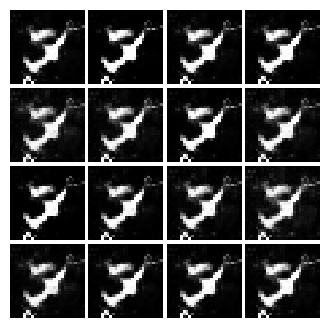

Epoch: 1, Iter: 500, D: 0.196, G:3.351


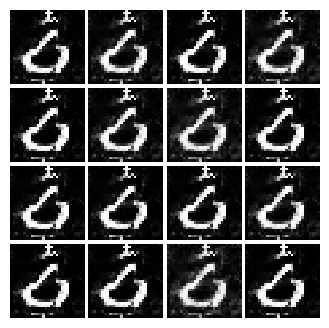

Epoch: 1, Iter: 520, D: 1.087, G:5.464


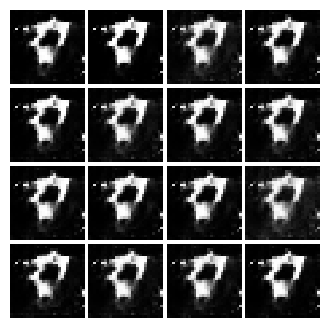

Epoch: 1, Iter: 540, D: 0.3917, G:2.345


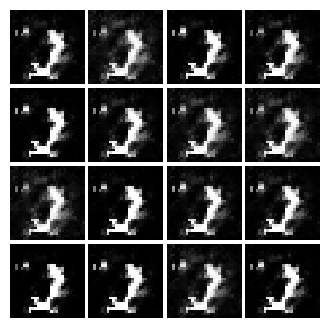

Epoch: 1, Iter: 560, D: 0.3033, G:4.498


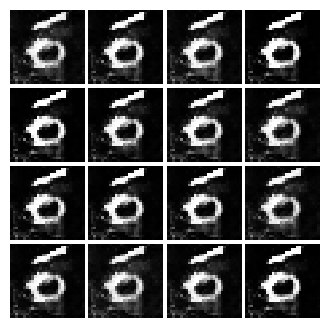

Epoch: 1, Iter: 580, D: 1.414, G:11.47


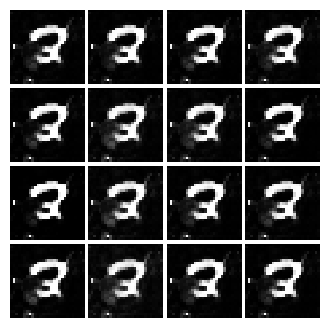

Epoch: 1, Iter: 600, D: 0.8979, G:4.175


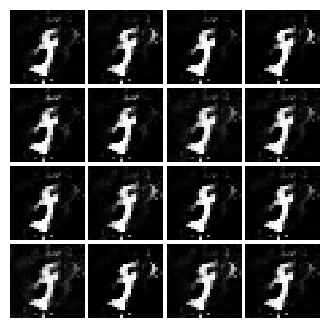

Epoch: 1, Iter: 620, D: 0.07838, G:4.954


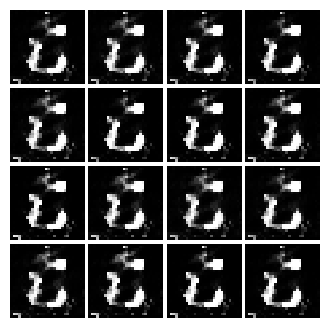

Epoch: 1, Iter: 640, D: 0.1577, G:3.898


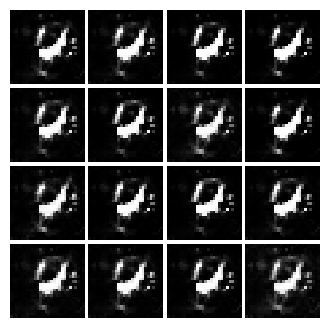

Epoch: 1, Iter: 660, D: 0.3657, G:3.826


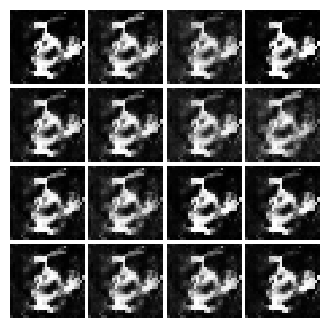

Epoch: 1, Iter: 680, D: 0.4084, G:2.118


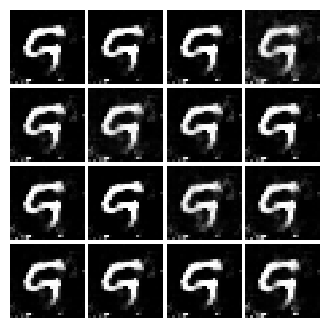

Epoch: 1, Iter: 700, D: 0.225, G:3.734


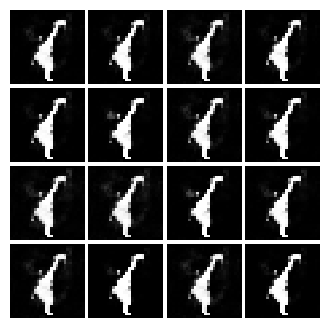

Epoch: 1, Iter: 720, D: 0.2463, G:2.83


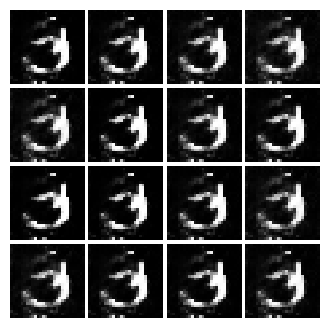

Epoch: 1, Iter: 740, D: 1.275, G:3.632


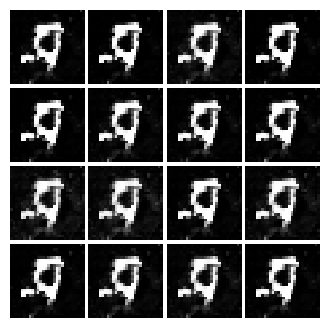

Epoch: 1, Iter: 760, D: 0.2899, G:3.627


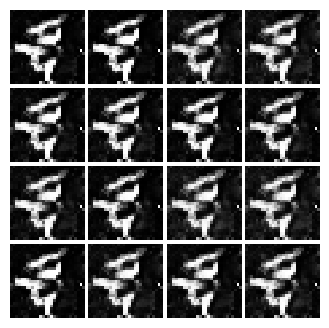

Epoch: 1, Iter: 780, D: 0.2654, G:5.179


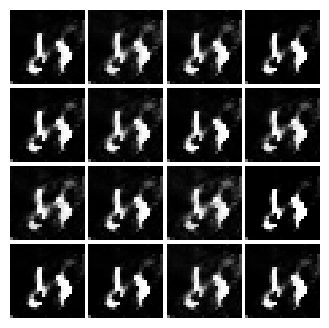

Epoch: 1, Iter: 800, D: 2.255, G:8.256


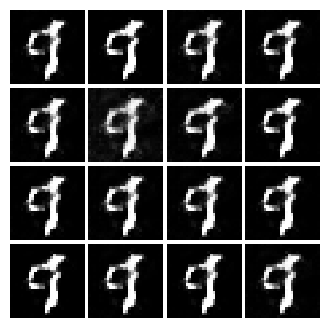

Epoch: 1, Iter: 820, D: 0.3382, G:4.775


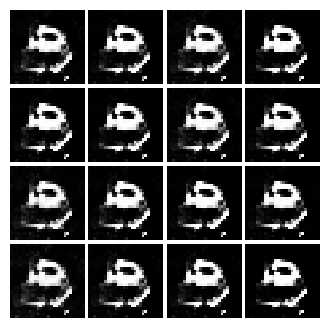

Epoch: 1, Iter: 840, D: 1.583, G:8.572


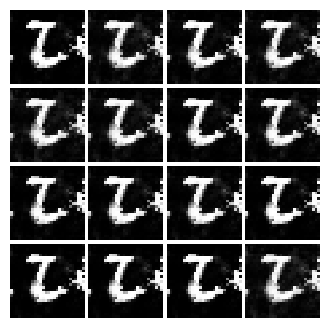

Epoch: 1, Iter: 860, D: 3.323, G:6.154


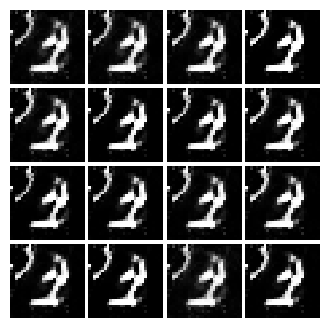

Epoch: 1, Iter: 880, D: 3.316, G:4.544


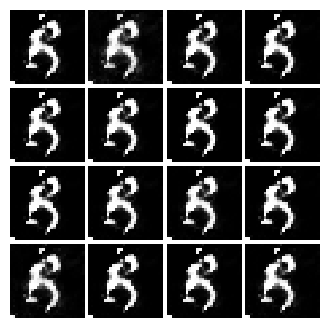

Epoch: 1, Iter: 900, D: 0.5081, G:4.01


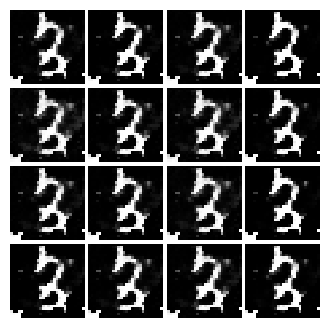

Epoch: 1, Iter: 920, D: 0.1521, G:6.794


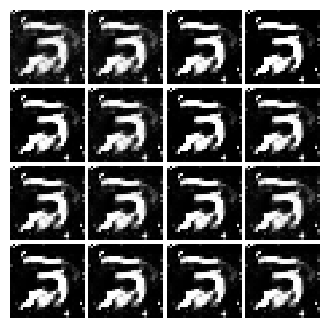

Epoch: 2, Iter: 940, D: 0.2046, G:3.691


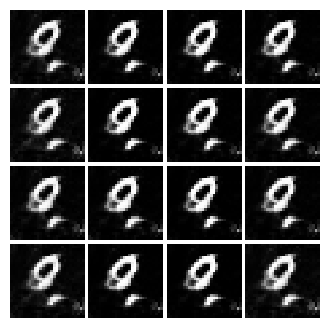

Epoch: 2, Iter: 960, D: 0.5782, G:4.724


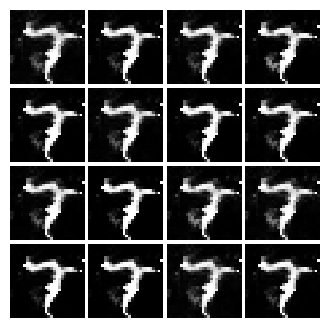

Epoch: 2, Iter: 980, D: 0.2878, G:3.511


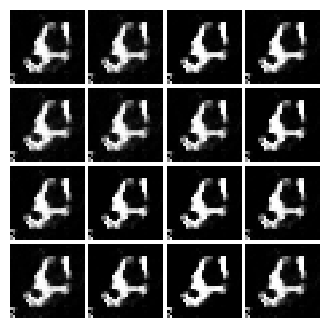

Epoch: 2, Iter: 1000, D: 0.3743, G:5.028


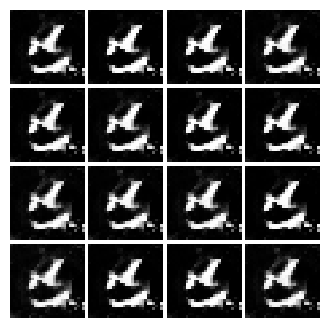

Epoch: 2, Iter: 1020, D: 0.4366, G:5.603


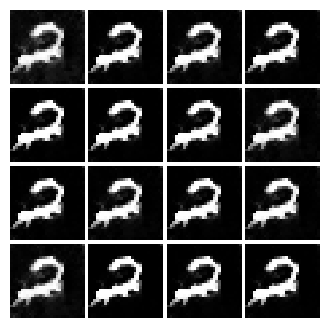

Epoch: 2, Iter: 1040, D: 0.4097, G:4.368


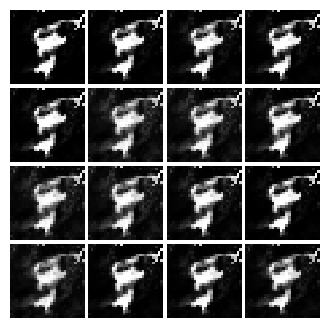

Epoch: 2, Iter: 1060, D: 0.2423, G:4.326


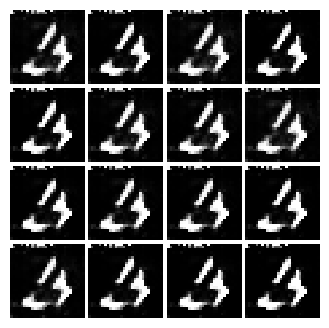

Epoch: 2, Iter: 1080, D: 0.1955, G:4.127


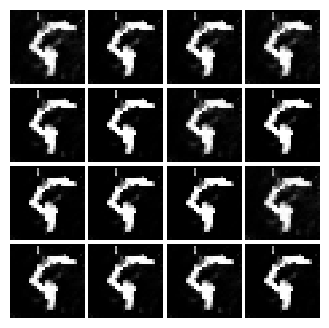

Epoch: 2, Iter: 1100, D: 0.3133, G:3.532


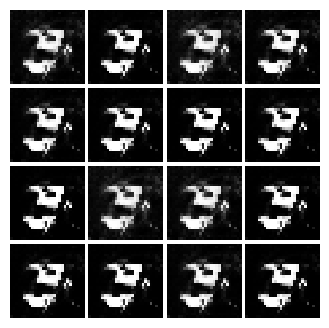

Epoch: 2, Iter: 1120, D: 0.09661, G:4.298


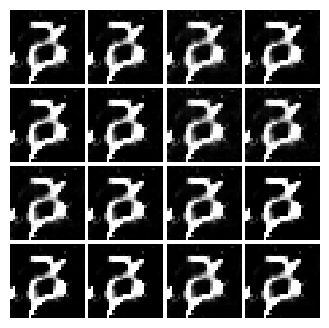

Epoch: 2, Iter: 1140, D: 0.2999, G:5.761


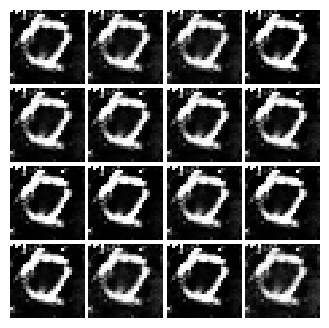

Epoch: 2, Iter: 1160, D: 0.1106, G:4.434


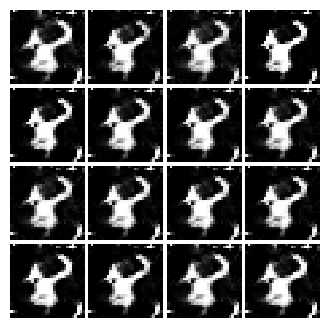

Epoch: 2, Iter: 1180, D: 3.441, G:11.19


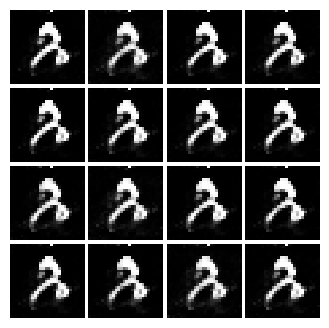

Epoch: 2, Iter: 1200, D: 0.3618, G:5.511


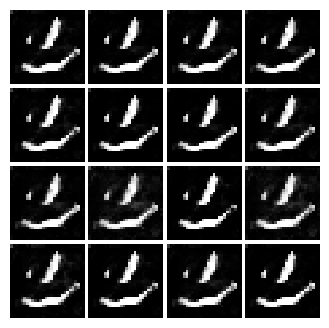

Epoch: 2, Iter: 1220, D: 0.7539, G:4.478


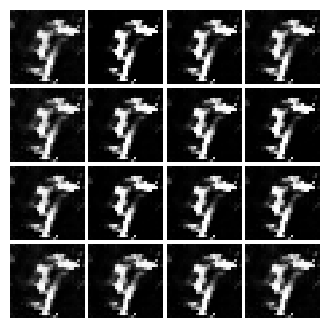

Epoch: 2, Iter: 1240, D: 0.3639, G:6.816


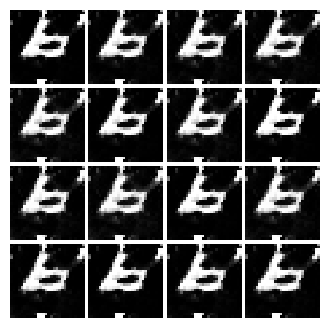

Epoch: 2, Iter: 1260, D: 0.4141, G:4.541


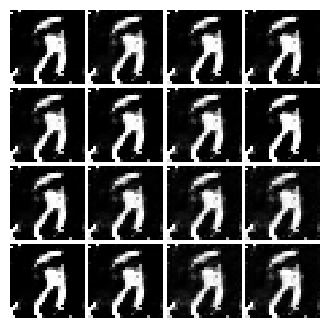

Epoch: 2, Iter: 1280, D: 3.528, G:11.42


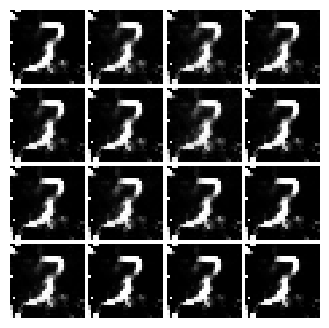

Epoch: 2, Iter: 1300, D: 0.3073, G:3.902


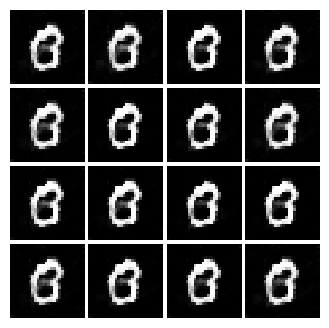

Epoch: 2, Iter: 1320, D: 0.3863, G:4.068


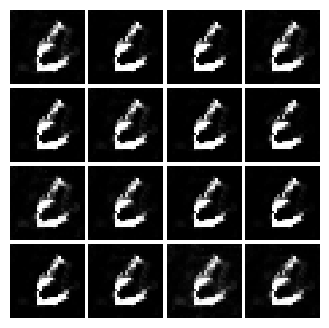

Epoch: 2, Iter: 1340, D: 0.1791, G:5.689


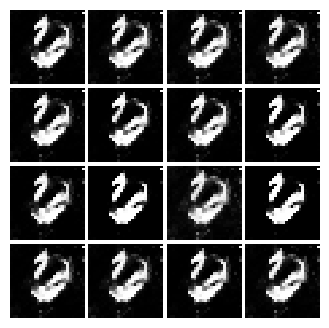

Epoch: 2, Iter: 1360, D: 0.325, G:3.026


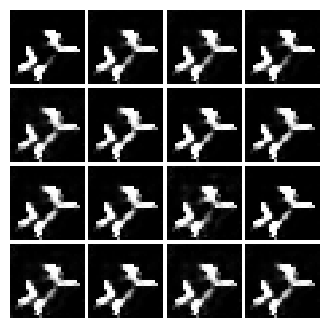

Epoch: 2, Iter: 1380, D: 0.1312, G:4.611


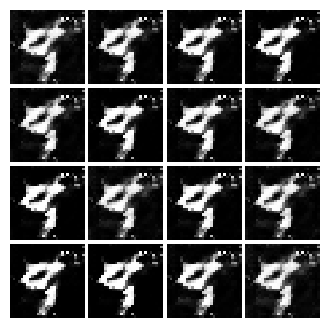

Epoch: 2, Iter: 1400, D: 0.2444, G:3.001


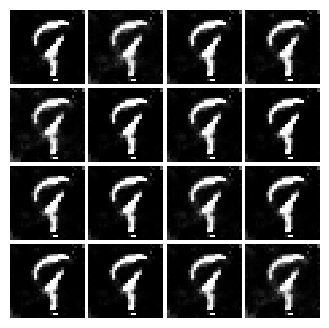

Epoch: 3, Iter: 1420, D: 0.2456, G:3.275


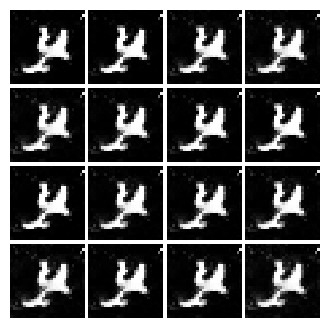

Epoch: 3, Iter: 1440, D: 0.8728, G:3.992


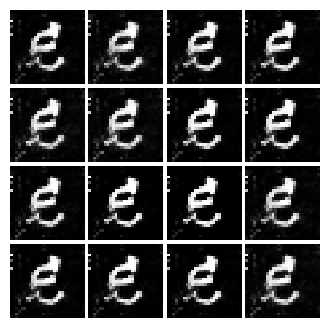

Epoch: 3, Iter: 1460, D: 0.2954, G:3.814


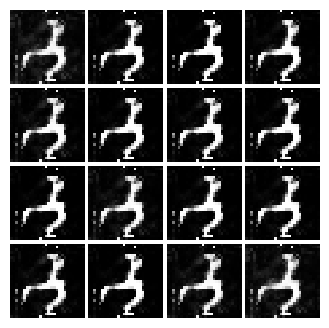

Epoch: 3, Iter: 1480, D: 0.708, G:4.528


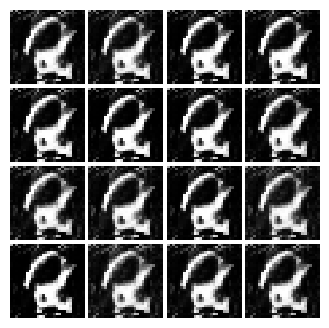

Epoch: 3, Iter: 1500, D: 0.4223, G:3.275


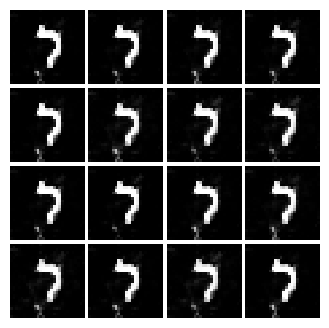

Epoch: 3, Iter: 1520, D: 0.2079, G:4.426


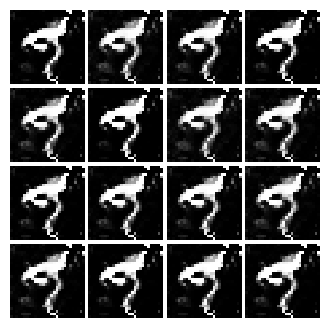

Epoch: 3, Iter: 1540, D: 0.3393, G:4.606


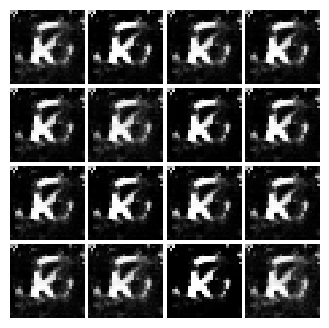

Epoch: 3, Iter: 1560, D: 0.5157, G:6.091


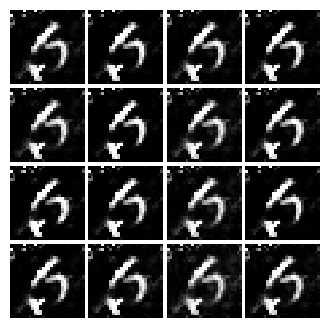

Epoch: 3, Iter: 1580, D: 1.648, G:5.059


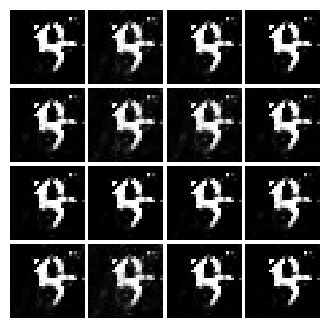

Epoch: 3, Iter: 1600, D: 0.1439, G:4.072


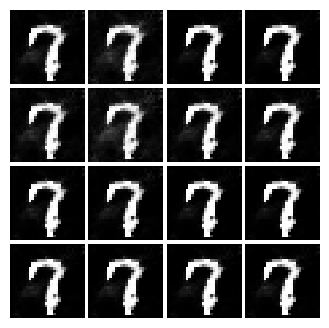

Epoch: 3, Iter: 1620, D: 0.257, G:5.011


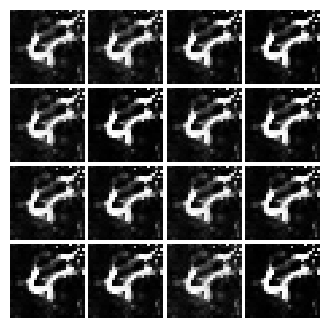

Epoch: 3, Iter: 1640, D: 0.003743, G:5.442


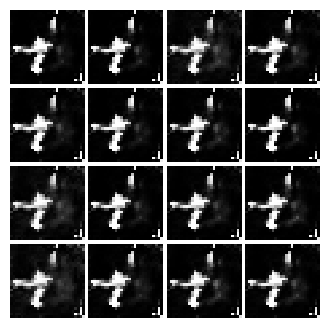

Epoch: 3, Iter: 1660, D: 0.08763, G:4.242


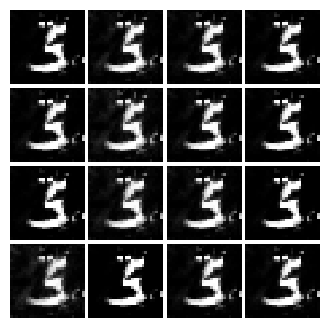

Epoch: 3, Iter: 1680, D: 0.4163, G:3.129


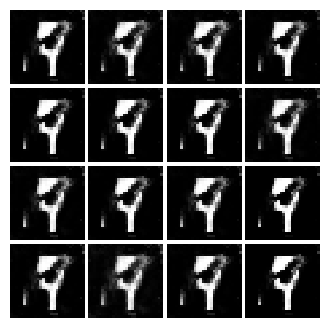

Epoch: 3, Iter: 1700, D: 0.2029, G:3.95


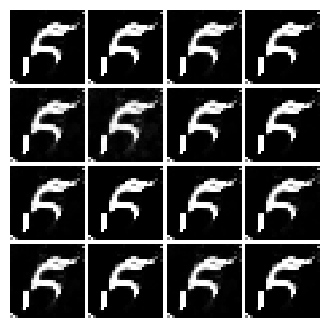

Epoch: 3, Iter: 1720, D: 0.2599, G:3.515


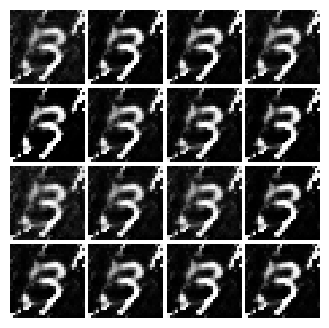

Epoch: 3, Iter: 1740, D: 1.162, G:13.65


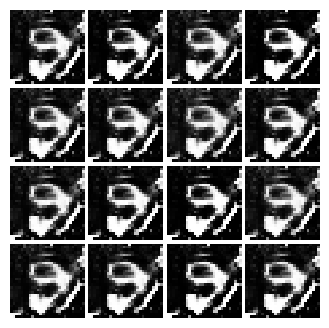

Epoch: 3, Iter: 1760, D: 1.727, G:10.46


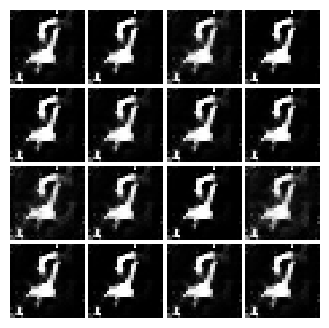

Epoch: 3, Iter: 1780, D: 0.2028, G:4.15


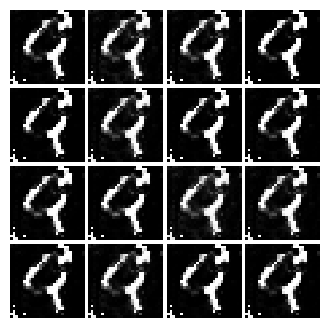

Epoch: 3, Iter: 1800, D: 0.2032, G:3.027


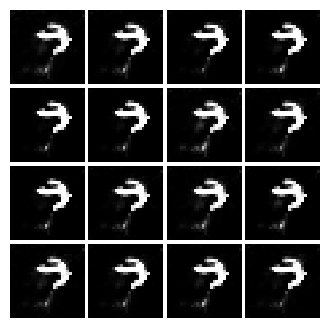

Epoch: 3, Iter: 1820, D: 0.3361, G:4.307


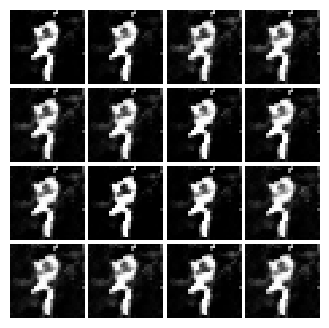

Epoch: 3, Iter: 1840, D: 0.7878, G:2.961


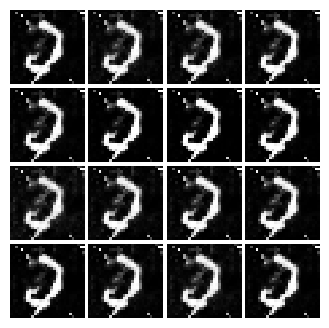

Epoch: 3, Iter: 1860, D: 0.3483, G:6.197


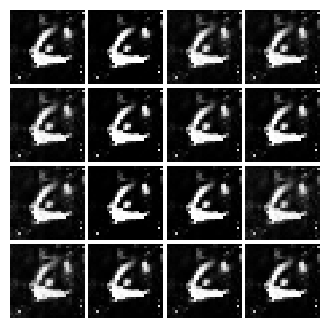

Epoch: 4, Iter: 1880, D: 0.06195, G:3.341


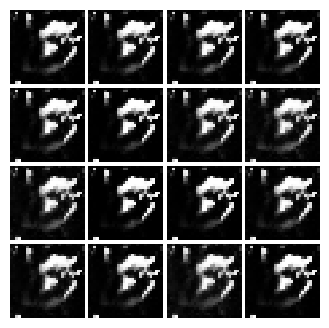

Epoch: 4, Iter: 1900, D: 0.7389, G:11.2


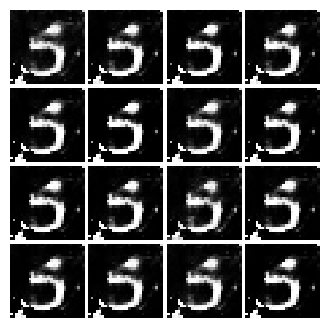

Epoch: 4, Iter: 1920, D: 0.3655, G:3.895


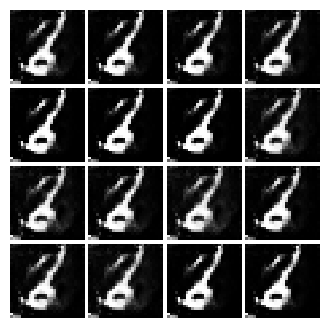

Epoch: 4, Iter: 1940, D: 0.6762, G:9.254


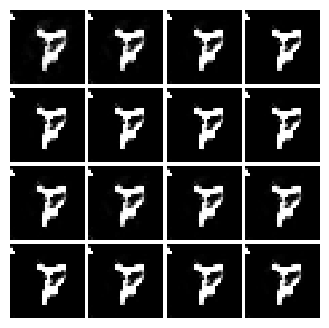

Epoch: 4, Iter: 1960, D: 0.1325, G:4.126


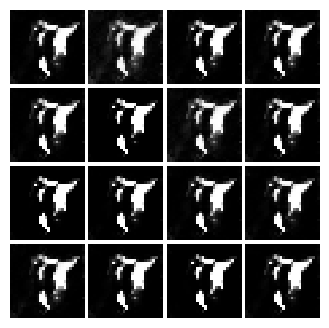

Epoch: 4, Iter: 1980, D: 0.3613, G:2.663


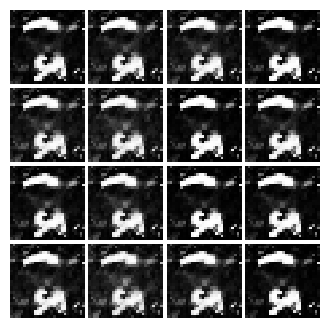

Epoch: 4, Iter: 2000, D: 0.3592, G:4.347


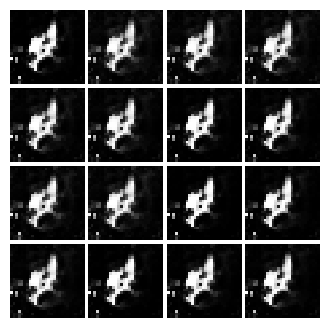

Epoch: 4, Iter: 2020, D: 0.3105, G:4.424


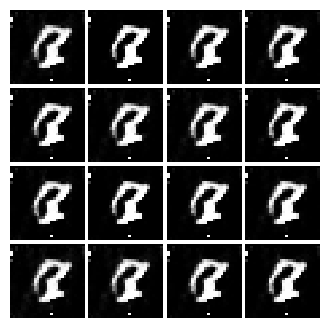

Epoch: 4, Iter: 2040, D: 0.03108, G:4.207


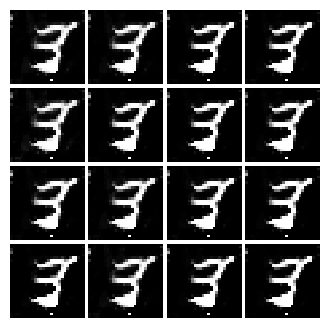

Epoch: 4, Iter: 2060, D: 0.04266, G:3.67


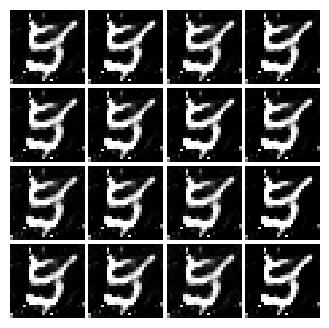

Epoch: 4, Iter: 2080, D: 0.06812, G:4.943


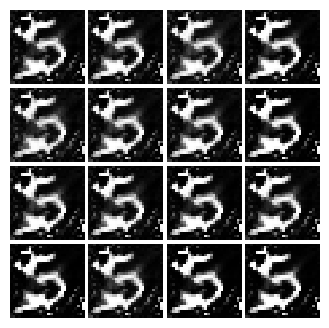

Epoch: 4, Iter: 2100, D: 2.139, G:6.713


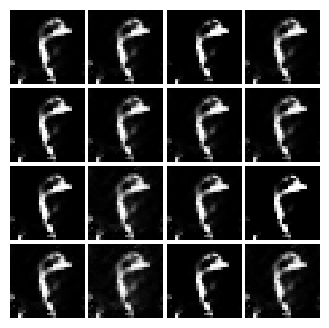

Epoch: 4, Iter: 2120, D: 0.1936, G:3.821


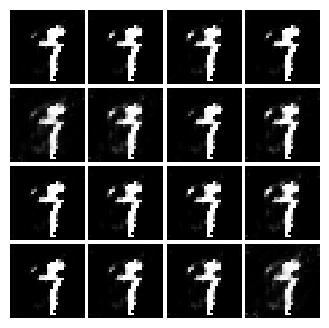

Epoch: 4, Iter: 2140, D: 2.019, G:7.816


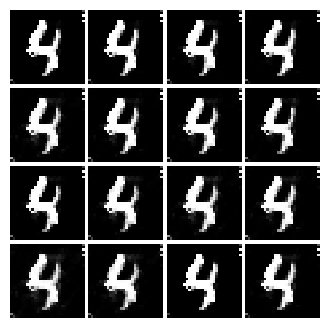

Epoch: 4, Iter: 2160, D: 0.2021, G:3.82


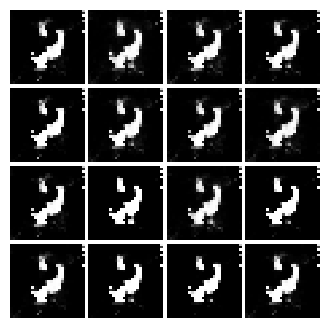

Epoch: 4, Iter: 2180, D: 0.2551, G:5.182


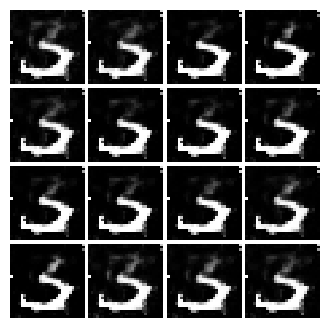

Epoch: 4, Iter: 2200, D: 0.6626, G:4.514


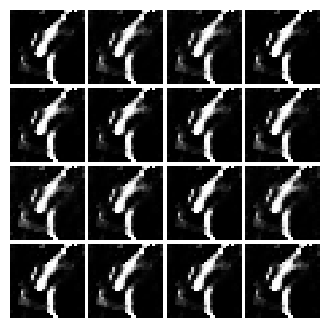

Epoch: 4, Iter: 2220, D: 0.2832, G:4.074


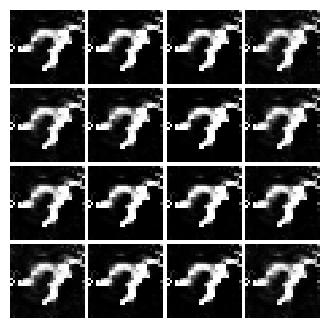

Epoch: 4, Iter: 2240, D: 0.2462, G:4.229


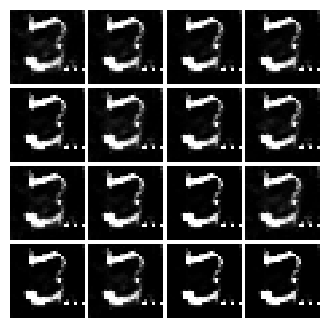

Epoch: 4, Iter: 2260, D: 0.1097, G:3.094


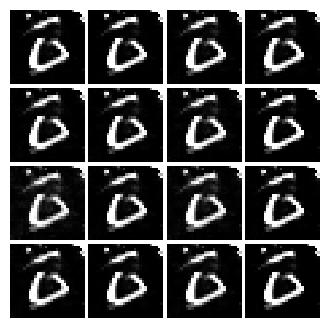

Epoch: 4, Iter: 2280, D: 0.1407, G:4.245


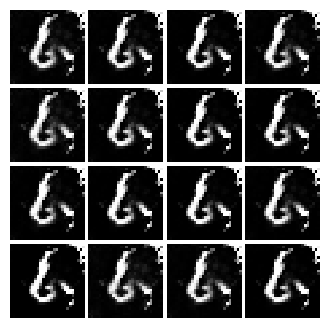

Epoch: 4, Iter: 2300, D: 0.5624, G:1.468


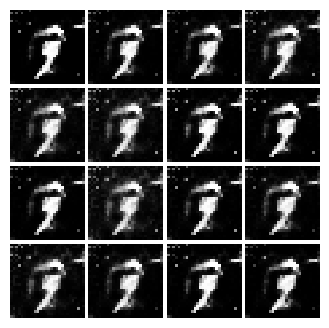

Epoch: 4, Iter: 2320, D: 0.5462, G:4.037


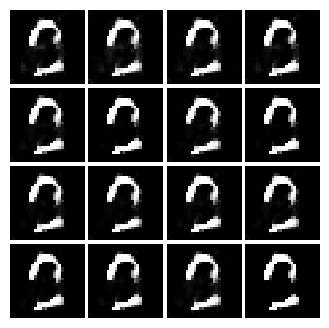

Epoch: 4, Iter: 2340, D: 0.1516, G:3.74


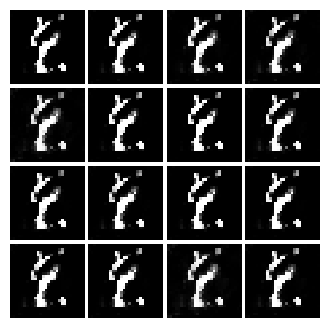

Final images


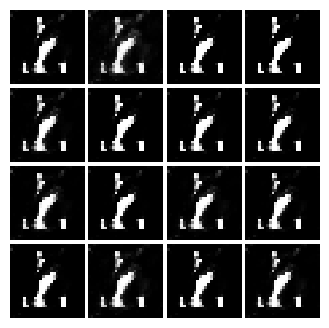

In [30]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)